# RT Behav Analysis
Updated: 10/14/2024
*ran for COSYNE 2025 abstract + 10/31/24 committee meeting*

In [1]:
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt #if matplotlib error - uninstall all matplotlib and pillow versions and conda install pillow==9.4.0
import seaborn as sns
# from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import ttest_ind, pearsonr, spearmanr
import pandas as pd
import random
import os
import datetime
import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
import itertools
import time 
import pickle

from matplotlib.ticker import StrMethodFormatter
import warnings
warnings.filterwarnings("ignore")



In [2]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [11]:
base_dir  = '/Users/alexandrafink/Documents/GraduateSchool/SaezLab/SWB/'
paper_dir = f'{base_dir}manuscript/'
behav_dir = f'{paper_dir}data/behav/single_subj/'
save_dir  = f'{paper_dir}data/behav/'
fig_dir   = f'{paper_dir}figs/behav/'
csyn_dir  = f'{base_dir}presentations/COSYNE_2025/'


date = datetime.date.today().strftime('%m%d%Y')
print(date)

10152024


In [4]:

import sys
# sys.path.append(f'{behav_dir}/python_pipeline/')
sys.path.append(f'{paper_dir}scripts/behav/')
from behav_utils import *


In [5]:
subj_ids = pd.read_excel(f'{base_dir}SWB_subjects.xlsx', sheet_name='Usable_Subjects', usecols=[0]).PatientID.tolist()
subj_ids



['MS002',
 'MS003',
 'MS009',
 'MS011',
 'MS015',
 'MS016',
 'MS017',
 'MS019',
 'MS022',
 'MS024',
 'MS025',
 'MS026',
 'MS027',
 'MS028',
 'MS029',
 'MS030',
 'MS033',
 'MS035',
 'MS041',
 'MS043',
 'MS048',
 'MS050',
 'DA8',
 'DA023',
 'DA026',
 'DA037',
 'DA039']

# All Subjects RT Data

In [6]:
# # all_behav = pd.read_csv(f'{behav_dir}all_behav.csv') ## this isn't normalized yet 
# raw_behav = [pd.read_csv(f'{behav_dir}{subj_id}_task_df.csv') for subj_id in subj_ids]
# all_behav = format_all_behav(raw_behav,drops_data=False)

# all_behav

Index(['subj_id', 'bdi', 'bdi_thresh', 'Round', 'TrialNum', 'RT', 'TrialOnset',
       'ChoiceOnset', 'DecisionOnset', 'FeedbackOnset', 'TrialType', 'SafeBet',
       'LowBet', 'HighBet', 'GambleChoice', 'Outcome', 'Profit', 'TotalProfit',
       'epoch', 'CpeOnset', 'logRT', 'GambleEV', 'TrialEV', 'CR', 'choiceEV',
       'rpe', 'res_type', 'cf', 'cpe', 'Round_t1', 'TrialNum_t1', 'RT_t1',
       'TrialType_t1', 'SafeBet_t1', 'LowBet_t1', 'HighBet_t1',
       'GambleChoice_t1', 'Outcome_t1', 'Profit_t1', 'TotalProfit_t1',
       'epoch_t1', 'logRT_t1', 'GambleEV_t1', 'TrialEV_t1', 'CR_t1',
       'choiceEV_t1', 'rpe_t1', 'res_type_t1', 'cf_t1', 'cpe_t1', 'keep_epoch',
       'keep_epoch_t1'],
      dtype='object')

In [8]:
raw_behav = [pd.read_csv(f'{behav_dir}{subj_id}_task_df.csv') for subj_id in subj_ids]
temp_behav,beh_drops = format_all_behav(raw_behav,return_drops=True,norm=False)

# beh_drops


In [9]:
all_orthog_rpe  = []
all_rpe_cpe_rsq = []
behav_list = []

for ix, subj_id in enumerate(subj_ids): 
#     subj_df = raw_behav[ix]
    subj_df = temp_behav[temp_behav.subj_id==subj_id].reset_index(drop=True)
    # find indices where cpe is not nan
    notnan_idx = [ix for ix,cpe in enumerate(subj_df.cpe) if not np.isnan(cpe)]
    # initialize save vector
    subj_df['orthog_rpe'] = np.nan
    # run ols regression rpe ~ cpe
    rpe_cpe = sm.OLS(subj_df.rpe,sm.add_constant(subj_df.cpe),missing='drop').fit()
    all_rpe_cpe_rsq.append(rpe_cpe.rsquared)
    subj_df['orthog_rpe'][notnan_idx] = rpe_cpe.resid
    all_orthog_rpe.extend(subj_df['orthog_rpe'])
    behav_list.append(subj_df)
    # del rpe_cpe 
    
# all_behav['orthog_rpe'] = all_orthog_rpe

In [12]:
all_behav,beh_drops = format_all_behav(behav_list,return_drops=True,norm=True)
all_behav
all_behav.to_csv(f'{csyn_dir}all_behav_{date}.csv')

# del raw_behav, behav_list, temp_behav

In [467]:
ttest_ind(all_behav[all_behav.bdi>=20].logRT,all_behav[all_behav.bdi<20].logRT)

TtestResult(statistic=-1.4348018768038135, pvalue=0.15142837764376485, df=3687.0)

In [13]:
all_behav.columns

Index(['subj_id', 'bdi', 'bdi_thresh', 'Round', 'TrialNum', 'RT', 'TrialOnset',
       'ChoiceOnset', 'DecisionOnset', 'FeedbackOnset', 'TrialType', 'SafeBet',
       'LowBet', 'HighBet', 'GambleChoice', 'Outcome', 'Profit', 'TotalProfit',
       'epoch', 'CpeOnset', 'logRT', 'GambleEV', 'TrialEV', 'CR', 'choiceEV',
       'rpe', 'res_type', 'cf', 'cpe', 'Round_t1', 'TrialNum_t1', 'RT_t1',
       'TrialType_t1', 'SafeBet_t1', 'LowBet_t1', 'HighBet_t1',
       'GambleChoice_t1', 'Outcome_t1', 'Profit_t1', 'TotalProfit_t1',
       'epoch_t1', 'logRT_t1', 'GambleEV_t1', 'TrialEV_t1', 'CR_t1',
       'choiceEV_t1', 'rpe_t1', 'res_type_t1', 'cf_t1', 'cpe_t1', 'keep_epoch',
       'keep_epoch_t1', 'orthog_rpe'],
      dtype='object')

In [15]:
all_behav = all_behav[all_behav.keep_epoch == 'keep']
all_behav = all_behav[all_behav.keep_epoch_t1 == 'keep']
all_behav

,subj_id,bdi,bdi_thresh,Round,TrialNum,RT,TrialOnset,ChoiceOnset,DecisionOnset,FeedbackOnset,...,TrialEV_t1,CR_t1,choiceEV_t1,rpe_t1,res_type_t1,cf_t1,cpe_t1,keep_epoch,keep_epoch_t1,orthog_rpe
0,MS002,14,low,1,25.0,2.059852,513.380590,513.390239,515.450091,515.457173,...,-0.423529,NaN,-0.545852,-0.553325,gamble_bad,-0.150761,-0.450578,keep,keep,0.213638
1,MS002,14,low,2,117.0,1.954564,522.640856,522.641563,524.596127,526.627092,...,0.737993,NaN,0.495438,0.954543,gamble_good,0.277858,0.728779,keep,keep,-0.383128
2,MS002,14,low,3,79.0,1.583462,531.174799,531.175599,532.759061,534.780269,...,0.152000,0.090121,NaN,-0.008658,safe_good,-0.456918,0.435467,keep,keep,0.684004
3,MS002,14,low,4,42.0,2.491611,545.592613,545.593355,548.084966,548.092333,...,0.619399,NaN,0.321229,0.702276,gamble_good,0.339089,0.398803,keep,keep,-0.255425
4,MS002,14,low,5,85.0,1.768936,555.337336,555.345720,557.114656,559.135069,...,-0.116581,0.090121,NaN,-0.008658,safe_good,-0.640612,0.618787,keep,keep,0.579806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4044,DA039,22,high,145,86.0,1.335964,2251.180979,2251.193149,2252.529113,2254.546404,...,0.745357,NaN,0.592734,0.747294,gamble_good,0.348102,0.776248,keep,keep,-0.502098
4045,DA039,22,high,146,79.0,1.079701,2259.827656,2259.828749,2260.908450,2262.926195,...,-0.297739,0.343221,NaN,0.007477,safe_good,-1.253105,0.916364,keep,keep,0.279076
4046,DA039,22,high,147,30.0,1.837272,2267.502359,2267.534059,2269.371331,2269.377701,...,-0.014213,0.343221,NaN,0.007477,safe_bad,0.356530,-0.300100,keep,keep,-0.947095
4047,DA039,22,high,148,13.0,4.030006,2282.349445,2282.350662,2286.380667,2286.389886,...,-0.115722,0.343221,NaN,0.007477,safe_bad,0.364957,-0.306469,keep,keep,0.336081


In [16]:
all_behav.to_csv(f'{behav_dir}rt_models_all_behav_{date}.csv')


# Run Models

In [17]:
######## make all possible variable combinations for regressions 
outcome_var  = 'logRT_t1'
rand_eff_var = 'subj_id'
main_var     = 'cpe'


In [18]:
all_behav.columns

Index(['subj_id', 'bdi', 'bdi_thresh', 'Round', 'TrialNum', 'RT', 'TrialOnset',
       'ChoiceOnset', 'DecisionOnset', 'FeedbackOnset', 'TrialType', 'SafeBet',
       'LowBet', 'HighBet', 'GambleChoice', 'Outcome', 'Profit', 'TotalProfit',
       'epoch', 'CpeOnset', 'logRT', 'GambleEV', 'TrialEV', 'CR', 'choiceEV',
       'rpe', 'res_type', 'cf', 'cpe', 'Round_t1', 'TrialNum_t1', 'RT_t1',
       'TrialType_t1', 'SafeBet_t1', 'LowBet_t1', 'HighBet_t1',
       'GambleChoice_t1', 'Outcome_t1', 'Profit_t1', 'TotalProfit_t1',
       'epoch_t1', 'logRT_t1', 'GambleEV_t1', 'TrialEV_t1', 'CR_t1',
       'choiceEV_t1', 'rpe_t1', 'res_type_t1', 'cf_t1', 'cpe_t1', 'keep_epoch',
       'keep_epoch_t1', 'orthog_rpe'],
      dtype='object')

In [19]:
# potential covariates 
test_vars = ['TotalProfit','Profit', 'rpe','orthog_rpe','TrialType_t1','GambleEV_t1','TrialEV_t1']

In [21]:
var_combos = [[v,main_var] for v in test_vars]

for i in range(1,len(test_vars)-1):
    iter_list = [list(tup)+[main_var] for tup in list(itertools.combinations(test_vars,i+1))]
    var_combos.extend(iter_list)

var_combos = [combo for combo in var_combos if ('rpe' in combo and 'orthog_rpe' not in combo)|
    ('rpe' not in combo and 'orthog_rpe' in combo)|('rpe'not in combo and 'orthog_rpe' not in combo)]

var_combos = [combo for combo in var_combos if ('GambleEV_t1' in combo and 'TrialEV_t1' not in combo)|
    ('GambleEV_t1' not in combo and 'TrialEV_t1' in combo)|('GambleEV_t1'not in combo and 'TrialEV_t1' not in combo)]

var_combos

[['TotalProfit', 'cpe'],
 ['Profit', 'cpe'],
 ['rpe', 'cpe'],
 ['orthog_rpe', 'cpe'],
 ['TrialType_t1', 'cpe'],
 ['GambleEV_t1', 'cpe'],
 ['TrialEV_t1', 'cpe'],
 ['TotalProfit', 'Profit', 'cpe'],
 ['TotalProfit', 'rpe', 'cpe'],
 ['TotalProfit', 'orthog_rpe', 'cpe'],
 ['TotalProfit', 'TrialType_t1', 'cpe'],
 ['TotalProfit', 'GambleEV_t1', 'cpe'],
 ['TotalProfit', 'TrialEV_t1', 'cpe'],
 ['Profit', 'rpe', 'cpe'],
 ['Profit', 'orthog_rpe', 'cpe'],
 ['Profit', 'TrialType_t1', 'cpe'],
 ['Profit', 'GambleEV_t1', 'cpe'],
 ['Profit', 'TrialEV_t1', 'cpe'],
 ['rpe', 'TrialType_t1', 'cpe'],
 ['rpe', 'GambleEV_t1', 'cpe'],
 ['rpe', 'TrialEV_t1', 'cpe'],
 ['orthog_rpe', 'TrialType_t1', 'cpe'],
 ['orthog_rpe', 'GambleEV_t1', 'cpe'],
 ['orthog_rpe', 'TrialEV_t1', 'cpe'],
 ['TrialType_t1', 'GambleEV_t1', 'cpe'],
 ['TrialType_t1', 'TrialEV_t1', 'cpe'],
 ['TotalProfit', 'Profit', 'rpe', 'cpe'],
 ['TotalProfit', 'Profit', 'orthog_rpe', 'cpe'],
 ['TotalProfit', 'Profit', 'TrialType_t1', 'cpe'],
 ['TotalPro

In [22]:
len(var_combos)

71

In [23]:
# import time 
start = time.time() # start timer

all_models = {}
model_fits = {}
no_conv = []

for model_vars in var_combos:
    model_key = ''.join(model_vars) ### make string of covariate var names to use as dict key
    model_fit = fit_mixed_model(all_behav,model_vars,outcome_var,rand_eff_var,reml=False)
    # check if model converged
    if model_fit.converged:
        print(model_key,' converged!')
        all_models[model_key] = {'var_list':model_vars,
                                 'fe_coeff':model_fit.params.to_numpy()[1:len(model_fit.fe_params)],
                                 'fe_pvals':model_fit.pvalues.to_numpy()[1:len(model_fit.fe_params)],
                                                                         'bic':model_fit.bic}
        model_fits[model_key] = model_fit
    else:
        print(model_key,' did not converge :(')
        no_conv.append(model_key)
    del model_fit

end = time.time()
print('{:.4f} s'.format(end-start)) # print time elapsed for computation (approx 20 seconds per channel)    



TotalProfitcpe  converged!
Profitcpe  converged!
rpecpe  converged!
orthog_rpecpe  converged!
TrialType_t1cpe  converged!
GambleEV_t1cpe  converged!
TrialEV_t1cpe  converged!
TotalProfitProfitcpe  converged!
TotalProfitrpecpe  converged!
TotalProfitorthog_rpecpe  converged!
TotalProfitTrialType_t1cpe  converged!
TotalProfitGambleEV_t1cpe  converged!
TotalProfitTrialEV_t1cpe  converged!
Profitrpecpe  converged!
Profitorthog_rpecpe  converged!
ProfitTrialType_t1cpe  converged!
ProfitGambleEV_t1cpe  converged!
ProfitTrialEV_t1cpe  converged!
rpeTrialType_t1cpe  converged!
rpeGambleEV_t1cpe  converged!
rpeTrialEV_t1cpe  converged!
orthog_rpeTrialType_t1cpe  converged!
orthog_rpeGambleEV_t1cpe  converged!
orthog_rpeTrialEV_t1cpe  converged!
TrialType_t1GambleEV_t1cpe  converged!
TrialType_t1TrialEV_t1cpe  did not converge :(
TotalProfitProfitrpecpe  converged!
TotalProfitProfitorthog_rpecpe  converged!
TotalProfitProfitTrialType_t1cpe  converged!
TotalProfitProfitGambleEV_t1cpe  converged!


In [58]:
# rt_model_fname = f'{save_dir}rt_cpe_model_fits.pkl'
# pickle.dump(model_fits,open(rt_model_fname,'wb'))

# rt_model_fname = f'{save_dir}rt_cpe_models.pkl'
# pickle.dump(all_models,open(rt_model_fname,'wb'))

In [24]:
print('var combos that did not converge: ')
no_conv


var combos that did not converge: 


['TrialType_t1TrialEV_t1cpe',
 'TotalProfitTrialType_t1TrialEV_t1cpe',
 'ProfitrpeTrialEV_t1cpe',
 'TotalProfitProfitrpeTrialEV_t1cpe',
 'TotalProfitProfitorthog_rpeTrialType_t1cpe',
 'TotalProfitProfitTrialType_t1TrialEV_t1cpe',
 'Profitorthog_rpeTrialType_t1TrialEV_t1cpe']

In [25]:
print('var combos that converged: ')
list(all_models.keys())

var combos that converged: 


['TotalProfitcpe',
 'Profitcpe',
 'rpecpe',
 'orthog_rpecpe',
 'TrialType_t1cpe',
 'GambleEV_t1cpe',
 'TrialEV_t1cpe',
 'TotalProfitProfitcpe',
 'TotalProfitrpecpe',
 'TotalProfitorthog_rpecpe',
 'TotalProfitTrialType_t1cpe',
 'TotalProfitGambleEV_t1cpe',
 'TotalProfitTrialEV_t1cpe',
 'Profitrpecpe',
 'Profitorthog_rpecpe',
 'ProfitTrialType_t1cpe',
 'ProfitGambleEV_t1cpe',
 'ProfitTrialEV_t1cpe',
 'rpeTrialType_t1cpe',
 'rpeGambleEV_t1cpe',
 'rpeTrialEV_t1cpe',
 'orthog_rpeTrialType_t1cpe',
 'orthog_rpeGambleEV_t1cpe',
 'orthog_rpeTrialEV_t1cpe',
 'TrialType_t1GambleEV_t1cpe',
 'TotalProfitProfitrpecpe',
 'TotalProfitProfitorthog_rpecpe',
 'TotalProfitProfitTrialType_t1cpe',
 'TotalProfitProfitGambleEV_t1cpe',
 'TotalProfitProfitTrialEV_t1cpe',
 'TotalProfitrpeTrialType_t1cpe',
 'TotalProfitrpeGambleEV_t1cpe',
 'TotalProfitrpeTrialEV_t1cpe',
 'TotalProfitorthog_rpeTrialType_t1cpe',
 'TotalProfitorthog_rpeGambleEV_t1cpe',
 'TotalProfitorthog_rpeTrialEV_t1cpe',
 'TotalProfitTrialType_t1

In [26]:
good_var_combos = [combo for combo in var_combos if ''.join(combo) not in no_conv ]
good_models = [model_key for model_key in list(all_models.keys()) if model_key not in no_conv ]

In [27]:
# good_var_combos
good_models


['TotalProfitcpe',
 'Profitcpe',
 'rpecpe',
 'orthog_rpecpe',
 'TrialType_t1cpe',
 'GambleEV_t1cpe',
 'TrialEV_t1cpe',
 'TotalProfitProfitcpe',
 'TotalProfitrpecpe',
 'TotalProfitorthog_rpecpe',
 'TotalProfitTrialType_t1cpe',
 'TotalProfitGambleEV_t1cpe',
 'TotalProfitTrialEV_t1cpe',
 'Profitrpecpe',
 'Profitorthog_rpecpe',
 'ProfitTrialType_t1cpe',
 'ProfitGambleEV_t1cpe',
 'ProfitTrialEV_t1cpe',
 'rpeTrialType_t1cpe',
 'rpeGambleEV_t1cpe',
 'rpeTrialEV_t1cpe',
 'orthog_rpeTrialType_t1cpe',
 'orthog_rpeGambleEV_t1cpe',
 'orthog_rpeTrialEV_t1cpe',
 'TrialType_t1GambleEV_t1cpe',
 'TotalProfitProfitrpecpe',
 'TotalProfitProfitorthog_rpecpe',
 'TotalProfitProfitTrialType_t1cpe',
 'TotalProfitProfitGambleEV_t1cpe',
 'TotalProfitProfitTrialEV_t1cpe',
 'TotalProfitrpeTrialType_t1cpe',
 'TotalProfitrpeGambleEV_t1cpe',
 'TotalProfitrpeTrialEV_t1cpe',
 'TotalProfitorthog_rpeTrialType_t1cpe',
 'TotalProfitorthog_rpeGambleEV_t1cpe',
 'TotalProfitorthog_rpeTrialEV_t1cpe',
 'TotalProfitTrialType_t1

In [28]:
model_summary = {key:all_models[key]['bic'] for key in good_models}
model_summary

{'TotalProfitcpe': 3225.1000486279863,
 'Profitcpe': 3240.073541848402,
 'rpecpe': 3242.300481903845,
 'orthog_rpecpe': 3244.950913019604,
 'TrialType_t1cpe': 2888.1888112580427,
 'GambleEV_t1cpe': 2943.0933070157134,
 'TrialEV_t1cpe': 2918.6678680916066,
 'TotalProfitProfitcpe': 3255.542238944786,
 'TotalProfitrpecpe': 3255.6924019019143,
 'TotalProfitorthog_rpecpe': 3257.4988684766113,
 'TotalProfitTrialType_t1cpe': 2893.2127948340776,
 'TotalProfitGambleEV_t1cpe': 2944.8729693452306,
 'TotalProfitTrialEV_t1cpe': 2919.6391443804578,
 'Profitrpecpe': 3278.3630842772664,
 'Profitorthog_rpecpe': 3279.064789166224,
 'ProfitTrialType_t1cpe': 2924.585185133662,
 'ProfitGambleEV_t1cpe': 2972.858213826462,
 'ProfitTrialEV_t1cpe': 2948.5229562996656,
 'rpeTrialType_t1cpe': 2930.2952175897944,
 'rpeGambleEV_t1cpe': 2976.54031151204,
 'rpeTrialEV_t1cpe': 2952.4022660705423,
 'orthog_rpeTrialType_t1cpe': 2931.556420825803,
 'orthog_rpeGambleEV_t1cpe': 2978.4994643797336,
 'orthog_rpeTrialEV_t1cp

In [29]:
bic_list = [model_summary[key] for key in good_models]
bic_list.sort()

ordered_list = [list(model_summary.keys())[np.where(list(model_summary.values()) == bic)[0][0]] for bic in bic_list]
list(zip(ordered_list,bic_list))


[('TrialType_t1cpe', 2888.1888112580427),
 ('TotalProfitTrialType_t1cpe', 2893.2127948340776),
 ('TrialEV_t1cpe', 2918.6678680916066),
 ('TotalProfitTrialEV_t1cpe', 2919.6391443804578),
 ('ProfitTrialType_t1cpe', 2924.585185133662),
 ('TrialType_t1GambleEV_t1cpe', 2925.180156242269),
 ('rpeTrialType_t1cpe', 2930.2952175897944),
 ('orthog_rpeTrialType_t1cpe', 2931.556420825803),
 ('TotalProfitProfitTrialType_t1cpe', 2937.066584957942),
 ('TotalProfitTrialType_t1GambleEV_t1cpe', 2937.8439494257655),
 ('TotalProfitrpeTrialType_t1cpe', 2942.035808817931),
 ('GambleEV_t1cpe', 2943.0933070157134),
 ('TotalProfitorthog_rpeTrialType_t1cpe', 2943.1948307553466),
 ('TotalProfitGambleEV_t1cpe', 2944.8729693452306),
 ('ProfitTrialEV_t1cpe', 2948.5229562996656),
 ('rpeTrialEV_t1cpe', 2952.4022660705423),
 ('orthog_rpeTrialEV_t1cpe', 2954.1865391861147),
 ('TotalProfitProfitTrialEV_t1cpe', 2957.4502278350583),
 ('TotalProfitrpeTrialEV_t1cpe', 2960.761655453013),
 ('TotalProfitorthog_rpeTrialEV_t1cpe

In [30]:
[(key,bic,all_models[key]['fe_pvals'][-1]) for key,bic in list(zip(ordered_list,bic_list))]  


[('TrialType_t1cpe', 2888.1888112580427, 0.014402085920305223),
 ('TotalProfitTrialType_t1cpe', 2893.2127948340776, 0.00869948182022241),
 ('TrialEV_t1cpe', 2918.6678680916066, 0.01399662758431683),
 ('TotalProfitTrialEV_t1cpe', 2919.6391443804578, 0.007666160421466731),
 ('ProfitTrialType_t1cpe', 2924.585185133662, 0.701070902701105),
 ('TrialType_t1GambleEV_t1cpe', 2925.180156242269, 0.01847151133591126),
 ('rpeTrialType_t1cpe', 2930.2952175897944, 0.8083438085214358),
 ('orthog_rpeTrialType_t1cpe', 2931.556420825803, 0.013819882474153217),
 ('TotalProfitProfitTrialType_t1cpe', 2937.066584957942, 0.6717601895841157),
 ('TotalProfitTrialType_t1GambleEV_t1cpe',
  2937.8439494257655,
  0.012658705672805201),
 ('TotalProfitrpeTrialType_t1cpe', 2942.035808817931, 0.6991550501825463),
 ('GambleEV_t1cpe', 2943.0933070157134, 0.014447450001340532),
 ('TotalProfitorthog_rpeTrialType_t1cpe',
  2943.1948307553466,
  0.0075639686213802146),
 ('TotalProfitGambleEV_t1cpe', 2944.8729693452306, 0.00

In [31]:
list(zip(ordered_list,bic_list))

[('TrialType_t1cpe', 2888.1888112580427),
 ('TotalProfitTrialType_t1cpe', 2893.2127948340776),
 ('TrialEV_t1cpe', 2918.6678680916066),
 ('TotalProfitTrialEV_t1cpe', 2919.6391443804578),
 ('ProfitTrialType_t1cpe', 2924.585185133662),
 ('TrialType_t1GambleEV_t1cpe', 2925.180156242269),
 ('rpeTrialType_t1cpe', 2930.2952175897944),
 ('orthog_rpeTrialType_t1cpe', 2931.556420825803),
 ('TotalProfitProfitTrialType_t1cpe', 2937.066584957942),
 ('TotalProfitTrialType_t1GambleEV_t1cpe', 2937.8439494257655),
 ('TotalProfitrpeTrialType_t1cpe', 2942.035808817931),
 ('GambleEV_t1cpe', 2943.0933070157134),
 ('TotalProfitorthog_rpeTrialType_t1cpe', 2943.1948307553466),
 ('TotalProfitGambleEV_t1cpe', 2944.8729693452306),
 ('ProfitTrialEV_t1cpe', 2948.5229562996656),
 ('rpeTrialEV_t1cpe', 2952.4022660705423),
 ('orthog_rpeTrialEV_t1cpe', 2954.1865391861147),
 ('TotalProfitProfitTrialEV_t1cpe', 2957.4502278350583),
 ('TotalProfitrpeTrialEV_t1cpe', 2960.761655453013),
 ('TotalProfitorthog_rpeTrialEV_t1cpe

In [32]:
print('worst bic model: ',list(model_summary.keys())[np.where(list(model_summary.values())==np.max(list(model_summary.values())))[0][0]])


worst bic model:  TotalProfitProfitorthog_rpecpe


In [33]:
print('best bic model: ',list(model_summary.keys())[np.where(list(model_summary.values())==np.min(list(model_summary.values())))[0][0]])
# print(np.min(list(model_summary.values())))
      
      

best bic model:  TrialType_t1cpe


In [34]:
ordered_list[:20]

['TrialType_t1cpe',
 'TotalProfitTrialType_t1cpe',
 'TrialEV_t1cpe',
 'TotalProfitTrialEV_t1cpe',
 'ProfitTrialType_t1cpe',
 'TrialType_t1GambleEV_t1cpe',
 'rpeTrialType_t1cpe',
 'orthog_rpeTrialType_t1cpe',
 'TotalProfitProfitTrialType_t1cpe',
 'TotalProfitTrialType_t1GambleEV_t1cpe',
 'TotalProfitrpeTrialType_t1cpe',
 'GambleEV_t1cpe',
 'TotalProfitorthog_rpeTrialType_t1cpe',
 'TotalProfitGambleEV_t1cpe',
 'ProfitTrialEV_t1cpe',
 'rpeTrialEV_t1cpe',
 'orthog_rpeTrialEV_t1cpe',
 'TotalProfitProfitTrialEV_t1cpe',
 'TotalProfitrpeTrialEV_t1cpe',
 'TotalProfitorthog_rpeTrialEV_t1cpe']

In [35]:
[(key,all_models[key]['fe_pvals'][-1]) for key in ordered_list if all_models[key]['fe_pvals'][-1] < 0.05]  


[('TrialType_t1cpe', 0.014402085920305223),
 ('TotalProfitTrialType_t1cpe', 0.00869948182022241),
 ('TrialEV_t1cpe', 0.01399662758431683),
 ('TotalProfitTrialEV_t1cpe', 0.007666160421466731),
 ('TrialType_t1GambleEV_t1cpe', 0.01847151133591126),
 ('orthog_rpeTrialType_t1cpe', 0.013819882474153217),
 ('TotalProfitTrialType_t1GambleEV_t1cpe', 0.012658705672805201),
 ('GambleEV_t1cpe', 0.014447450001340532),
 ('TotalProfitorthog_rpeTrialType_t1cpe', 0.0075639686213802146),
 ('TotalProfitGambleEV_t1cpe', 0.007823087991758248),
 ('orthog_rpeTrialEV_t1cpe', 0.01337864070347492),
 ('TotalProfitorthog_rpeTrialEV_t1cpe', 0.007732908699967745),
 ('orthog_rpeTrialType_t1TrialEV_t1cpe', 0.017490614565856),
 ('orthog_rpeTrialType_t1GambleEV_t1cpe', 0.017213377649683233),
 ('orthog_rpeGambleEV_t1cpe', 0.013826934583120027),
 ('TotalProfitorthog_rpeGambleEV_t1cpe', 0.008031425503432346),
 ('TotalProfitorthog_rpeTrialType_t1TrialEV_t1cpe', 0.013366842505156034),
 ('TotalProfitorthog_rpeTrialType_t1Gam

In [36]:
[(key,all_models[key]['fe_pvals'][-1]) for key in ordered_list if all_models[key]['fe_pvals'][-1] < 0.05]  


[('TrialType_t1cpe', 0.014402085920305223),
 ('TotalProfitTrialType_t1cpe', 0.00869948182022241),
 ('TrialEV_t1cpe', 0.01399662758431683),
 ('TotalProfitTrialEV_t1cpe', 0.007666160421466731),
 ('TrialType_t1GambleEV_t1cpe', 0.01847151133591126),
 ('orthog_rpeTrialType_t1cpe', 0.013819882474153217),
 ('TotalProfitTrialType_t1GambleEV_t1cpe', 0.012658705672805201),
 ('GambleEV_t1cpe', 0.014447450001340532),
 ('TotalProfitorthog_rpeTrialType_t1cpe', 0.0075639686213802146),
 ('TotalProfitGambleEV_t1cpe', 0.007823087991758248),
 ('orthog_rpeTrialEV_t1cpe', 0.01337864070347492),
 ('TotalProfitorthog_rpeTrialEV_t1cpe', 0.007732908699967745),
 ('orthog_rpeTrialType_t1TrialEV_t1cpe', 0.017490614565856),
 ('orthog_rpeTrialType_t1GambleEV_t1cpe', 0.017213377649683233),
 ('orthog_rpeGambleEV_t1cpe', 0.013826934583120027),
 ('TotalProfitorthog_rpeGambleEV_t1cpe', 0.008031425503432346),
 ('TotalProfitorthog_rpeTrialType_t1TrialEV_t1cpe', 0.013366842505156034),
 ('TotalProfitorthog_rpeTrialType_t1Gam

# Select Final Models 

In [124]:
final_model_keys = ['TrialType_t1cpe','TotalProfitTrialType_t1cpe','orthog_rpeTrialType_t1TrialEV_t1cpe',
                'orthog_rpeTrialType_t1cpe','orthog_rpeTrialEV_t1cpe','TotalProfitorthog_rpeTrialType_t1cpe']

In [125]:
final_models = {f'{key}':all_models[key] for key in final_model_keys}

In [126]:
final_fits = {f'{key}':model_fits[key] for key in final_model_keys}

In [127]:
final_fits


{'TrialType_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x1665c3c20>,
 'TotalProfitTrialType_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x166c299a0>,
 'orthog_rpeTrialType_t1TrialEV_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x169d72f00>,
 'orthog_rpeTrialType_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x166e464b0>,
 'orthog_rpeTrialEV_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x166560c20>,
 'TotalProfitorthog_rpeTrialType_t1cpe': <statsmodels.regression.mixed_linear_model.MixedLMResultsWrapper at 0x16973f020>}

In [128]:
# 'orthog_rpe' in final_models['TrialType_t1cpe']['var_list']

In [129]:
fe_results   = []
subj_results = []

for model in final_model_keys:
    print(model,' cpe pval: ',final_fits[model].pvalues['cpe'])
    if 'orthog_rpe' in final_models[model]['var_list']:
        print(' rpe pval: ',final_fits[model].pvalues['orthog_rpe'])
    print(final_fits[model].summary())
    fe_results.append(pd.DataFrame({'model_id'  :   model,
                                    'modle_bic' : final_models[model]['bic'],
                                    'int_coeff' : final_fits[model].params['Intercept'],
                                    'int_pval'  : final_fits[model].pvalues['Intercept'],
                                    'cpe_coeff' : final_fits[model].params['cpe'],
                                    'cpe_pval'  : final_fits[model].pvalues['cpe']},index=[0]))
    
    subj_results.append(pd.DataFrame({'model_id' : [model]*len(final_fits[model].random_effects),
                                      'subj_id'  : list(final_fits[model].random_effects.keys()),
                                      'bdi'      : [all_behav[all_behav.subj_id==subj_id].bdi.values[0] 
                                      for subj_id in list(final_fits[model].random_effects.keys())],
                                      'rand_int' : [final_fits[model].random_effects[subj_id]['Group'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'rand_cpe' : [final_fits[model].random_effects[subj_id]['cpe'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'subj_int' : [final_fits[model].params['Intercept'] + final_fits[model].random_effects[subj_id]['Group'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'subj_cpe' : [final_fits[model].params['cpe'] + final_fits[model].random_effects[subj_id]['cpe'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())]}))

fe_results   = pd.concat(fe_results).reset_index(drop=True)
subj_results = pd.concat(subj_results).reset_index(drop=True)                 

TrialType_t1cpe  cpe pval:  0.014402085920305223
                          Mixed Linear Model Regression Results
Model:                       MixedLM            Dependent Variable:            logRT_t1  
No. Observations:            3689               Method:                        ML        
No. Groups:                  27                 Scale:                         0.1176    
Min. group size:             65                 Log-Likelihood:                -1382.4961
Max. group size:             147                Converged:                     Yes       
Mean group size:             136.6                                                       
-----------------------------------------------------------------------------------------
                                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------
Intercept                                       0.936    0.051 18.361 0.000  

In [130]:
fe_results

,model_id,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
0,TrialType_t1cpe,2888.188811,0.935833,2.685205e-75,0.033259,0.014402
1,TotalProfitTrialType_t1cpe,2893.212795,0.933785,4.462228e-74,0.035216,0.008699
2,orthog_rpeTrialType_t1TrialEV_t1cpe,2973.774545,0.948944,1.503350e-77,0.034099,0.017491
3,orthog_rpeTrialType_t1cpe,2931.556421,0.936477,1.867697e-75,0.033350,0.013820
4,orthog_rpeTrialEV_t1cpe,2954.186539,1.068162,9.236705e-113,0.032604,0.013379
5,TotalProfitorthog_rpeTrialType_t1cpe,2943.194831,0.934110,9.952806e-79,0.035326,0.007564


In [131]:
subj_results

,model_id,subj_id,bdi,rand_int,rand_cpe,subj_int,subj_cpe
0,TrialType_t1cpe,DA023,14,-0.290966,0.015712,0.644867,0.048971
1,TrialType_t1cpe,DA026,19,0.280876,-0.025072,1.216709,0.008187
2,TrialType_t1cpe,DA037,4,-0.261432,0.010966,0.674401,0.044225
3,TrialType_t1cpe,DA039,22,0.246050,-0.011563,1.181883,0.021696
4,TrialType_t1cpe,DA8,13,-0.082628,-0.013583,0.853205,0.019676
...,...,...,...,...,...,...,...
157,TotalProfitorthog_rpeTrialType_t1cpe,MS035,15,0.236198,-0.009761,1.170309,0.025565
158,TotalProfitorthog_rpeTrialType_t1cpe,MS041,10,-0.212834,0.005608,0.721276,0.040934
159,TotalProfitorthog_rpeTrialType_t1cpe,MS043,23,-0.390781,0.030366,0.543329,0.065692
160,TotalProfitorthog_rpeTrialType_t1cpe,MS048,19,-0.195004,-0.001578,0.739106,0.033748


In [132]:
bdi_results_df = []
sig_bdi_models = []

for model_id in subj_results.model_id.unique().tolist():
    model_rand_df = subj_results[subj_results.model_id==model_id]
    rlm = sm.RLM(model_rand_df.bdi.values, sm.add_constant(model_rand_df.subj_cpe.values), M=sm.robust.norms.HuberT()).fit()
    print(model_id, rlm.summary())
    if rlm.pvalues[-1] < 0.05:
        sig_bdi_models.append(model_id)

    pearson_rho,pearson_pval   = pearsonr(model_rand_df.bdi,model_rand_df.subj_cpe)
    spearman_rho,spearman_pval = spearmanr(model_rand_df.bdi,model_rand_df.subj_cpe)

    bdi_results_df.append(pd.DataFrame({'model_id':model_id,
                           'rlm_coeff':rlm.params[-1],'rlm_pval':rlm.pvalues[-1],
                           'pearson_rho':pearson_rho,'pearson_pval':pearson_pval,
                           'spearman_rho':spearman_rho,'spearman_pval':spearman_pval},index=[0]))

# test_rho
bdi_results_df = pd.concat(bdi_results_df).reset_index(drop=True)
bdi_results_df = pd.merge(bdi_results_df,fe_results,on='model_id').reset_index(drop=True)



TrialType_t1cpe                     Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                   27
Model:                            RLM   Df Residuals:                       25
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Tue, 15 Oct 2024                                         
Time:                        04:17:35                                         
No. Iterations:                     7                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         10.6919      2.583    

In [133]:
bdi_results_df

,model_id,rlm_coeff,rlm_pval,pearson_rho,pearson_pval,spearman_rho,spearman_pval,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
0,TrialType_t1cpe,172.589737,0.007632,0.496122,0.008490,0.218412,0.273745,2888.188811,0.935833,2.685205e-75,0.033259,0.014402
1,TotalProfitTrialType_t1cpe,167.172611,0.009213,0.489775,0.009511,0.236791,0.234366,2893.212795,0.933785,4.462228e-74,0.035216,0.008699
2,orthog_rpeTrialType_t1TrialEV_t1cpe,134.149490,0.000713,0.579029,0.001553,0.424264,0.027412,2973.774545,0.948944,1.503350e-77,0.034099,0.017491
3,orthog_rpeTrialType_t1cpe,176.665092,0.007146,0.499745,0.007950,0.223313,0.262853,2931.556421,0.936477,1.867697e-75,0.033350,0.013820
4,orthog_rpeTrialEV_t1cpe,170.449906,0.006876,0.477805,0.011715,0.348294,0.075014,2954.186539,1.068162,9.236705e-113,0.032604,0.013379
5,TotalProfitorthog_rpeTrialType_t1cpe,165.377047,0.014105,0.466481,0.014177,0.227295,0.254213,2943.194831,0.934110,9.952806e-79,0.035326,0.007564


In [134]:
rpe_model_keys = ['orthog_rpeTrialType_t1TrialEV_t1cpe',
                'orthog_rpeTrialType_t1cpe','orthog_rpeTrialEV_t1cpe','TotalProfitorthog_rpeTrialType_t1cpe']


rpe_results = []
sig_rpe_bdi = []
for model in rpe_model_keys:
    
    subj_rpe_results = pd.DataFrame({'model_id' : [model]*len(final_fits[model].random_effects),
                                      'subj_id'  : list(final_fits[model].random_effects.keys()),
                                      'bdi'      : [all_behav[all_behav.subj_id==subj_id].bdi.values[0] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'rand_int' : [final_fits[model].random_effects[subj_id]['Group'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'rand_rpe' : [final_fits[model].random_effects[subj_id]['orthog_rpe'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'subj_int' : [final_fits[model].params['Intercept'] + final_fits[model].random_effects[subj_id]['Group'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())],
                                      'subj_rpe' : [final_fits[model].params['orthog_rpe'] + final_fits[model].random_effects[subj_id]['orthog_rpe'] 
                                                    for subj_id in list(final_fits[model].random_effects.keys())]})
    rpe_results.append(subj_rpe_results)
    rlm = sm.RLM(subj_rpe_results.bdi.values, sm.add_constant(subj_rpe_results.subj_rpe.values), M=sm.robust.norms.HuberT()).fit()
    print(model, rlm.summary())
    if rlm.pvalues[-1] < 0.05:
        sig_rpe_bdi.append(model)

orthog_rpeTrialType_t1TrialEV_t1cpe                     Robust linear Model Regression Results                    
Dep. Variable:                      y   No. Observations:                   27
Model:                            RLM   Df Residuals:                       25
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Tue, 15 Oct 2024                                         
Time:                        04:17:43                                         
No. Iterations:                    11                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         15

In [135]:
bdi_results_df

,model_id,rlm_coeff,rlm_pval,pearson_rho,pearson_pval,spearman_rho,spearman_pval,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
0,TrialType_t1cpe,172.589737,0.007632,0.496122,0.008490,0.218412,0.273745,2888.188811,0.935833,2.685205e-75,0.033259,0.014402
1,TotalProfitTrialType_t1cpe,167.172611,0.009213,0.489775,0.009511,0.236791,0.234366,2893.212795,0.933785,4.462228e-74,0.035216,0.008699
2,orthog_rpeTrialType_t1TrialEV_t1cpe,134.149490,0.000713,0.579029,0.001553,0.424264,0.027412,2973.774545,0.948944,1.503350e-77,0.034099,0.017491
3,orthog_rpeTrialType_t1cpe,176.665092,0.007146,0.499745,0.007950,0.223313,0.262853,2931.556421,0.936477,1.867697e-75,0.033350,0.013820
4,orthog_rpeTrialEV_t1cpe,170.449906,0.006876,0.477805,0.011715,0.348294,0.075014,2954.186539,1.068162,9.236705e-113,0.032604,0.013379
5,TotalProfitorthog_rpeTrialType_t1cpe,165.377047,0.014105,0.466481,0.014177,0.227295,0.254213,2943.194831,0.934110,9.952806e-79,0.035326,0.007564


# SELECT FINAL MODEL

In [142]:
final_model_id = 'orthog_rpeTrialType_t1cpe'


In [143]:
final_fit = final_fits[final_model_id]


In [147]:
final_results = subj_results[subj_results.model_id == final_model_id].reset_index(drop=True)

In [151]:
final_results

,model_id,subj_id,bdi,rand_int,rand_cpe,subj_int,subj_cpe
0,orthog_rpeTrialType_t1cpe,DA023,14,-0.290109,0.014912,0.646368,0.048262
1,orthog_rpeTrialType_t1cpe,DA026,19,0.279263,-0.024033,1.215739,0.009317
2,orthog_rpeTrialType_t1cpe,DA037,4,-0.264851,0.010317,0.671625,0.043668
3,orthog_rpeTrialType_t1cpe,DA039,22,0.242728,-0.010843,1.179205,0.022508
4,orthog_rpeTrialType_t1cpe,DA8,13,-0.085472,-0.013180,0.851005,0.020170
5,orthog_rpeTrialType_t1cpe,MS002,14,-0.392074,-0.017938,0.544403,0.015412
6,orthog_rpeTrialType_t1cpe,MS003,8,0.136642,-0.006950,1.073118,0.026400
7,orthog_rpeTrialType_t1cpe,MS009,16,-0.153139,-0.013118,0.783338,0.020233
8,orthog_rpeTrialType_t1cpe,MS011,13,0.102496,-0.027667,1.038973,0.005684
9,orthog_rpeTrialType_t1cpe,MS015,26,0.256437,-0.007135,1.192914,0.026215


In [149]:
fe_results

,model_id,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
0,TrialType_t1cpe,2888.188811,0.935833,2.685205e-75,0.033259,0.014402
1,TotalProfitTrialType_t1cpe,2893.212795,0.933785,4.462228e-74,0.035216,0.008699
2,orthog_rpeTrialType_t1TrialEV_t1cpe,2973.774545,0.948944,1.503350e-77,0.034099,0.017491
3,orthog_rpeTrialType_t1cpe,2931.556421,0.936477,1.867697e-75,0.033350,0.013820
4,orthog_rpeTrialEV_t1cpe,2954.186539,1.068162,9.236705e-113,0.032604,0.013379
5,TotalProfitorthog_rpeTrialType_t1cpe,2943.194831,0.934110,9.952806e-79,0.035326,0.007564


In [150]:
bdi_results_df

,model_id,rlm_coeff,rlm_pval,pearson_rho,pearson_pval,spearman_rho,spearman_pval,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
0,TrialType_t1cpe,172.589737,0.007632,0.496122,0.008490,0.218412,0.273745,2888.188811,0.935833,2.685205e-75,0.033259,0.014402
1,TotalProfitTrialType_t1cpe,167.172611,0.009213,0.489775,0.009511,0.236791,0.234366,2893.212795,0.933785,4.462228e-74,0.035216,0.008699
2,orthog_rpeTrialType_t1TrialEV_t1cpe,134.149490,0.000713,0.579029,0.001553,0.424264,0.027412,2973.774545,0.948944,1.503350e-77,0.034099,0.017491
3,orthog_rpeTrialType_t1cpe,176.665092,0.007146,0.499745,0.007950,0.223313,0.262853,2931.556421,0.936477,1.867697e-75,0.033350,0.013820
4,orthog_rpeTrialEV_t1cpe,170.449906,0.006876,0.477805,0.011715,0.348294,0.075014,2954.186539,1.068162,9.236705e-113,0.032604,0.013379
5,TotalProfitorthog_rpeTrialType_t1cpe,165.377047,0.014105,0.466481,0.014177,0.227295,0.254213,2943.194831,0.934110,9.952806e-79,0.035326,0.007564


# Figures

In [136]:
#### set theme for all plots
# %matplotlib inline
from matplotlib import rc
rc('text', usetex=False)

sns.set_theme(style='white',font='Arial') 

sns.set_context("talk",rc={'axes.linewidth': 1.5})



In [206]:
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import matplotlib as mpl
from matplotlib import cm


# saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# 671351
saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
saez_hex_cmap  = ListedColormap(saez_colors)
saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
saez_full_cmap = LinearSegmentedColormap.from_list('saez_linear_cmap',saez_rgb,N=20)
#plot_palette = saez_linear_cmap.resampled(lutsize=30)
expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


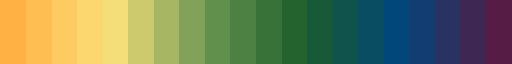

In [207]:
saez_full_cmap

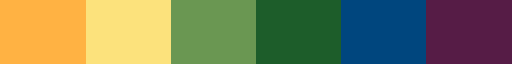

In [208]:
saez_hex_cmap

In [209]:
expanded_cmap 

['#ffb243',
 '#febf52',
 '#fdcb61',
 '#fdd870',
 '#f4de7a',
 '#ceca6f',
 '#a7b764',
 '#81a359',
 '#62914e',
 '#4e8243',
 '#397239',
 '#25632e',
 '#185937',
 '#11534d',
 '#094d63',
 '#02477a',
 '#123d72',
 '#293263',
 '#3f2755',
 '#561c46']

In [141]:
saez_colors

['#ffb243', '#FCE27C', '#6a9752', '#1d5d2a', '#00467e', '#561C46']

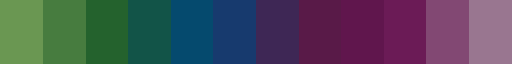

In [210]:
saez_colors    = ['#6a9752','#1d5d2a','#00467e','#561C46','#671351','#997690']

saez_hex_cmap  = ListedColormap(saez_colors)
saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
saez_full_cmap = LinearSegmentedColormap.from_list('saez_full_cmap',saez_rgb,N=12)
#plot_palette = saez_linear_cmap.resampled(lutsize=30)
expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]
saez_full_cmap

In [211]:
expanded_cmap

['#6a9752',
 '#477d40',
 '#24622e',
 '#125549',
 '#054a6f',
 '#173b6f',
 '#3f2755',
 '#591a48',
 '#61164d',
 '#6c1c57',
 '#824973',
 '#997690']

In [ ]:
# '#591a48',  # top
#  '#61164d', # almost
#  '#173b6f', # blue
#  '#3f2755', # dark purple
#  '#561c46'  # top (slightly darker)
# '#824973'   # too light


# # '#591a48' or '#561c46' 

## Figure 1: RT x CPE Scatter 
- plot subj averaged rt x cpe reg plot
- same plot, but split by BDI 
- later - rpe control 

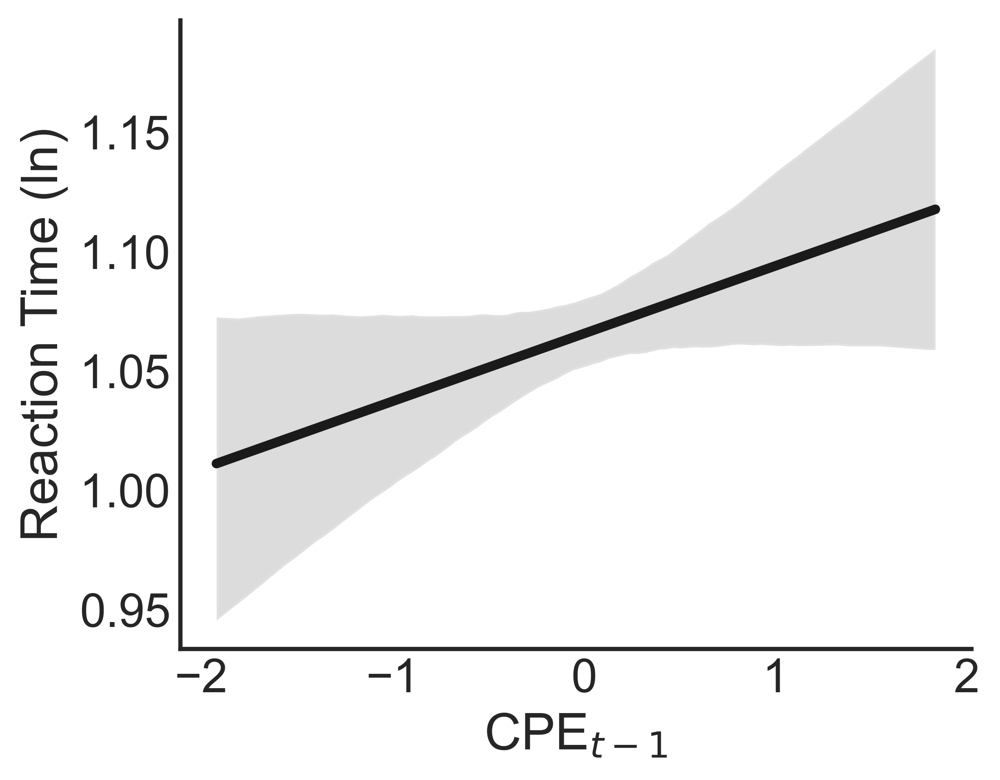

In [231]:
#### 1a
fig_id = f'{fig_dir}all_subj_rt_cpe_regplot.pdf'

fig,ax = plt.subplots(figsize=(5,4),dpi=500)

sns.regplot(data=all_behav,x='cpe',y='logRT_t1',scatter=False,ci=95,color='k',robust=True)


plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'Reaction Time (ln)')
plt.xlabel(r'CPE$_{{{t-1}}}$')
# plt.xlabel(r'$RPE(z)$')
sns.despine()
plt.tick_params(length=0)

plt.savefig(f'{fig_id}', format=fig_id.split('.')[-1], metadata=None,
    bbox_inches='tight', pad_inches=0.1,dpi=400,
    facecolor='auto', edgecolor='auto',
    backend=None)
    


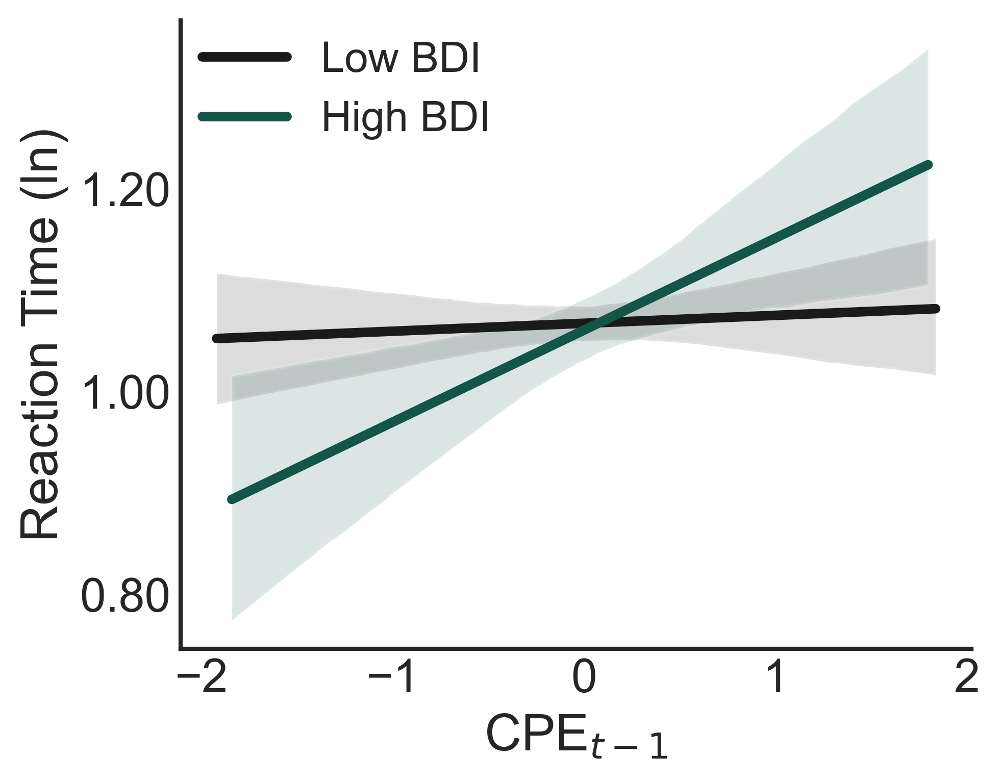

In [465]:
fig_id = f'{fig_dir}bdi_split_rt_cpe_regplot.pdf'

fig,ax = plt.subplots(figsize=(5,4),dpi=400)

sns.regplot(data=all_behav[all_behav.bdi<20],x='cpe',y='logRT_t1',scatter=False,
            ci=95,color = 'k',label='Low BDI',robust=True) #'#fdcb61'

sns.regplot(data=all_behav[all_behav.bdi>=20],x='cpe',y='logRT_t1',scatter=False,
            ci=95,color='#135546',label='High BDI',robust=True)

ax.legend()
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), frameon=False,framealpha=0,markerscale=0,
                fontsize='small',shadow=None,title=None,borderaxespad=0.1,edgecolor=None,labelcolor=None)

# sns.move_legend(ax,"upper left", bbox_to_anchor=(0, 0.95), borderaxespad=0,frameon=False,framealpha=0,fontsize='xx-small',shadow=None,
#                 columnspacing=0,edgecolor=None,markerfirst=True,title=None,#title_fontsize='x-small',
#                 markerscale=1,labelcolor=None)

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'Reaction Time (ln)')
plt.xlabel(r'CPE$_{{{t-1}}}$')
sns.despine()
plt.tick_params(length=0)

plt.savefig(f'{fig_id}', format=fig_id.split('.')[-1], metadata=None,
    bbox_inches='tight', pad_inches=0.1,dpi=400,
    facecolor='auto', edgecolor='auto',
    backend=None)
    

In [ ]:
591c48

# Figure 2: RT x BDI Corr
- plot mean regression line from model 
- add individual subject regression lines (COLOR BY BDI)

In [ ]:

    rlm = sm.RLM(model_rand_df.bdi.values, sm.add_constant(model_rand_df.subj_cpe.values), M=sm.robust.norms.HuberT()).fit()
    print(model_id, rlm.summary())
    if rlm.pvalues[-1] < 0.05:
        sig_bdi_models.append(model_id)

    pearson_rho,pearson_pval   = pearsonr(model_rand_df.bdi,model_rand_df.subj_cpe)
    spearman_rho,spearman_pval = spearmanr(model_rand_df.bdi,model_rand_df.subj_cpe)

    bdi_results_df.append(pd.DataFrame({'model_id':model_id,
                           'rlm_coeff':rlm.params[-1],'rlm_pval':rlm.pvalues[-1],
                           'pearson_rho':pearson_rho,'pearson_pval':pearson_pval,
                           'spearman_rho':spearman_rho,'spearman_pval':spearman_pval},index=[0]))

# test_rho
bdi_results_df = pd.concat(bdi_results_df).reset_index(drop=True)
bdi_results_df = pd.merge(bdi_results_df,fe_results,on='model_id').reset_index(drop=True)


In [ ]:
591c48

In [432]:
final_results

,model_id,subj_id,bdi,rand_int,rand_cpe,subj_int,subj_cpe
0,orthog_rpeTrialType_t1cpe,DA023,14,-0.290109,0.014912,0.646368,0.048262
1,orthog_rpeTrialType_t1cpe,DA026,19,0.279263,-0.024033,1.215739,0.009317
2,orthog_rpeTrialType_t1cpe,DA037,4,-0.264851,0.010317,0.671625,0.043668
3,orthog_rpeTrialType_t1cpe,DA039,22,0.242728,-0.010843,1.179205,0.022508
4,orthog_rpeTrialType_t1cpe,DA8,13,-0.085472,-0.013180,0.851005,0.020170
5,orthog_rpeTrialType_t1cpe,MS002,14,-0.392074,-0.017938,0.544403,0.015412
6,orthog_rpeTrialType_t1cpe,MS003,8,0.136642,-0.006950,1.073118,0.026400
7,orthog_rpeTrialType_t1cpe,MS009,16,-0.153139,-0.013118,0.783338,0.020233
8,orthog_rpeTrialType_t1cpe,MS011,13,0.102496,-0.027667,1.038973,0.005684
9,orthog_rpeTrialType_t1cpe,MS015,26,0.256437,-0.007135,1.192914,0.026215


In [441]:
fig_dir

'/Users/alexandrafink/Documents/GraduateSchool/SaezLab/SWB/manuscript/figs/behav/'

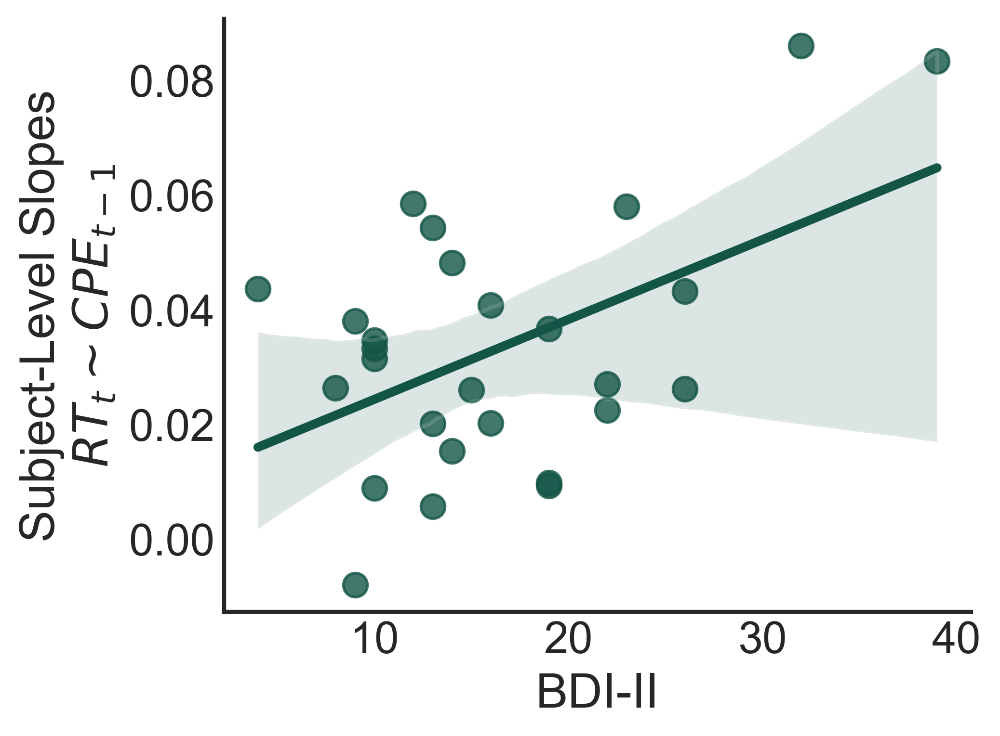

In [466]:
fig,ax = plt.subplots(figsize=(5,4),dpi=400)
sns.set_context("talk",rc={'axes.linewidth': 1.5})

 
# sns.regplot(ax=ax,data=line_plot_df.groupby('subj_id').agg('mean'),x='bdi',y='subj_plot_bCPE',fit_reg=True,color = '#135546',ci=95) #ffb243  1d5d2a
sns.regplot(ax=ax,data=final_results,x='bdi',y='subj_cpe',fit_reg=True,color = '#135546',ci=95,robust=True) #ffb243  1d5d2a 135546 125549
plt.tick_params(length=0)#,grid_linewidth=1)

# plt.ylabel('cpe sensitivity')
plt.ylabel(f'Subject-Level Slopes\n' r'$RT_t \sim CPE_{{{t-1}}}$')
# plt.ylabel(r'Model Weights $RT_t \sim CPE_{{{t-1}}}$')
plt.xlabel('BDI-II')

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

# rho, rho_p = pearsonr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

# # plt.text(30,0.012,r"$\rho$"+f'{np.round(r,3)} \n p: {np.round(p_r,4)}',fontsize=12)

# plt.text(np.min(line_plot_df.groupby('subj_id').agg('mean').bdi)+1,
#          np.max(line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)-0.01,
#          r'$rho$ = '+ f'{np.round(rho,2)} ' + '\n ' + r'$p < $'+ f'{np.round(rho_p,3)}',color='#135546',fontsize=20)

sns.despine()

plt.savefig(f'{fig_dir}BDI_RT_Cpe_slope_{date}.pdf',dpi=400,metadata=None,
            format='pdf',bbox_inches='tight',pad_inches=0.1,
            facecolor='auto', edgecolor='auto',backend=None)




# Figure 3: Random Effects Line Plot
- plot mean regression line from model 
- add individual subject regression lines (COLOR BY BDI)

In [ ]:
fig2_data = all_behav.groupby('subj_id').agg('',numeric_only=True)

In [319]:
fe_results[fe_results.model_id == final_model_id]

,model_id,modle_bic,int_coeff,int_pval,cpe_coeff,cpe_pval
3,orthog_rpeTrialType_t1cpe,2931.556421,0.936477,1.867697e-75,0.03335,0.01382


In [322]:
fe_results[fe_results.model_id == final_model_id].int_coeff.values[0]

0.9364767072425845

In [323]:
#### Get all results for Figs!!!!

all_cpe_obs    = all_behav.cpe.to_numpy()
fe_intercept   = fe_results[fe_results.model_id == final_model_id].int_coeff.values[0]
fe_cpe_beta    = fe_results[fe_results.model_id == final_model_id].cpe_coeff.values[0]
cpe_fe_regline = np.add((fe_cpe_beta*all_cpe_obs),fe_intercept)



In [338]:
cpe_fe_regline.shape

(3689,)

In [316]:
final_results

,model_id,subj_id,bdi,rand_int,rand_cpe,subj_int,subj_cpe
0,orthog_rpeTrialType_t1cpe,DA023,14,-0.290109,0.014912,0.646368,0.048262
1,orthog_rpeTrialType_t1cpe,DA026,19,0.279263,-0.024033,1.215739,0.009317
2,orthog_rpeTrialType_t1cpe,DA037,4,-0.264851,0.010317,0.671625,0.043668
3,orthog_rpeTrialType_t1cpe,DA039,22,0.242728,-0.010843,1.179205,0.022508
4,orthog_rpeTrialType_t1cpe,DA8,13,-0.085472,-0.013180,0.851005,0.020170
5,orthog_rpeTrialType_t1cpe,MS002,14,-0.392074,-0.017938,0.544403,0.015412
6,orthog_rpeTrialType_t1cpe,MS003,8,0.136642,-0.006950,1.073118,0.026400
7,orthog_rpeTrialType_t1cpe,MS009,16,-0.153139,-0.013118,0.783338,0.020233
8,orthog_rpeTrialType_t1cpe,MS011,13,0.102496,-0.027667,1.038973,0.005684
9,orthog_rpeTrialType_t1cpe,MS015,26,0.256437,-0.007135,1.192914,0.026215


In [412]:
# all_subj_Ypred = []
subj_lineplot_data = []

for subj_id in subj_ids:
    subj_rand_int = final_results[final_results.subj_id==subj_id].subj_int.values[0]
    subj_rand_cpe = final_results[final_results.subj_id==subj_id].subj_cpe.values[0]

    subj_Y = np.add(np.multiply(all_behav[all_behav.subj_id==subj_id].cpe.to_numpy(),subj_rand_cpe),
                  subj_rand_int)
    
    # all_subj_Ypred.extend(subj_Y)

    subj_lineplot_data.append(pd.DataFrame({'subj_id':all_behav[all_behav.subj_id==subj_id].subj_id,
                                   'bdi':all_behav[all_behav.subj_id==subj_id].bdi.to_numpy(),
                                   'epoch':all_behav[all_behav.subj_id==subj_id].epoch.to_numpy(),
                                   'subj_X':all_behav[all_behav.subj_id==subj_id].cpe.to_numpy(),'subj_Y':subj_Y
                                   }))

# all_subj_Ypred
subj_lineplot_data = pd.concat(subj_lineplot_data).reset_index(drop=True)

In [413]:
subj_lineplot_data['bdi_split'] = np.where(
    subj_lineplot_data['bdi'] < 20, 0, np.where(
    subj_lineplot_data['bdi'] >=  20, 1, -1)) 

In [414]:
subj_lineplot_data

,subj_id,bdi,epoch,subj_X,subj_Y,bdi_split
0,MS002,14,0,-0.399479,0.538246,0
1,MS002,14,1,-0.448423,0.537492,0
2,MS002,14,2,0.732357,0.555690,0
3,MS002,14,3,0.438692,0.551164,0
4,MS002,14,4,0.401983,0.550598,0
...,...,...,...,...,...,...
3684,DA039,22,144,-0.326367,1.171859,1
3685,DA039,22,145,0.752395,1.196139,1
3686,DA039,22,146,0.885725,1.199140,1
3687,DA039,22,147,-0.271823,1.173087,1


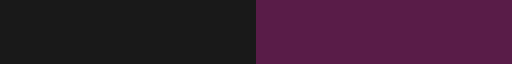

In [375]:
plot_palette = ['k','#591c48']
hex_cmap  = ListedColormap(plot_palette)
rgb       = [mpl.colors.to_rgb(hex) for hex in plot_palette]

full_cmap = LinearSegmentedColormap.from_list('fig2_palette',rgb,N=2)
full_cmap

In [415]:
subj_lineplot_data

,subj_id,bdi,epoch,subj_X,subj_Y,bdi_split
0,MS002,14,0,-0.399479,0.538246,0
1,MS002,14,1,-0.448423,0.537492,0
2,MS002,14,2,0.732357,0.555690,0
3,MS002,14,3,0.438692,0.551164,0
4,MS002,14,4,0.401983,0.550598,0
...,...,...,...,...,...,...
3684,DA039,22,144,-0.326367,1.171859,1
3685,DA039,22,145,0.752395,1.196139,1
3686,DA039,22,146,0.885725,1.199140,1
3687,DA039,22,147,-0.271823,1.173087,1


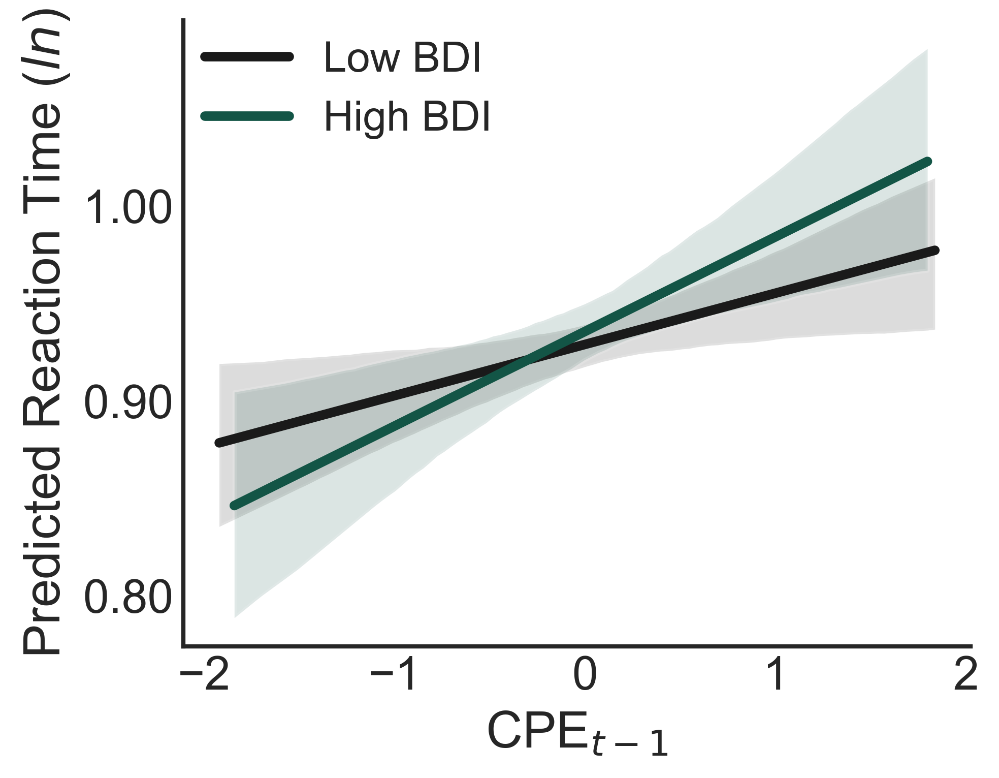

In [461]:
# fig_id = f'{fig_dir}bdi_split_rt_cpe_regplot.pdf'

fig,ax = plt.subplots(figsize=(5,4),dpi=400)

sns.regplot(data=subj_lineplot_data[subj_lineplot_data.bdi<20],x='subj_X',y='subj_Y',scatter=False,
            ci=95,color = 'k',label='Low BDI',robust=True) #'#fdcb61'

sns.regplot(data=subj_lineplot_data[subj_lineplot_data.bdi>=20],x='subj_X',y='subj_Y',scatter=False,
            ci=95,color='#135546',label='High BDI',robust=True)

ax.legend()
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), frameon=False,framealpha=0,markerscale=0,
                fontsize='small',shadow=None,title=None,borderaxespad=0.1,edgecolor=None,labelcolor=None)

# sns.move_legend(ax,"upper left", bbox_to_anchor=(0, 0.95), borderaxespad=0,frameon=False,framealpha=0,fontsize='xx-small',shadow=None,
#                 columnspacing=0,edgecolor=None,markerfirst=True,title=None,#title_fontsize='x-small',
#                 markerscale=1,labelcolor=None)

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

plt.ylabel(r'Predicted Reaction Time ($ln$)')
plt.xlabel(r'CPE$_{{{t-1}}}$')
sns.despine()
plt.tick_params(length=0)

# plt.savefig(f'{fig_id}', format=fig_id.split('.')[-1], metadata=None,
#     bbox_inches='tight', pad_inches=0.1,dpi=400,
#     facecolor='auto', edgecolor='auto',
#     backend=None)

In [462]:
plot_palette = ['k','#135546']
plot_rgb       = [mpl.colors.to_rgb(hex) for hex in plot_palette]

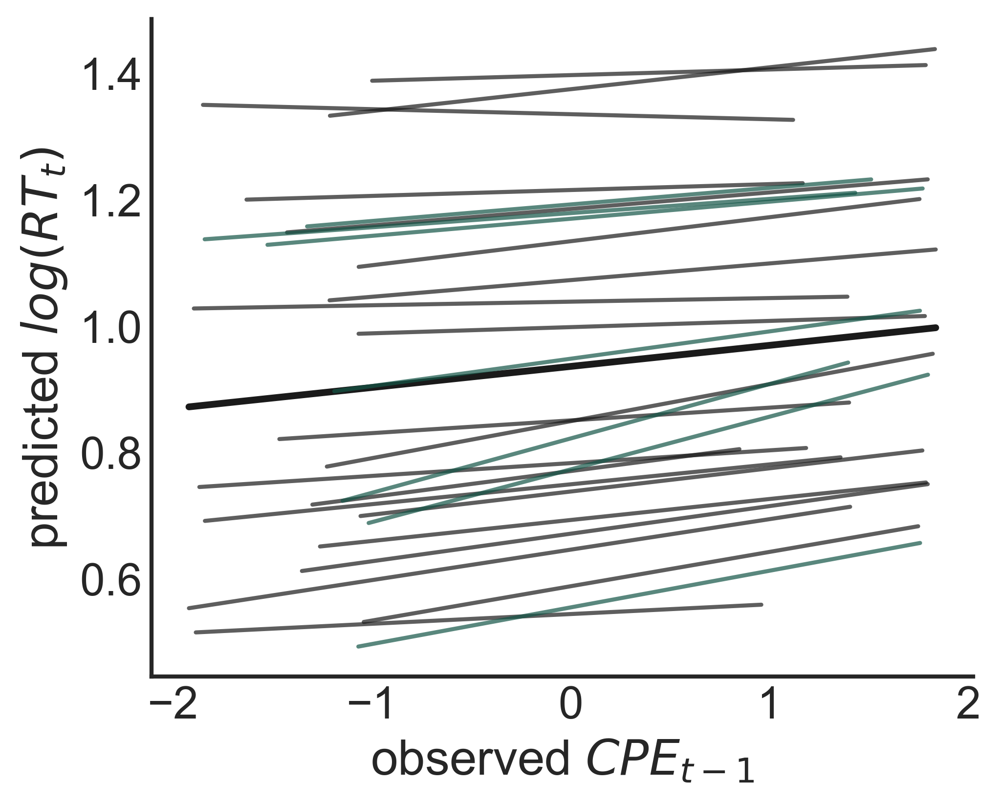

In [464]:

plt.figure(figsize=(5,4),dpi=400,constrained_layout=True)

sns.lineplot(x=all_cpe_obs,y=cpe_fe_regline,alpha=1,linewidth=2.5,color='k',dashes=True)


sns.lineplot(data = subj_lineplot_data, x='subj_X',y='subj_Y',linewidth=1.5,alpha=0.7, 
            legend=False,hue='bdi_split',units='subj_id',estimator=None,palette=plot_rgb)


# for subj_id in subj_ids: 
#     subj_col = 'red' if subj_lineplot_data[subj_id]['subj_bdi']>=20 else 'k'

#     sns.lineplot( x=subj_lineplot_data[subj_id]['subj_X'],y=subj_lineplot_data[subj_id]['subj_Y'],linewidth=3,alpha=0.6,  
#                 legend=False,color=subj_col)
    
plt.tick_params(length=0)#,grid_linewidth=1)

# plt.xlabel(r'observed $cpe_{{{t-1}}}(z)$')
plt.xlabel(r'observed $CPE_{{{t-1}}}$')

plt.ylabel(r'predicted $log(RT_t)$')
# plt.ylim([0,2.0])

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

sns.despine()


In [407]:
subj_lineplot_data

,subj_id,bdi,subj_X,subj_Y,bdi_split
0,MS002,14,-0.399479,0.538246,0
1,MS002,14,-0.448423,0.537492,0
2,MS002,14,0.732357,0.555690,0
3,MS002,14,0.438692,0.551164,0
4,MS002,14,0.401983,0.550598,0
...,...,...,...,...,...
3684,DA039,22,-0.326367,1.171859,1
3685,DA039,22,0.752395,1.196139,1
3686,DA039,22,0.885725,1.199140,1
3687,DA039,22,-0.271823,1.173087,1


In [411]:
subj_lineplot_data

,subj_id,bdi,subj_X,subj_Y,bdi_split
0,MS002,14,-0.399479,0.538246,0
1,MS002,14,-0.448423,0.537492,0
2,MS002,14,0.732357,0.555690,0
3,MS002,14,0.438692,0.551164,0
4,MS002,14,0.401983,0.550598,0
...,...,...,...,...,...
3684,DA039,22,-0.326367,1.171859,1
3685,DA039,22,0.752395,1.196139,1
3686,DA039,22,0.885725,1.199140,1
3687,DA039,22,-0.271823,1.173087,1


In [ ]:
subj_lineplot_data.pivot

In [ ]:
group_lineplot_data = subj_lineplot_data

In [421]:
group_lineplot_data = subj_lineplot_data.groupby(['epoch','bdi_split']).agg('mean',numeric_only=True).reset_index()

In [422]:
group_lineplot_data

,epoch,bdi_split,bdi,subj_X,subj_Y
0,0,0,12.315789,0.161039,0.924412
1,0,1,27.142857,-0.235139,0.944121
2,1,0,12.315789,0.022828,0.921396
3,1,1,27.142857,-0.177945,0.939990
4,2,0,12.650000,-0.144912,0.928348
...,...,...,...,...,...
289,146,1,26.333333,0.080060,0.969932
290,147,0,12.650000,-0.071634,0.933516
291,147,1,26.333333,-0.136838,0.962025
292,148,0,12.650000,-0.107013,0.928209


In [425]:

# plt.figure(figsize=(5,4),dpi=400,constrained_layout=True)

# sns.lineplot(x=all_cpe_obs,y=cpe_fe_regline,alpha=0.95,linewidth=3,color='k')

# sns.lineplot(data = group_lineplot_data[group_lineplot_data.bdi_split==0], x='subj_X',y='subj_Y',linewidth=2,alpha=0.6, dashes=True,
#             legend=False,color='k',estimator='mean')

# sns.lineplot(data = group_lineplot_data[group_lineplot_data.bdi_split==1], x='subj_X',y='subj_Y',linewidth=2,alpha=0.6, dashes=True,
#             legend=False,color='#591c48',estimator='mean')


# # sns.lineplot(data = group_lineplot_data, x='subj_X',y='subj_Y',linewidth=2,alpha=0.6, dashes=True,
# #             legend=False,hue='bdi_split',palette=plot_rgb)


# # for subj_id in subj_ids: 
# #     subj_col = 'red' if subj_lineplot_data[subj_id]['subj_bdi']>=20 else 'k'

# #     sns.lineplot( x=subj_lineplot_data[subj_id]['subj_X'],y=subj_lineplot_data[subj_id]['subj_Y'],linewidth=3,alpha=0.6,  
# #                 legend=False,color=subj_col)
    
# plt.tick_params(length=0)#,grid_linewidth=1)
# plt.ylim([0,2])
# # plt.xlabel(r'observed $cpe_{{{t-1}}}(z)$')
# plt.xlabel(r'observed $CPE_{{{t-1}}}$')

# plt.ylabel(r'predicted $log(RT_t)$')
# # plt.ylim([0.25,1.75])

# plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

# sns.despine()

# # plt.savefig(f'{fig_dir}RT_CPE_rand_reglines{date}.pdf',dpi=300,metadata=None,
# #             format='pdf',bbox_inches='tight',pad_inches=0.1,
# #             facecolor='auto', edgecolor='auto',backend=None)

# RT Results Figs

## Fig1 - CPEt x RTt 

In [ ]:

# plt_hex = '#1d5d2a'
plt_hex = '#06470c'
# plt_hex = '#1d5d2a'

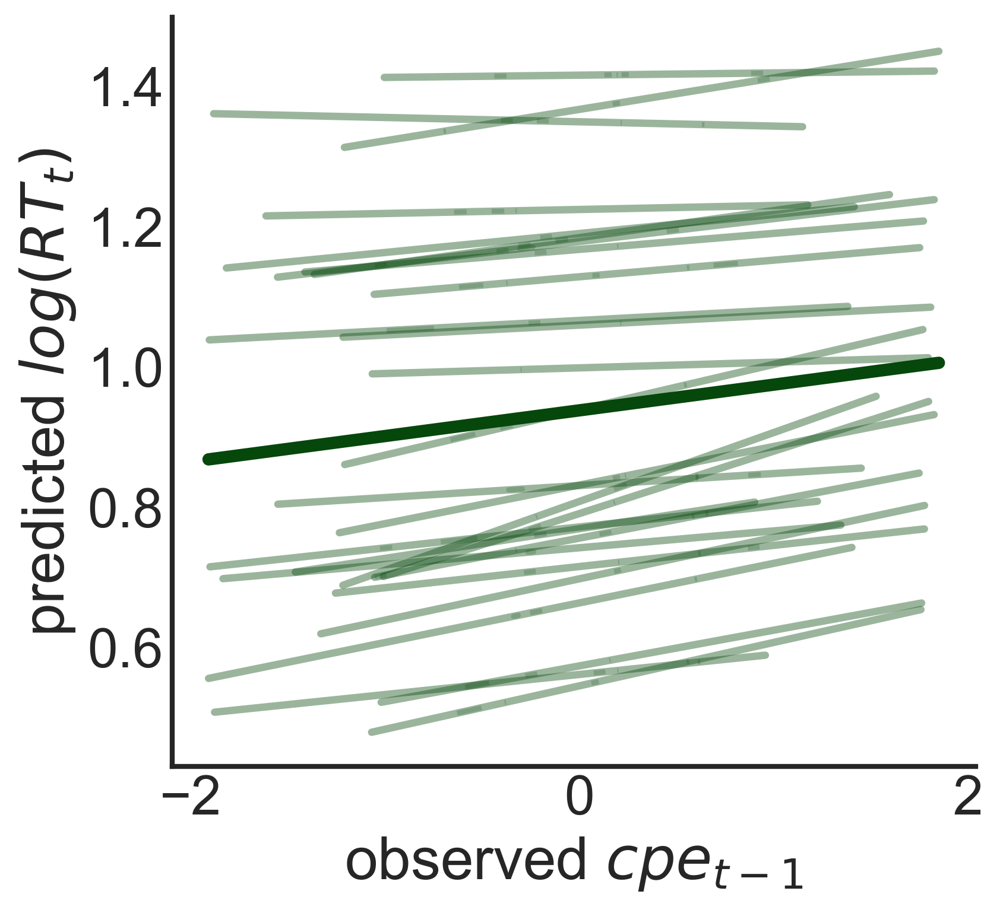

In [ ]:
plt.figure(figsize=(5.5,5),dpi=300,constrained_layout=True)

sns.lineplot(data=line_plot_df, x='decisionCPE',y='fe_regline_yPred',alpha=1,linewidth=5,color=plt_hex)
sns.lineplot(data=line_plot_df, x='decisionCPE',y='subj_regline_yPred',linewidth=3,alpha=0.4,  #color=plt_hex,
             style='subj_id',legend=False,color=plt_hex,dashes=False)
plt.tick_params(length=0)#,grid_linewidth=1)

# plt.xlabel(r'observed $cpe_{{{t-1}}}(z)$')
plt.xlabel(r'observed $cpe_{{{t-1}}}$')

plt.ylabel(r'predicted $log(RT_t)$')
# plt.ylim([0.25,1.75])

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

sns.despine()

plt.savefig(f'{proj_fig_dir}RT_CPE_rand_reglines{date}.pdf',dpi=300,metadata=None,
            format='pdf',bbox_inches='tight',pad_inches=0.1,
            facecolor='auto', edgecolor='auto',backend=None)



In [ ]:
line_plot_df.groupby('subj_id').agg('mean')

,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
subj_id,,,,,,,,,,,,,
DA023,14.0,74.205479,75.205479,0.898497,-1.520853e-18,-1.383977e-16,1.901067e-18,3.041707e-18,0.663058,0.056394,0.019779,0.663058,0.937684
DA026,19.0,78.834586,79.834586,1.315804,6.051968e-18,2.704603e-16,1.106049e-17,2.921640e-18,1.224178,0.005674,-0.030941,1.224178,0.937684
DA037,4.0,76.713235,77.713235,0.921571,6.938894e-18,-5.551115e-17,7.704213e-18,1.632681e-17,0.697401,0.058872,0.022257,0.697401,0.937684
DA039,22.0,73.041667,74.041667,1.293881,5.551115e-18,4.625929e-18,0.000000e+00,-1.063964e-17,1.189888,0.027037,-0.009579,1.189888,0.937684
DA8,13.0,74.993243,75.993243,0.871931,-2.351254e-17,9.751959e-17,1.275256e-17,3.375678e-18,0.830446,0.017117,-0.019499,0.830446,0.937684
MS002,14.0,75.767123,76.767123,0.727029,1.863045e-17,1.672939e-17,1.368768e-17,9.315227e-18,0.561050,0.028657,-0.007959,0.561050,0.937684
MS003,8.0,74.929577,75.929577,1.168549,-1.075040e-17,3.831051e-17,-5.863854e-18,-8.209396e-18,1.059243,0.014146,-0.022469,1.059243,0.937684
MS009,16.0,74.993243,75.993243,0.895632,-4.875980e-18,-1.756290e-16,-9.001808e-18,-7.313969e-18,0.771427,0.029896,-0.006720,0.771427,0.937684
MS011,13.0,75.942029,76.942029,1.227465,3.016910e-17,-1.279170e-16,-1.609019e-18,7.642840e-18,1.065900,0.014539,-0.022077,1.065900,0.937684


# Figure 3: CPE Weights x BDI

In [ ]:
line_plot_df

,subj_id,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,GambleChoice,TrialType,TrialType_t1,GambleChoice_t1,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
0,MS002,14,1,2,0.670167,-0.395746,-1.028523,safe,mix,loss,gamble,-0.277154,-0.437011,0.561050,0.028657,-0.007959,0.549709,0.923193
1,MS002,14,2,3,0.459614,-0.444540,-1.343507,gamble,loss,gain,gamble,0.804125,-0.278164,0.561050,0.028657,-0.007959,0.548311,0.921406
2,MS002,14,3,4,0.912929,0.732629,-0.786483,gamble,gain,mix,safe,0.382163,0.807292,0.561050,0.028657,-0.007959,0.582044,0.964509
3,MS002,14,4,5,0.570378,0.439861,-0.786483,safe,mix,gain,gamble,0.241509,0.383699,0.561050,0.028657,-0.007959,0.573655,0.953789
4,MS002,14,5,6,0.631657,0.403265,-0.375346,gamble,gain,mix,safe,-0.294736,0.242502,0.561050,0.028657,-0.007959,0.572606,0.952449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3710,DA039,22,145,146,0.076684,-0.320285,0.655965,gamble,gain,gain,gamble,0.817155,0.320836,1.189888,0.027037,-0.009579,1.181228,0.925956
3711,DA039,22,146,147,0.608282,0.745335,0.993053,gamble,gain,mix,safe,-0.773371,0.739507,1.189888,0.027037,-0.009579,1.210039,0.964974
3712,DA039,22,147,148,1.393768,0.877041,0.993053,safe,mix,mix,safe,-0.049592,-0.813065,1.189888,0.027037,-0.009579,1.213600,0.969797
3713,DA039,22,148,149,1.152830,-0.266405,0.993053,safe,mix,mix,safe,-0.308723,-0.106558,1.189888,0.027037,-0.009579,1.182685,0.927929


In [ ]:
line_plot_df.groupby('subj_id').agg('mean')

,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
subj_id,,,,,,,,,,,,,
DA023,14.0,74.205479,75.205479,0.898497,-1.520853e-18,-1.383977e-16,1.901067e-18,3.041707e-18,0.663058,0.056394,0.019779,0.663058,0.937684
DA026,19.0,78.834586,79.834586,1.315804,6.051968e-18,2.704603e-16,1.106049e-17,2.921640e-18,1.224178,0.005674,-0.030941,1.224178,0.937684
DA037,4.0,76.713235,77.713235,0.921571,6.938894e-18,-5.551115e-17,7.704213e-18,1.632681e-17,0.697401,0.058872,0.022257,0.697401,0.937684
DA039,22.0,73.041667,74.041667,1.293881,5.551115e-18,4.625929e-18,0.000000e+00,-1.063964e-17,1.189888,0.027037,-0.009579,1.189888,0.937684
DA8,13.0,74.993243,75.993243,0.871931,-2.351254e-17,9.751959e-17,1.275256e-17,3.375678e-18,0.830446,0.017117,-0.019499,0.830446,0.937684
MS002,14.0,75.767123,76.767123,0.727029,1.863045e-17,1.672939e-17,1.368768e-17,9.315227e-18,0.561050,0.028657,-0.007959,0.561050,0.937684
MS003,8.0,74.929577,75.929577,1.168549,-1.075040e-17,3.831051e-17,-5.863854e-18,-8.209396e-18,1.059243,0.014146,-0.022469,1.059243,0.937684
MS009,16.0,74.993243,75.993243,0.895632,-4.875980e-18,-1.756290e-16,-9.001808e-18,-7.313969e-18,0.771427,0.029896,-0.006720,0.771427,0.937684
MS011,13.0,75.942029,76.942029,1.227465,3.016910e-17,-1.279170e-16,-1.609019e-18,7.642840e-18,1.065900,0.014539,-0.022077,1.065900,0.937684


In [ ]:
line_plot_df.groupby('subj_id').agg('mean').bdi

subj_id
DA023    14.0
DA026    19.0
DA037     4.0
DA039    22.0
DA8      13.0
MS002    14.0
MS003     8.0
MS009    16.0
MS011    13.0
MS015    26.0
MS016    10.0
MS017    26.0
MS019    12.0
MS022    10.0
MS024    16.0
MS025    10.0
MS026     9.0
MS027    22.0
MS028    13.0
MS029    32.0
MS030    19.0
MS033    39.0
MS035    15.0
MS041    10.0
MS043    23.0
MS048    19.0
MS050     9.0
Name: bdi, dtype: float64

In [ ]:
line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE

subj_id
DA023    0.056394
DA026    0.005674
DA037    0.058872
DA039    0.027037
DA8      0.017117
MS002    0.028657
MS003    0.014146
MS009    0.029896
MS011    0.014539
MS015    0.038443
MS016    0.044784
MS017    0.064665
MS019    0.055000
MS022    0.003192
MS024    0.042144
MS025    0.024018
MS026   -0.006140
MS027    0.032693
MS028    0.050872
MS029    0.098161
MS030    0.008030
MS033    0.088900
MS035    0.022810
MS041    0.030161
MS043    0.061848
MS048    0.053008
MS050    0.023700
Name: subj_plot_bCPE, dtype: float64

In [ ]:
spearmanr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


SpearmanrResult(correlation=0.43467875778386544, pvalue=0.023465839643836976)

In [ ]:
# stats_summary_df.rho[stats_summary_df.model_id == final_model_id].values[0]

pearsonr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

PearsonRResult(statistic=0.5801692172376026, pvalue=0.0015126098578951985)

In [ ]:
stats_summary_df.rho_pval[stats_summary_df.model_id == final_model_id].values[0]

0.0015126098578951985

# Feature Selection
Check regressor collinearity:
- compute VIF scores between vars
- compute pearson's correlations between vars + CPE (if significant - OMIT!)

In [14]:
# vif_scores(all_behav,['TrialType_t1','GambleChoice_t1','TotalProfit','GambleEV_t1','GambleEV','RPE','decisionCPE','logRT_t1'])
# vif_scores(all_behav,['TrialType_t1','GambleChoice_t1','TotalProfit','GambleEV_t1','GambleEV','decisionCPE','logRT_t1'])
vif_scores(all_behav,['TrialType_t1','GambleChoice_t1','TotalProfit','GambleEV_t1','decisionCPE','SafeBet'])
# vif_scores(all_behav,['GambleChoice_t1','TotalProfit','GambleEV_t1','GambleEV','RPE','decisionCPE','logRT_t1'])
# vif_scores(all_behav,['TrialType_t1','GambleChoice_t1','TotalProfit','RPE','decisionCPE','logRT_t1'])




Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


,feature,VIF
0,TrialType_t1,1.673334
1,GambleChoice_t1,1.682642
2,TotalProfit,1.026510
3,GambleEV_t1,1.312123
4,decisionCPE,1.007729
5,SafeBet,1.006000


## Checking of TrialType + Choice are collinear - they are!

In [20]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.GambleChoice)[0],all_behav.TrialEV))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.GambleChoice)[0],behav.TrialEV))

PearsonRResult(statistic=0.3017302382368647, pvalue=4.7166204013322004e-79)
MS002 PearsonRResult(statistic=0.24231590449610574, pvalue=0.0032108671750943783)
MS003 PearsonRResult(statistic=-0.11519118984189936, pvalue=0.17222867884264922)
MS009 PearsonRResult(statistic=0.2093635595157512, pvalue=0.010655772991358479)
MS011 PearsonRResult(statistic=-0.3458418923163263, pvalue=3.256932920993322e-05)
MS015 PearsonRResult(statistic=0.08321051436639235, pvalue=0.3662325288680449)
MS016 PearsonRResult(statistic=0.2610622489208614, pvalue=0.003539704380004199)
MS017 PearsonRResult(statistic=-0.5692546379657166, pvalue=4.3804202477346595e-14)
MS019 PearsonRResult(statistic=-0.07345294310240856, pvalue=0.37826510004267583)
MS022 PearsonRResult(statistic=-0.3608938616844635, pvalue=1.9770167889434873e-05)
MS024 PearsonRResult(statistic=0.27047882597315415, pvalue=0.02932032394470437)
MS025 PearsonRResult(statistic=-0.0776262239966426, pvalue=0.3483613168348198)
MS026 PearsonRResult(statistic=0.3

In [22]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.GambleChoice)[0],all_behav.TrialEV_t1))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.GambleChoice)[0],behav.TrialEV_t1))

PearsonRResult(statistic=-0.010788470620556635, pvalue=0.5109470516723722)
MS002 PearsonRResult(statistic=-0.11859109759509956, pvalue=0.1539662494645504)
MS003 PearsonRResult(statistic=0.1290831791522792, pvalue=0.12576430271887573)
MS009 PearsonRResult(statistic=0.010988495214962375, pvalue=0.894548218313645)
MS011 PearsonRResult(statistic=-0.013825183994560035, pvalue=0.8721410031982509)
MS015 PearsonRResult(statistic=0.020307080591473875, pvalue=0.8257565009939998)
MS016 PearsonRResult(statistic=-0.06590616435372164, pvalue=0.4689064209499769)
MS017 PearsonRResult(statistic=-0.09226293398568519, pvalue=0.26472585500812956)
MS019 PearsonRResult(statistic=-0.05179342813111525, pvalue=0.5346917453245618)
MS022 PearsonRResult(statistic=0.09203081764717996, pvalue=0.29207964266370173)
MS024 PearsonRResult(statistic=-0.09440846984721592, pvalue=0.45443009374819476)
MS025 PearsonRResult(statistic=-0.014865564957036809, pvalue=0.8576833713673309)
MS026 PearsonRResult(statistic=-0.066805019

In [23]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType)[0],all_behav.TrialEV))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType)[0],behav.TrialEV))

PearsonRResult(statistic=0.34833789400835224, pvalue=1.8979180987017742e-106)
MS002 PearsonRResult(statistic=0.3413314088098346, pvalue=2.484475516993856e-05)
MS003 PearsonRResult(statistic=-0.5057651819618458, pvalue=1.361458243624406e-10)
MS009 PearsonRResult(statistic=0.5148010467081073, pvalue=2.1761845206171856e-11)
MS011 PearsonRResult(statistic=-0.5173042549391237, pvalue=8.224994850166922e-11)
MS015 PearsonRResult(statistic=-0.5479687356526334, pvalue=9.314654646564144e-11)
MS016 PearsonRResult(statistic=-0.5290594534162394, pvalue=3.1594362238839814e-10)
MS017 PearsonRResult(statistic=-0.17544044047502272, pvalue=0.03294122015412802)
MS019 PearsonRResult(statistic=0.35756353192339446, pvalue=9.392816764368127e-06)
MS022 PearsonRResult(statistic=-0.3486083243599281, pvalue=3.919794577618819e-05)
MS024 PearsonRResult(statistic=0.38027326884255247, pvalue=0.0017800822179080658)
MS025 PearsonRResult(statistic=0.3454416188931717, pvalue=1.7081723470090617e-05)
MS026 PearsonRResult(

In [24]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType_t1)[0],all_behav.TrialEV))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType_t1)[0],behav.TrialEV))

PearsonRResult(statistic=0.012868747988847747, pvalue=0.43296442567182597)
MS002 PearsonRResult(statistic=0.01566098158011925, pvalue=0.8511766591325041)
MS003 PearsonRResult(statistic=-0.09018561025701916, pvalue=0.2858077082821546)
MS009 PearsonRResult(statistic=-0.06040603526952215, pvalue=0.4658141658234036)
MS011 PearsonRResult(statistic=0.0065329239788666504, pvalue=0.9393815273710951)
MS015 PearsonRResult(statistic=0.04398732296293645, pvalue=0.6333304855989337)
MS016 PearsonRResult(statistic=0.017370041120545614, pvalue=0.8487680932948957)
MS017 PearsonRResult(statistic=-0.04013317556518618, pvalue=0.6281754061325858)
MS019 PearsonRResult(statistic=0.016605881996664483, pvalue=0.8423107317511108)
MS022 PearsonRResult(statistic=-0.017479735771335277, pvalue=0.8417163476250287)
MS024 PearsonRResult(statistic=-0.0529875054579116, pvalue=0.6750666142979487)
MS025 PearsonRResult(statistic=0.07196228962953795, pvalue=0.3847576344776686)
MS026 PearsonRResult(statistic=-0.0520923767393

In [25]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType)[0],pd.factorize(all_behav.GambleChoice)[0]))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType)[0],pd.factorize(behav.GambleChoice)[0]))

PearsonRResult(statistic=0.2554913864744457, pvalue=1.9136614086800517e-56)
MS002 PearsonRResult(statistic=0.4415239876873611, pvalue=2.426743488543372e-08)
MS003 PearsonRResult(statistic=0.22052064855714953, pvalue=0.008361148299752864)
MS009 PearsonRResult(statistic=0.38968792306551236, pvalue=9.805494269841273e-07)
MS011 PearsonRResult(statistic=0.6385048748029032, pvalue=3.615438706943724e-17)
MS015 PearsonRResult(statistic=0.12072400395660471, pvalue=0.18903727332696565)
MS016 PearsonRResult(statistic=0.041673103854695664, pvalue=0.6471989211650406)
MS017 PearsonRResult(statistic=0.3394680267922926, pvalue=2.4341243034581436e-05)
MS019 PearsonRResult(statistic=0.10008238976690816, pvalue=0.2293922721912709)
MS022 PearsonRResult(statistic=0.06458597386988427, pvalue=0.46016052685261616)
MS024 PearsonRResult(statistic=0.7483445641477133, pvalue=7.753376854157045e-13)
MS025 PearsonRResult(statistic=-0.27466045139227613, pvalue=0.0007294383376278748)
MS026 PearsonRResult(statistic=-0.

<Axes: xlabel='x label', ylabel='TrialType'>

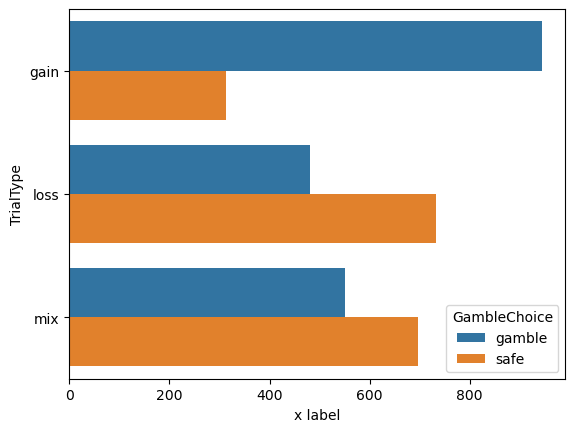

In [26]:
sns.barplot(x='x label',
            y='TrialType',
            hue='GambleChoice',
            data=all_behav.groupby(['TrialType','GambleChoice']).size().to_frame('x label').reset_index())

In [30]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType)[0],pd.factorize(all_behav.GambleChoice)[0]))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType)[0],pd.factorize(behav.GambleChoice)[0]))


PearsonRResult(statistic=0.2554913864744457, pvalue=1.9136614086800517e-56)
MS002 PearsonRResult(statistic=0.4415239876873611, pvalue=2.426743488543372e-08)
MS003 PearsonRResult(statistic=0.22052064855714953, pvalue=0.008361148299752864)
MS009 PearsonRResult(statistic=0.38968792306551236, pvalue=9.805494269841273e-07)
MS011 PearsonRResult(statistic=0.6385048748029032, pvalue=3.615438706943724e-17)
MS015 PearsonRResult(statistic=0.12072400395660471, pvalue=0.18903727332696565)
MS016 PearsonRResult(statistic=0.041673103854695664, pvalue=0.6471989211650406)
MS017 PearsonRResult(statistic=0.3394680267922926, pvalue=2.4341243034581436e-05)
MS019 PearsonRResult(statistic=0.10008238976690816, pvalue=0.2293922721912709)
MS022 PearsonRResult(statistic=0.06458597386988427, pvalue=0.46016052685261616)
MS024 PearsonRResult(statistic=0.7483445641477133, pvalue=7.753376854157045e-13)
MS025 PearsonRResult(statistic=-0.27466045139227613, pvalue=0.0007294383376278748)
MS026 PearsonRResult(statistic=-0.

<Axes: xlabel='x label', ylabel='TrialType_t1'>

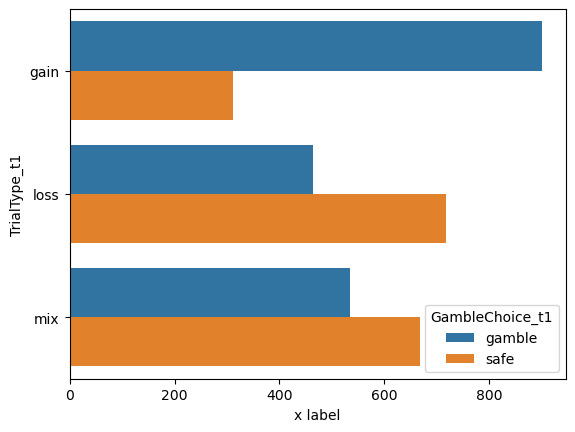

In [90]:
sns.barplot(x='x label',
            y='TrialType_t1',
            hue='GambleChoice_t1',
            data=all_behav.groupby(['TrialType_t1','GambleChoice_t1']).size().to_frame('x label').reset_index())

In [33]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType_t1)[0],pd.factorize(all_behav.GambleChoice_t1)[0]))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType_t1)[0],pd.factorize(behav.GambleChoice_t1)[0]))


PearsonRResult(statistic=-0.03920755150631962, pvalue=0.016855425628019293)
MS002 PearsonRResult(statistic=0.12879800152363952, pvalue=0.12129623001977707)
MS003 PearsonRResult(statistic=0.21746159825588465, pvalue=0.009332235354007267)
MS009 PearsonRResult(statistic=0.009208763599818988, pvalue=0.9115513983134247)
MS011 PearsonRResult(statistic=0.38370462692403096, pvalue=3.3909905384204862e-06)
MS015 PearsonRResult(statistic=0.04728774894774066, pvalue=0.6080377760585239)
MS016 PearsonRResult(statistic=-0.11250886703868511, pvalue=0.21535241839472158)
MS017 PearsonRResult(statistic=-0.31562709053539456, pvalue=9.322633818675108e-05)
MS019 PearsonRResult(statistic=0.02739080877015211, pvalue=0.7427746863593778)
MS022 PearsonRResult(statistic=-0.1569496824199356, pvalue=0.07120860447163202)
MS024 PearsonRResult(statistic=0.7897472214099491, pvalue=5.350780636613586e-15)
MS025 PearsonRResult(statistic=0.2252158242390721, pvalue=0.005921689186610155)
MS026 PearsonRResult(statistic=-0.089

In [34]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType)[0],pd.factorize(all_behav.GambleChoice_t1)[0]))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType)[0],pd.factorize(behav.GambleChoice_t1)[0]))


PearsonRResult(statistic=0.04949012388473419, pvalue=0.002550402812279829)
MS002 PearsonRResult(statistic=0.33709612318377746, pvalue=3.174427529987213e-05)
MS003 PearsonRResult(statistic=-0.10230339366053327, pvalue=0.2257069123617842)
MS009 PearsonRResult(statistic=0.0923122399884298, pvalue=0.2644695174312806)
MS011 PearsonRResult(statistic=0.03400995709955804, pvalue=0.6920998173218832)
MS015 PearsonRResult(statistic=0.0488765325324301, pvalue=0.596022882211135)
MS016 PearsonRResult(statistic=-0.04248745122750879, pvalue=0.6407802317370539)
MS017 PearsonRResult(statistic=-0.07389471278879174, pvalue=0.3720892405647634)
MS019 PearsonRResult(statistic=-0.04399726047836428, pvalue=0.5979805557049735)
MS022 PearsonRResult(statistic=-0.1279845526060743, pvalue=0.1420765015458276)
MS024 PearsonRResult(statistic=0.041320937777591174, pvalue=0.7438072987933251)
MS025 PearsonRResult(statistic=0.0592911750976359, pvalue=0.47410100318414666)
MS026 PearsonRResult(statistic=-0.00050378914164520

## Checking what vars are collinear with CPE

In [79]:
cpe_collinear_vars = []
cpe_good_vars = []

In [80]:
#### check RPE & CPE 
print(pearsonr(all_behav.RPE,all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.RPE,behav.decisionCPE))

cpe_collinear_vars.append('RPE')

PearsonRResult(statistic=0.6847310657252373, pvalue=0.0)
MS002 PearsonRResult(statistic=0.4919277113100379, pvalue=2.868865756978177e-10)
MS003 PearsonRResult(statistic=0.8124474460141928, pvalue=1.2999670902208534e-34)
MS009 PearsonRResult(statistic=0.565570266963127, pvalue=6.913921508495342e-14)
MS011 PearsonRResult(statistic=0.6327072710789492, pvalue=8.456283087696652e-17)
MS015 PearsonRResult(statistic=0.8365129593105144, pvalue=1.2948792105934665e-32)
MS016 PearsonRResult(statistic=0.6983564847395651, pvalue=2.7420219023155785e-19)
MS017 PearsonRResult(statistic=0.7077741581204655, pvalue=8.533553764966922e-24)
MS019 PearsonRResult(statistic=0.9017186213211891, pvalue=2.64674804020994e-54)
MS022 PearsonRResult(statistic=0.8231416416427699, pvalue=5.3539407124024755e-34)
MS024 PearsonRResult(statistic=0.4110450400227623, pvalue=0.0006706111011528958)
MS025 PearsonRResult(statistic=0.30797263924254836, pvalue=0.0001401755112146807)
MS026 PearsonRResult(statistic=0.5819649994625546

In [81]:
#### check choiceEV & CPE 
print(pearsonr(all_behav.choiceEV,all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.choiceEV,behav.decisionCPE))

cpe_collinear_vars.append('choiceEV')

PearsonRResult(statistic=0.19498372430013883, pvalue=3.741352673446345e-33)
MS002 PearsonRResult(statistic=0.11387654962484434, pvalue=0.17112287388532113)
MS003 PearsonRResult(statistic=0.23593213062627305, pvalue=0.004704158207798343)
MS009 PearsonRResult(statistic=0.055437099244424054, pvalue=0.5033564664489543)
MS011 PearsonRResult(statistic=0.1222597958001714, pvalue=0.1531398096152571)
MS015 PearsonRResult(statistic=0.3263732997906654, pvalue=0.0002748039325946211)
MS016 PearsonRResult(statistic=0.2132420406136681, pvalue=0.017878402285407054)
MS017 PearsonRResult(statistic=0.11465310865737072, pvalue=0.16526836197722714)
MS019 PearsonRResult(statistic=0.3056592989933817, pvalue=0.00017560747270791636)
MS022 PearsonRResult(statistic=0.18856327592749236, pvalue=0.029733026005812676)
MS024 PearsonRResult(statistic=0.038321089896201414, pvalue=0.7618356593571796)
MS025 PearsonRResult(statistic=-0.031668662900297115, pvalue=0.702390803708447)
MS026 PearsonRResult(statistic=0.13242107

<Axes: xlabel='TotalProfit', ylabel='decisionCPE'>

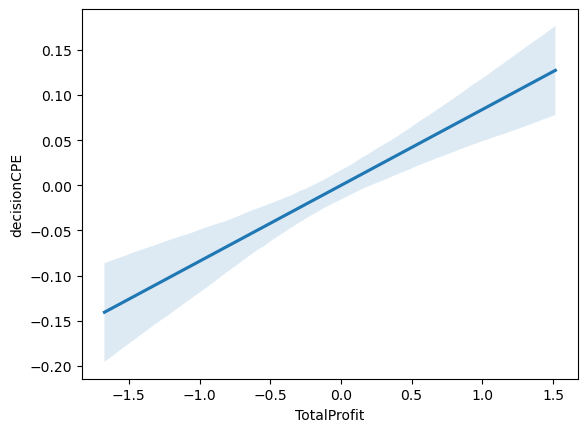

In [82]:
### plot total profit x cpe
sns.regplot(data=all_behav,x='TotalProfit',y='decisionCPE',scatter=False,fit_reg=True,ci=95)

In [83]:
#### check TotalProfit & CPE 
print(pearsonr(all_behav.TotalProfit,all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.TotalProfit,behav.decisionCPE))

cpe_good_vars.append('TotalProfit')


PearsonRResult(statistic=0.08404195990840249, pvalue=2.900844592351879e-07)
MS002 PearsonRResult(statistic=0.06753742990629863, pvalue=0.417958131740792)
MS003 PearsonRResult(statistic=0.0688807463041158, pvalue=0.41534598817994733)
MS009 PearsonRResult(statistic=0.1411623431519938, pvalue=0.08701960637000675)
MS011 PearsonRResult(statistic=0.14004317030095642, pvalue=0.10136863355279987)
MS015 PearsonRResult(statistic=0.10603257121117932, pvalue=0.24906491723385868)
MS016 PearsonRResult(statistic=0.11830856199012661, pvalue=0.19247557136976312)
MS017 PearsonRResult(statistic=0.15855268462955938, pvalue=0.054265030284322086)
MS019 PearsonRResult(statistic=0.16919346214982883, pvalue=0.04119691132320907)
MS022 PearsonRResult(statistic=0.14291143090876302, pvalue=0.10079487049052542)
MS024 PearsonRResult(statistic=-0.11096068275289378, pvalue=0.37888247654216994)
MS025 PearsonRResult(statistic=0.009499404048509304, pvalue=0.9087717328051761)
MS026 PearsonRResult(statistic=0.0418041100562

In [84]:
#### check GambleEV & CPE 
print(pearsonr(all_behav.TrialEV,all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.GambleEV,behav.decisionCPE))

cpe_good_vars.append('TrialEV')


PearsonRResult(statistic=0.019814733535411033, pvalue=0.22726429370819215)
MS002 PearsonRResult(statistic=-0.16010141567572822, pvalue=0.05356281655026534)
MS003 PearsonRResult(statistic=0.051910868873128166, pvalue=0.5395221475750273)
MS009 PearsonRResult(statistic=-0.19232248142362543, pvalue=0.01919249552733073)
MS011 PearsonRResult(statistic=-0.06619292867032642, pvalue=0.44049095876265226)
MS015 PearsonRResult(statistic=0.2819969252840846, pvalue=0.0018062349437571114)
MS016 PearsonRResult(statistic=-0.0297252330397125, pvalue=0.7441407567404053)
MS017 PearsonRResult(statistic=-0.01642653679360439, pvalue=0.8429226978652206)
MS019 PearsonRResult(statistic=0.23846753716107583, pvalue=0.003748514040567332)
MS022 PearsonRResult(statistic=0.0753781767544427, pvalue=0.38850841226543936)
MS024 PearsonRResult(statistic=-0.18319604433034298, pvalue=0.14409522114259718)
MS025 PearsonRResult(statistic=-0.3582047960961131, pvalue=7.820391611488681e-06)
MS026 PearsonRResult(statistic=-0.08932

In [85]:
#### check GambleEV & CPE 
print(pearsonr(all_behav.TrialEV_t1,all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.TrialEV_t1,behav.decisionCPE))

cpe_good_vars.append('TrialEV_t1') 


PearsonRResult(statistic=-0.006494080601726108, pvalue=0.6923334565627357)
MS002 PearsonRResult(statistic=0.003992688224425774, pvalue=0.9618522523738396)
MS003 PearsonRResult(statistic=-0.04256996586303112, pvalue=0.6149473025828797)
MS009 PearsonRResult(statistic=-0.1250017057064564, pvalue=0.13008642819275418)
MS011 PearsonRResult(statistic=0.14081051187365587, pvalue=0.09949203740403419)
MS015 PearsonRResult(statistic=-0.004644180154480149, pvalue=0.9598496854586271)
MS016 PearsonRResult(statistic=0.05638165460648723, pvalue=0.5356455080864576)
MS017 PearsonRResult(statistic=0.08960660220989489, pvalue=0.2787867964883923)
MS019 PearsonRResult(statistic=0.0433315752280085, pvalue=0.6035369115583491)
MS022 PearsonRResult(statistic=-0.09418269776420043, pvalue=0.28089363177623783)
MS024 PearsonRResult(statistic=-0.015196172864420975, pvalue=0.9043681568808135)
MS025 PearsonRResult(statistic=-0.08087910383143879, pvalue=0.3284721202755808)
MS026 PearsonRResult(statistic=0.0077629646500

In [86]:
#### check GambleEV & CPE 
print(pearsonr(all_behav.GambleEV,all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.GambleEV,behav.decisionCPE))

cpe_good_vars.append('GambleEV')


PearsonRResult(statistic=0.022303891534459774, pvalue=0.17409855397229373)
MS002 PearsonRResult(statistic=-0.16010141567572822, pvalue=0.05356281655026534)
MS003 PearsonRResult(statistic=0.051910868873128166, pvalue=0.5395221475750273)
MS009 PearsonRResult(statistic=-0.19232248142362543, pvalue=0.01919249552733073)
MS011 PearsonRResult(statistic=-0.06619292867032642, pvalue=0.44049095876265226)
MS015 PearsonRResult(statistic=0.2819969252840846, pvalue=0.0018062349437571114)
MS016 PearsonRResult(statistic=-0.0297252330397125, pvalue=0.7441407567404053)
MS017 PearsonRResult(statistic=-0.01642653679360439, pvalue=0.8429226978652206)
MS019 PearsonRResult(statistic=0.23846753716107583, pvalue=0.003748514040567332)
MS022 PearsonRResult(statistic=0.0753781767544427, pvalue=0.38850841226543936)
MS024 PearsonRResult(statistic=-0.18319604433034298, pvalue=0.14409522114259718)
MS025 PearsonRResult(statistic=-0.3582047960961131, pvalue=7.820391611488681e-06)
MS026 PearsonRResult(statistic=-0.08932

In [87]:
#### check GambleEV_t1 & CPE 
print(pearsonr(all_behav.GambleEV_t1,all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.GambleEV_t1,behav.decisionCPE))

cpe_good_vars.append('GambleEV_t1')


PearsonRResult(statistic=0.0020835135438537016, pvalue=0.8989805908519194)
MS002 PearsonRResult(statistic=-0.03483025196677865, pvalue=0.6764116500993078)
MS003 PearsonRResult(statistic=0.00015769475301119495, pvalue=0.9985139084836998)
MS009 PearsonRResult(statistic=-0.0645334658706941, pvalue=0.43583862654822875)
MS011 PearsonRResult(statistic=0.14852011749961264, pvalue=0.08212243058433023)
MS015 PearsonRResult(statistic=-0.014529177141183652, pvalue=0.8748495796380616)
MS016 PearsonRResult(statistic=0.06554706427268979, pvalue=0.471337383466857)
MS017 PearsonRResult(statistic=0.1356095762030547, pvalue=0.10030556467178033)
MS019 PearsonRResult(statistic=0.06315536474285889, pvalue=0.44886640168337666)
MS022 PearsonRResult(statistic=-0.05498260912568751, pvalue=0.52962359523475)
MS024 PearsonRResult(statistic=0.00789485367438494, pvalue=0.9502313379306936)
MS025 PearsonRResult(statistic=-0.04430202813233888, pvalue=0.5928917259083284)
MS026 PearsonRResult(statistic=-0.01999890940289

In [88]:
#### check Profit & CPE 
print(pearsonr(all_behav.Profit,all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.Profit,behav.decisionCPE))

cpe_collinear_vars.append('Profit')

PearsonRResult(statistic=0.5895680081374742, pvalue=0.0)
MS002 PearsonRResult(statistic=0.36920506462007635, pvalue=4.5212329569719065e-06)
MS003 PearsonRResult(statistic=0.7249837125936068, pvalue=1.972843555486177e-24)
MS009 PearsonRResult(statistic=0.42481484922441565, pvalue=7.3909886860102e-08)
MS011 PearsonRResult(statistic=0.5297604535928071, pvalue=2.3695213646287808e-11)
MS015 PearsonRResult(statistic=0.823875010906053, pvalue=7.074051225288233e-31)
MS016 PearsonRResult(statistic=0.589866532533244, pvalue=7.027580997737773e-13)
MS017 PearsonRResult(statistic=0.5816077967887517, pvalue=9.091569764805484e-15)
MS019 PearsonRResult(statistic=0.8708206057674415, pvalue=2.9741382978222033e-46)
MS022 PearsonRResult(statistic=0.7559238073965483, pvalue=7.237985897280886e-26)
MS024 PearsonRResult(statistic=0.33065927993468436, pvalue=0.0071395897210193866)
MS025 PearsonRResult(statistic=0.00786211682993776, pvalue=0.9244440929270353)
MS026 PearsonRResult(statistic=0.4608730929202972, p

In [89]:
#### check SafeBet, HighBet, LowBet & CPE 
print(pearsonr(all_behav.SafeBet,all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(behav.SafeBet,behav.decisionCPE))

cpe_good_vars.append('SafeBet')


PearsonRResult(statistic=0.020115299456858138, pvalue=0.22029088386708656)
MS002 PearsonRResult(statistic=-0.031981153913938465, pvalue=0.7015668607701702)
MS003 PearsonRResult(statistic=-0.04847325675138968, pvalue=0.566741532843933)
MS009 PearsonRResult(statistic=-0.11242749792015039, pvalue=0.1736844170993178)
MS011 PearsonRResult(statistic=-0.004630914611141984, pvalue=0.9570097475686338)
MS015 PearsonRResult(statistic=0.18623990347311686, pvalue=0.041684447017294526)
MS016 PearsonRResult(statistic=-0.04708145230358966, pvalue=0.6050765743454255)
MS017 PearsonRResult(statistic=-0.028010190090851157, pvalue=0.7354116311480633)
MS019 PearsonRResult(statistic=0.1164003430963754, pvalue=0.16177036957754198)
MS022 PearsonRResult(statistic=-0.010813386821711214, pvalue=0.9016854260752265)
MS024 PearsonRResult(statistic=-0.05551552938539129, pvalue=0.6604912661549076)
MS025 PearsonRResult(statistic=-0.25116537769760083, pvalue=0.0020758134642169094)
MS026 PearsonRResult(statistic=-0.04104

In [90]:
#### check Outcome & CPE 
print(pearsonr(pd.factorize(all_behav.Outcome)[0],all_behav.decisionCPE))

for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.Outcome)[0],behav.decisionCPE))

cpe_collinear_vars.append('Outcome')

PearsonRResult(statistic=0.8093686803946207, pvalue=0.0)
MS002 PearsonRResult(statistic=0.8024481002646728, pvalue=4.237644371866751e-34)
MS003 PearsonRResult(statistic=0.8019920600087842, pvalue=3.915013899404185e-33)
MS009 PearsonRResult(statistic=-0.8092417786250068, pvalue=1.5203346684838557e-35)
MS011 PearsonRResult(statistic=0.8058322806157487, pvalue=9.474283855622738e-33)
MS015 PearsonRResult(statistic=0.8209449063143405, pvalue=1.7090576892968595e-30)
MS016 PearsonRResult(statistic=0.8052271591914844, pvalue=3.079518424569494e-29)
MS017 PearsonRResult(statistic=-0.8058471298766723, pvalue=4.823999500229359e-35)
MS019 PearsonRResult(statistic=-0.79979523418057, pvalue=9.99048758647809e-34)
MS022 PearsonRResult(statistic=0.8118863096068752, pvalue=2.0578844305945765e-32)
MS024 PearsonRResult(statistic=0.8312058110149412, pvalue=1.0372376461299754e-17)
MS025 PearsonRResult(statistic=0.8035427570668555, pvalue=1.042828161078485e-34)
MS026 PearsonRResult(statistic=-0.81646993619129

In [91]:
#### check GambleChoice & CPE 
print(pearsonr(pd.factorize(all_behav.GambleChoice)[0],all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.GambleChoice)[0],behav.decisionCPE))

cpe_good_vars.append('GambleChoice')


PearsonRResult(statistic=-0.022407749695796036, pvalue=0.1721015806728787)
MS002 PearsonRResult(statistic=0.025737452597588053, pvalue=0.7578047558896308)
MS003 PearsonRResult(statistic=0.035186834512846585, pvalue=0.6776132550295391)
MS009 PearsonRResult(statistic=-0.03558087019679053, pvalue=0.6676861712633801)
MS011 PearsonRResult(statistic=0.02432866967363219, pvalue=0.7769932574173373)
MS015 PearsonRResult(statistic=0.03779821523707244, pvalue=0.6819003555265831)
MS016 PearsonRResult(statistic=0.013769269668241012, pvalue=0.8798522442531803)
MS017 PearsonRResult(statistic=0.017826443413478433, pvalue=0.8297312067701059)
MS019 PearsonRResult(statistic=0.030156378551450563, pvalue=0.7178519821926297)
MS022 PearsonRResult(statistic=0.016114062109237517, pvalue=0.853939559625841)
MS024 PearsonRResult(statistic=0.07207700974755644, pvalue=0.5682904350494884)
MS025 PearsonRResult(statistic=0.015751983730689346, pvalue=0.8492949402723599)
MS026 PearsonRResult(statistic=-0.058774626798422

In [92]:
#### check GambleChoice_t1 & CPE 
print(pearsonr(pd.factorize(all_behav.GambleChoice_t1)[0],all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.GambleChoice_t1)[0],behav.decisionCPE))

cpe_good_vars.append('GambleChoice_t1')


PearsonRResult(statistic=0.0028011534718648087, pvalue=0.8644789884961431)
MS002 PearsonRResult(statistic=-0.027546894538767762, pvalue=0.7413606658935266)
MS003 PearsonRResult(statistic=0.10591298489472245, pvalue=0.2096693131543812)
MS009 PearsonRResult(statistic=0.12010439713759667, pvalue=0.14594272257631535)
MS011 PearsonRResult(statistic=-0.1419554354414923, pvalue=0.0967431146505753)
MS015 PearsonRResult(statistic=-0.032968527574212335, pvalue=0.7207405979735695)
MS016 PearsonRResult(statistic=-0.0020345284584844317, pvalue=0.9821818106232388)
MS017 PearsonRResult(statistic=0.03674194971583433, pvalue=0.6575162852176888)
MS019 PearsonRResult(statistic=0.03584235353851059, pvalue=0.6675592087759601)
MS022 PearsonRResult(statistic=-0.1442955821454855, pvalue=0.09750456487402559)
MS024 PearsonRResult(statistic=0.06621409546193469, pvalue=0.6002419094471315)
MS025 PearsonRResult(statistic=0.1069625691817256, pvalue=0.19568683189417516)
MS026 PearsonRResult(statistic=-0.0744549079286

In [93]:
#### check TrialType & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType)[0],all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType)[0],behav.decisionCPE))

cpe_good_vars.append('TrialType')


PearsonRResult(statistic=0.0067465034778171175, pvalue=0.6810204154246934)
MS002 PearsonRResult(statistic=-0.05230016003192017, pvalue=0.5306968619214367)
MS003 PearsonRResult(statistic=0.06137477985601396, pvalue=0.46809319879029027)
MS009 PearsonRResult(statistic=-0.08145309566563536, pvalue=0.32503972374047335)
MS011 PearsonRResult(statistic=0.011181083306119716, pvalue=0.8964419623769642)
MS015 PearsonRResult(statistic=-0.1716828711095379, pvalue=0.060799186531182874)
MS016 PearsonRResult(statistic=0.03020702632100573, pvalue=0.7401405601449982)
MS017 PearsonRResult(statistic=-0.04725100312251106, pvalue=0.5684891899403195)
MS019 PearsonRResult(statistic=0.07893798961065511, pvalue=0.34359205212036337)
MS022 PearsonRResult(statistic=0.05749895290806819, pvalue=0.5109268952140295)
MS024 PearsonRResult(statistic=0.034649035857813267, pvalue=0.7840758284576611)
MS025 PearsonRResult(statistic=-0.16392210566731896, pvalue=0.046505406485854536)
MS026 PearsonRResult(statistic=0.1435039974

In [94]:
#### check TrialType_t1 & CPE 
print(pearsonr(pd.factorize(all_behav.TrialType_t1)[0],all_behav.decisionCPE))


for subj_id in subj_ids: 
    behav = all_behav[all_behav.subj_id==subj_id]
    print(subj_id,pearsonr(pd.factorize(behav.TrialType_t1)[0],behav.decisionCPE))

cpe_good_vars.append('TrialType_t1')


PearsonRResult(statistic=0.020331060074623094, pvalue=0.21538053500748122)
MS002 PearsonRResult(statistic=0.16310307912402203, pvalue=0.0491792179587105)
MS003 PearsonRResult(statistic=-0.07558655963935071, pvalue=0.3713023650414481)
MS009 PearsonRResult(statistic=-0.0761815659636409, pvalue=0.35743232202117675)
MS011 PearsonRResult(statistic=-0.11570813994121504, pvalue=0.17655356336720662)
MS015 PearsonRResult(statistic=0.1683729961243724, pvalue=0.06602185188177763)
MS016 PearsonRResult(statistic=-0.11246957577970126, pvalue=0.21551372923780795)
MS017 PearsonRResult(statistic=-0.23632227444146936, pvalue=0.0038318441559478775)
MS019 PearsonRResult(statistic=0.05915890546325882, pvalue=0.47814015368224433)
MS022 PearsonRResult(statistic=0.09429348419569505, pvalue=0.280325625870173)
MS024 PearsonRResult(statistic=-0.03866264247124538, pvalue=0.7597764317616097)
MS025 PearsonRResult(statistic=-0.031955768825655366, pvalue=0.69982186453527)
MS026 PearsonRResult(statistic=0.046280941380

In [95]:
print(cpe_collinear_vars)

['RPE', 'choiceEV', 'Profit', 'Outcome']


In [96]:
print(cpe_good_vars)

['TotalProfit', 'TrialEV', 'TrialEV_t1', 'GambleEV', 'GambleEV_t1', 'SafeBet', 'GambleChoice', 'GambleChoice_t1', 'TrialType', 'TrialType_t1']


# Model Comparison 

In [97]:
######## make all possible variable combinations for regressions 
outcome_var  = 'logRT_t1'
rand_eff_var = 'subj_id'
main_var     = 'decisionCPE'


In [98]:
iter_vars = ['C('+var+')' if pd.api.types.is_categorical_dtype(all_behav[var]) else var for var in cpe_good_vars]
iter_vars.remove('SafeBet') # offers from previous trial are prob irrelevant
iter_vars.remove('GambleEV') # offers from previous trial are prob irrelevant
iter_vars.remove('GambleEV_t1') # offers from previous trial are prob irrelevant
iter_vars

['TotalProfit',
 'TrialEV',
 'TrialEV_t1',
 'C(GambleChoice)',
 'C(GambleChoice_t1)',
 'C(TrialType)',
 'C(TrialType_t1)']

In [99]:
var_combos = [[v,main_var] for v in iter_vars]

for i in range(1,len(iter_vars)-1):
    iter_list = [list(tup)+[main_var] for tup in list(itertools.combinations(iter_vars,i+1))]
    var_combos.extend(iter_list)

# remove var combos that contain Choice + Trial Type for the *same trial* only bc they are collinear
var_combos = [combo for combo in var_combos if ('C(GambleChoice_t1)' in combo and 'C(TrialType_t1)' not in combo)|
              ('C(GambleChoice_t1)' not in combo and 'C(TrialType_t1)' in combo)|('C(GambleChoice_t1)'not in combo and 'C(TrialType_t1)' not in combo)]

var_combos = [combo for combo in var_combos if ('C(GambleChoice)' in combo and 'C(TrialType)' not in combo)|
              ('C(GambleChoice)' not in combo and 'C(TrialType)' in combo)|('C(GambleChoice)'not in combo and 'C(TrialType)' not in combo)]
var_combos

[['TotalProfit', 'decisionCPE'],
 ['TrialEV', 'decisionCPE'],
 ['TrialEV_t1', 'decisionCPE'],
 ['C(GambleChoice)', 'decisionCPE'],
 ['C(GambleChoice_t1)', 'decisionCPE'],
 ['C(TrialType)', 'decisionCPE'],
 ['C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'TrialEV', 'decisionCPE'],
 ['TotalProfit', 'TrialEV_t1', 'decisionCPE'],
 ['TotalProfit', 'C(GambleChoice)', 'decisionCPE'],
 ['TotalProfit', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TotalProfit', 'C(TrialType)', 'decisionCPE'],
 ['TotalProfit', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV', 'TrialEV_t1', 'decisionCPE'],
 ['TrialEV', 'C(GambleChoice)', 'decisionCPE'],
 ['TrialEV', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TrialEV', 'C(TrialType)', 'decisionCPE'],
 ['TrialEV', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(GambleChoice)', 'decisionCPE'],
 ['TrialEV_t1', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType)', 'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType_t1)', 'decisionCPE'],
 ['C(GambleChoice)',

In [100]:
var_combos

[['TotalProfit', 'decisionCPE'],
 ['TrialEV', 'decisionCPE'],
 ['TrialEV_t1', 'decisionCPE'],
 ['C(GambleChoice)', 'decisionCPE'],
 ['C(GambleChoice_t1)', 'decisionCPE'],
 ['C(TrialType)', 'decisionCPE'],
 ['C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'TrialEV', 'decisionCPE'],
 ['TotalProfit', 'TrialEV_t1', 'decisionCPE'],
 ['TotalProfit', 'C(GambleChoice)', 'decisionCPE'],
 ['TotalProfit', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TotalProfit', 'C(TrialType)', 'decisionCPE'],
 ['TotalProfit', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV', 'TrialEV_t1', 'decisionCPE'],
 ['TrialEV', 'C(GambleChoice)', 'decisionCPE'],
 ['TrialEV', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TrialEV', 'C(TrialType)', 'decisionCPE'],
 ['TrialEV', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(GambleChoice)', 'decisionCPE'],
 ['TrialEV_t1', 'C(GambleChoice_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType)', 'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType_t1)', 'decisionCPE'],
 ['C(GambleChoice)',

In [103]:
len(var_combos)

71

In [104]:
# import time 
start = time.time() # start timer

all_models = {}
no_conv = []

for test_vars in var_combos:
    model_key = ''.join(test_vars[:-1]) ### make string of covariate var names to use as dict key
    model_fit = fit_mixed_model(all_behav,test_vars,outcome_var,rand_eff_var,reml=False)
    # check if model converged
    if model_fit.converged:
        print(model_key,' converged!')
        all_models[model_key] = {'var_list':test_vars,
                                 'fe_coeff':model_fit.params.to_numpy()[1:len(model_fit.fe_params)],
                                 'fe_pvals':model_fit.pvalues.to_numpy()[1:len(model_fit.fe_params)],
                                                                         'bic':model_fit.bic}
    else:
        print(model_key,' did not converge :(')
        no_conv.append(model_key)
    del model_fit

end = time.time()
print('{:.4f} s'.format(end-start)) # print time elapsed for computation (approx 20 seconds per channel)    

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R)

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


C(GambleChoice)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 6.626303
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarn

C(TrialType)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extens

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extens

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 16.030485
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TotalProfitC(TrialType)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Ve

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Ex

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensio

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 8.485909
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarn

TrialEVC(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vec

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 14.722050
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TrialEV_t1C(TrialType)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vec

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Ex

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


C(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vect

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 13.591128
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

C(GambleChoice_t1)C(TrialType)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adva

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 10.679905
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

C(TrialType)C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advance

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced V

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advance

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vect

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced V

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 3.586295
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarn

TotalProfitTrialEV_t1C(GambleChoice)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adva

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced V

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advance

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R)

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Ad

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Ad

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 11.302481
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TotalProfitC(TrialType)C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Ve

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vecto

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 13.211434
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TrialEVTrialEV_t1C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Ad

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adv

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanc

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanc

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(TrialType)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adv

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adv

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(TrialType)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanc

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Adv

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require I

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 19.933899
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TotalProfitTrialEVC(GambleChoice)C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will req

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Inte

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 15.968932
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
TotalProfitTrialEVC(TrialType)C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will requir

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 5.914609
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarn

TotalProfitTrialEV_t1C(GambleChoice)C(GambleChoice_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 wi

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require I

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require I

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Inte

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require In

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2206: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2218: ConvergenceWarning: Gradient optimization failed, |grad| = 15.025394
  warnings.warn(msg, ConvergenceWarning)
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWar

TrialEVTrialEV_t1C(TrialType)C(TrialType_t1)  did not converge :(
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will re

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)C(TrialType)  converged!
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will re

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1)  converged!
198.8324 s


In [107]:
print('var combos that did not converge: ')
no_conv


var combos that did not converge: 


['C(TrialType)',
 'TotalProfitC(TrialType)',
 'TrialEVC(TrialType_t1)',
 'TrialEV_t1C(TrialType)',
 'C(GambleChoice_t1)C(TrialType)',
 'C(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice)',
 'TotalProfitC(TrialType)C(TrialType_t1)',
 'TrialEVTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TrialEVTrialEV_t1C(TrialType)C(TrialType_t1)']

In [108]:
print('var combos that converged: ')
list(all_models.keys())

var combos that converged: 


['TotalProfit',
 'TrialEV',
 'TrialEV_t1',
 'C(GambleChoice)',
 'C(GambleChoice_t1)',
 'C(TrialType_t1)',
 'TotalProfitTrialEV',
 'TotalProfitTrialEV_t1',
 'TotalProfitC(GambleChoice)',
 'TotalProfitC(GambleChoice_t1)',
 'TotalProfitC(TrialType_t1)',
 'TrialEVTrialEV_t1',
 'TrialEVC(GambleChoice)',
 'TrialEVC(GambleChoice_t1)',
 'TrialEVC(TrialType)',
 'TrialEV_t1C(GambleChoice)',
 'TrialEV_t1C(GambleChoice_t1)',
 'TrialEV_t1C(TrialType_t1)',
 'C(GambleChoice)C(GambleChoice_t1)',
 'C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1',
 'TotalProfitTrialEVC(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice_t1)',
 'TotalProfitTrialEVC(TrialType)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1C(TrialType)',
 'TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitC(GambleChoice_t1)C(TrialType)',
 'TrialEVTrialEV_t1C(GambleChoi

In [109]:
good_var_combos = [combo for combo in var_combos if ''.join(combo[:-1]) not in no_conv ]

In [110]:
model_summary = {key:all_models[key]['bic'] for key in all_models.keys()}
model_summary

{'TotalProfit': 3247.085758199486,
 'TrialEV': 3270.730119278691,
 'TrialEV_t1': 3152.0274520329913,
 'C(GambleChoice)': 3272.507402046227,
 'C(GambleChoice_t1)': 3178.83187715687,
 'C(TrialType_t1)': 2908.8157448535203,
 'TotalProfitTrialEV': 3285.929172087599,
 'TotalProfitTrialEV_t1': 3161.3964991928187,
 'TotalProfitC(GambleChoice)': 3286.5936094955214,
 'TotalProfitC(GambleChoice_t1)': 3188.4566359435375,
 'TotalProfitC(TrialType_t1)': 2914.0812576197577,
 'TrialEVTrialEV_t1': 3189.3072979407007,
 'TrialEVC(GambleChoice)': 3309.503627051781,
 'TrialEVC(GambleChoice_t1)': 3216.9695149807703,
 'TrialEVC(TrialType)': 3359.380405429639,
 'TrialEV_t1C(GambleChoice)': 3190.401305993044,
 'TrialEV_t1C(GambleChoice_t1)': 3152.310725549578,
 'TrialEV_t1C(TrialType_t1)': 2951.0753202241876,
 'C(GambleChoice)C(GambleChoice_t1)': 3218.7868308802754,
 'C(GambleChoice)C(TrialType_t1)': 2949.952491399855,
 'TotalProfitTrialEVTrialEV_t1': 3207.1735833176435,
 'TotalProfitTrialEVC(GambleChoice)': 

In [111]:
bic_list = [model_summary[key] for key in model_summary.keys()]
bic_list.sort()

ordered_list = [list(model_summary.keys())[np.where(list(model_summary.values()) == bic)[0][0]] for bic in bic_list]
list(zip(ordered_list,bic_list))


[('C(TrialType_t1)', 2908.8157448535203),
 ('TotalProfitC(TrialType_t1)', 2914.0812576197577),
 ('C(GambleChoice)C(TrialType_t1)', 2949.952491399855),
 ('TrialEV_t1C(TrialType_t1)', 2951.0753202241876),
 ('TotalProfitC(GambleChoice)C(TrialType_t1)', 2962.5497086262394),
 ('TotalProfitTrialEV_t1C(TrialType_t1)', 2963.765388369068),
 ('TotalProfitTrialEVC(TrialType_t1)', 2965.2008528211836),
 ('TrialEV_t1C(GambleChoice)C(TrialType_t1)', 3001.9214959149276),
 ('TrialEVC(GambleChoice)C(TrialType_t1)', 3005.2615737355727),
 ('TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)', 3022.3511717693846),
 ('TotalProfitTrialEVTrialEV_t1C(TrialType_t1)', 3023.659727831834),
 ('TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)', 3064.0362999677027),
 ('TrialEV_t1C(TrialType)C(TrialType_t1)', 3069.007654651222),
 ('TrialEVC(TrialType)C(TrialType_t1)', 3071.980763105378),
 ('TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
  3092.182546080571),
 ('TotalProfitTrialEV_t1C(TrialType)C(TrialTyp

In [112]:
[(key,bic,all_models[key]['fe_pvals'][-1]) for key,bic in list(zip(ordered_list,bic_list))]  


[('C(TrialType_t1)', 2908.8157448535203, 0.009747342109258086),
 ('TotalProfitC(TrialType_t1)', 2914.0812576197577, 0.0052824981355274496),
 ('C(GambleChoice)C(TrialType_t1)', 2949.952491399855, 0.010475105120894664),
 ('TrialEV_t1C(TrialType_t1)', 2951.0753202241876, 0.010315972928066833),
 ('TotalProfitC(GambleChoice)C(TrialType_t1)',
  2962.5497086262394,
  0.005733033358245184),
 ('TotalProfitTrialEV_t1C(TrialType_t1)',
  2963.765388369068,
  0.006403780653600913),
 ('TotalProfitTrialEVC(TrialType_t1)',
  2965.2008528211836,
  0.005602546382445332),
 ('TrialEV_t1C(GambleChoice)C(TrialType_t1)',
  3001.9214959149276,
  0.013817066804178761),
 ('TrialEVC(GambleChoice)C(TrialType_t1)',
  3005.2615737355727,
  0.01153655850149772),
 ('TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)',
  3022.3511717693846,
  0.008475411284552328),
 ('TotalProfitTrialEVTrialEV_t1C(TrialType_t1)',
  3023.659727831834,
  0.006959929419336572),
 ('TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
  3064

In [113]:
print('worst bic model: ',list(model_summary.keys())[np.where(list(model_summary.values())==np.max(list(model_summary.values())))[0][0]])


worst bic model:  TotalProfitTrialEVC(TrialType)


In [114]:
print('best bic model: ',list(model_summary.keys())[np.where(list(model_summary.values())==np.min(list(model_summary.values())))[0][0]])
# print(np.min(list(model_summary.values())))
      
      

best bic model:  C(TrialType_t1)


In [117]:
#### check for models with no trialtype_t1 in them! 
var_checks = ['TrialType_t1','TrialType']

no_TT_tups = [(var_ix,var_id) for var_ix,var_id in enumerate(ordered_list) if (not var_checks[0] in var_id) & (not var_checks[1] in var_id)]

no_TT_tups

no_TT_combos = [var_id for var_ix,var_id in enumerate(ordered_list) if (not var_checks[0] in var_id) & (not var_checks[1] in var_id)]
no_TT_combos


['TrialEV_t1',
 'TrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice_t1)',
 'TrialEVTrialEV_t1',
 'TrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(GambleChoice_t1)',
 'TrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1',
 'TrialEVC(GambleChoice_t1)',
 'C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)',
 'TrialEVTrialEV_t1C(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice_t1)',
 'TotalProfitC(GambleChoice)C(GambleChoice_t1)',
 'TotalProfit',
 'TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)',
 'TrialEVC(GambleChoice)C(GambleChoice_t1)',
 'TrialEV',
 'C(GambleChoice)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEV',
 'TotalProfitC(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice)C(GambleChoice_t1)',
 'TrialEVC(GambleChoice)',
 'Total

In [118]:
test_info = [[var_ix for var_ix,var_id in enumerate(ordered_list) if var_id == test_id][0] for test_id in no_TT_combos]
print(test_info)
list(zip(no_TT_combos,test_info))

[16, 17, 18, 19, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 37, 38, 40, 41, 42, 43, 45, 46, 49, 53]


[('TrialEV_t1', 16),
 ('TrialEV_t1C(GambleChoice_t1)', 17),
 ('TotalProfitTrialEV_t1', 18),
 ('TotalProfitTrialEV_t1C(GambleChoice_t1)', 19),
 ('C(GambleChoice_t1)', 21),
 ('TotalProfitC(GambleChoice_t1)', 22),
 ('TrialEVTrialEV_t1', 23),
 ('TrialEV_t1C(GambleChoice)', 24),
 ('TrialEVTrialEV_t1C(GambleChoice_t1)', 25),
 ('TrialEV_t1C(GambleChoice)C(GambleChoice_t1)', 26),
 ('TotalProfitTrialEVTrialEV_t1', 27),
 ('TrialEVC(GambleChoice_t1)', 28),
 ('C(GambleChoice)C(GambleChoice_t1)', 29),
 ('TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)', 30),
 ('TrialEVTrialEV_t1C(GambleChoice)', 31),
 ('TotalProfitTrialEVC(GambleChoice_t1)', 32),
 ('TotalProfitC(GambleChoice)C(GambleChoice_t1)', 33),
 ('TotalProfit', 34),
 ('TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)', 35),
 ('TotalProfitTrialEVTrialEV_t1C(GambleChoice)', 37),
 ('TrialEVC(GambleChoice)C(GambleChoice_t1)', 38),
 ('TrialEV', 40),
 ('C(GambleChoice)', 41),
 ('TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)', 42),


In [119]:
no_TT_combos

['TrialEV_t1',
 'TrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice_t1)',
 'TrialEVTrialEV_t1',
 'TrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(GambleChoice_t1)',
 'TrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1',
 'TrialEVC(GambleChoice_t1)',
 'C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)',
 'TrialEVTrialEV_t1C(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice_t1)',
 'TotalProfitC(GambleChoice)C(GambleChoice_t1)',
 'TotalProfit',
 'TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)',
 'TrialEVC(GambleChoice)C(GambleChoice_t1)',
 'TrialEV',
 'C(GambleChoice)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)',
 'TotalProfitTrialEV',
 'TotalProfitC(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice)C(GambleChoice_t1)',
 'TrialEVC(GambleChoice)',
 'Total

In [124]:
###### CHECK CPE PVALUES

### test whether CPE is not significant in any of the models!
# [(key,all_models[key]['fe_pvals'][-1]) for key in ordered_list if all_models[key]['fe_pvals'][-1] > 0.05]  

# min BIC from model summary
# list(model_summary.keys())[np.where(list(model_summary.values())==np.min(list(model_summary.values())))[0][0]]

# fixed effects pvalues from best BIC model 
# list(all_models[list(model_summary.keys())[np.where(list(model_summary.values())==np.min(list(model_summary.values())))[0][0]]]['fe_pvals'])

# min BIC from no_TT_combos summary
# no_TT_combos[np.where(list(model_summary.values())==np.min(list(model_summary.values())))[0][0]]
# min_noTT_bic = np.min([model_summary[key] for key in no_TT_combos])
# min_noTT_bic
# list(model_summary.keys())[np.where(list(model_summary.values())==min_noTT_bic)[0][0]]


# ### find lowest pval model bc i'm a bad scientist 
# best_pval = np.inf
# best_key  = []

# for key in all_models.keys():
#     mod_p = all_models[key]['fe_pvals'][-1]
#     if mod_p < best_pval:
#         best_pval = mod_p
#         best_key  = key 
#     else:
#         continue 

# print(best_key,best_pval)

TotalProfitC(TrialType_t1) 0.0052824981355274496


In [125]:
no_TT_summary = {f'{key}':model_summary[key]for key in no_TT_combos}
no_TT_summary

{'TrialEV_t1': 3152.0274520329913,
 'TrialEV_t1C(GambleChoice_t1)': 3152.310725549578,
 'TotalProfitTrialEV_t1': 3161.3964991928187,
 'TotalProfitTrialEV_t1C(GambleChoice_t1)': 3166.3865320124796,
 'C(GambleChoice_t1)': 3178.83187715687,
 'TotalProfitC(GambleChoice_t1)': 3188.4566359435375,
 'TrialEVTrialEV_t1': 3189.3072979407007,
 'TrialEV_t1C(GambleChoice)': 3190.401305993044,
 'TrialEVTrialEV_t1C(GambleChoice_t1)': 3197.5079711402514,
 'TrialEV_t1C(GambleChoice)C(GambleChoice_t1)': 3197.8881047419063,
 'TotalProfitTrialEVTrialEV_t1': 3207.1735833176435,
 'TrialEVC(GambleChoice_t1)': 3216.9695149807703,
 'C(GambleChoice)C(GambleChoice_t1)': 3218.7868308802754,
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)': 3220.8269133088606,
 'TrialEVTrialEV_t1C(GambleChoice)': 3235.2791843329805,
 'TotalProfitTrialEVC(GambleChoice_t1)': 3235.3115860937987,
 'TotalProfitC(GambleChoice)C(GambleChoice_t1)': 3236.234369421237,
 'TotalProfit': 3247.085758199486,
 'TrialEVTrialEV_t1C(GambleChoice)C(

In [126]:
# top_10_pvals = [(key,all_models[key]['fe_pvals'][-1]) for key in top_10]
# top_10_pvals

[(key,all_models[key]['fe_pvals'][-1]) for key in no_TT_combos]

[('TrialEV_t1', 0.014836805565713438),
 ('TrialEV_t1C(GambleChoice_t1)', 0.013389349207163987),
 ('TotalProfitTrialEV_t1', 0.008034808972770103),
 ('TotalProfitTrialEV_t1C(GambleChoice_t1)', 0.007040871770429139),
 ('C(GambleChoice_t1)', 0.011678528678586219),
 ('TotalProfitC(GambleChoice_t1)', 0.008203841681048478),
 ('TrialEVTrialEV_t1', 0.01928997296117645),
 ('TrialEV_t1C(GambleChoice)', 0.014894268938256365),
 ('TrialEVTrialEV_t1C(GambleChoice_t1)', 0.01629376340336536),
 ('TrialEV_t1C(GambleChoice)C(GambleChoice_t1)', 0.014271108267898958),
 ('TotalProfitTrialEVTrialEV_t1', 0.012503533414497921),
 ('TrialEVC(GambleChoice_t1)', 0.013575940324714056),
 ('C(GambleChoice)C(GambleChoice_t1)', 0.011716126473681154),
 ('TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)', 0.009864161164086884),
 ('TrialEVTrialEV_t1C(GambleChoice)', 0.02126407687431746),
 ('TotalProfitTrialEVC(GambleChoice_t1)', 0.010018832326775874),
 ('TotalProfitC(GambleChoice)C(GambleChoice_t1)', 0.008716918992908834),
 

# Re-Run Best Models 

In [127]:
def mixed_effects_ftest_ttest(model_fit,stattest = 'both'):
    
    '''
    input to t_test is hypothesis = string of concatenated tuples of hypotheses to test (sig diff from zero?)
    # this only works for ols i think! - hypothesis = (',').join(['('+var+'=0)' for var in ttest_vars])

    '''
    # create identity matrix from fit.k_fe num fixed effects params
    if stattest == 'both':
        # run one sample t tests for all fixed effects regressors 
        R_ttest = np.identity(model_fit.k_fe)[1:,:]
        ttest = model_fit.t_test(R_ttest,use_t=True)
        ftest = model_fit.f_test(np.identity(len(model_fit.params))[1:,:])

    return (ttest.summary_frame(),ftest)
# https://www.statsmodels.org/dev/generated/statsmodels.discrete.discrete_model.LogitResults.f_test.html#statsmodels.discrete.discrete_model.LogitResults.f_test


In [128]:
ordered_list

['C(TrialType_t1)',
 'TotalProfitC(TrialType_t1)',
 'C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEVC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)',
 'TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEVC(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEV_t1',
 'TrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1)',
 'C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice_t1)',
 'TrialEVTrialEV_t1',
 'TrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(GambleChoic

In [129]:
model_test_vars = [all_models[key]['var_list'] for key in ordered_list]
model_test_vars



[['C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'C(TrialType_t1)', 'decisionCPE'],
 ['C(GambleChoice)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'C(GambleChoice)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'TrialEV_t1', 'C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit', 'TrialEV', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV_t1', 'C(GambleChoice)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV', 'C(GambleChoice)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit',
  'TrialEV_t1',
  'C(GambleChoice)',
  'C(TrialType_t1)',
  'decisionCPE'],
 ['TotalProfit', 'TrialEV', 'TrialEV_t1', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV',
  'TrialEV_t1',
  'C(GambleChoice)',
  'C(TrialType_t1)',
  'decisionCPE'],
 ['TrialEV_t1', 'C(TrialType)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TrialEV', 'C(TrialType)', 'C(TrialType_t1)', 'decisionCPE'],
 ['TotalProfit',
  'TrialEV',
  'TrialEV_t1',
  'C(GambleChoice)',
  'C(Trial

In [131]:
top_choice_fits  = {}
top_choice_rsq   = {}
top_choice_stats = {}

for test_var in model_test_vars:
    model_key = ''.join(test_var[:-1]) ### make string of covariate var names to use as dict key
    fit = fit_mixed_model(all_behav,test_var,outcome_var,rand_eff_var,reml=False)
    # fit = fit_mixed_model(all_behav,test_var,outcome_var,rand_eff_var)
    if fit.converged:
        top_choice_fits[model_key] = fit
        print(model_key, 'CPE p ', fit.pvalues.to_numpy()[1:len(fit.fe_params)][-1])
        top_choice_rsq[model_key] = compute_marginal_rsq(fit)
        top_choice_stats[model_key] = mixed_effects_ftest_ttest(fit)
    else:
        print(model_key,' did not converge :(')
        

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(TrialType_t1) CPE p  0.0052824981355274496
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


C(GambleChoice)C(TrialType_t1) CPE p  0.010475105120894664
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(TrialType_t1) CPE p  0.010315972928066833
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Ad

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice)C(TrialType_t1) CPE p  0.005733033358245184
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will req

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType_t1) CPE p  0.006403780653600913
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(TrialType_t1) CPE p  0.005602546382445332
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice)C(TrialType_t1) CPE p  0.013817066804178761
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will requ

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice)C(TrialType_t1) CPE p  0.01153655850149772
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1) CPE p  0.008475411284552328
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType_t1) CPE p  0.006959929419336572
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will r

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1) CPE p  0.011113286085336911
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 wi

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(TrialType)C(TrialType_t1) CPE p  0.011430098119793357
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(TrialType)C(TrialType_t1) CPE p  0.01176327947464449
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1) CPE p  0.006500160095681325
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Librar

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1) CPE p  0.007684441357957972
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 w

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice_t1) CPE p  0.013389349207163987
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R)

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1 CPE p  0.008034808972770103
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanc

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1) CPE p  0.008285652331257316
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1 CPE p  0.01928997296117645
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Ve

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice) CPE p  0.014894268938256365
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Ad

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice_t1) CPE p  0.01629376340336536
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require In

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice)C(GambleChoice_t1) CPE p  0.014271108267898958
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will r

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1 CPE p  0.012503533414497921
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R)

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


C(GambleChoice)C(GambleChoice_t1) CPE p  0.011716126473681154
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1) CPE p  0.009864161164086884
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 wil

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice) CPE p  0.02126407687431746
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice_t1) CPE p  0.010018832326775874
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice)C(GambleChoice_t1) CPE p  0.008716918992908834
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1) CPE p  0.01893597486096735
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEV_t1C(GambleChoice_t1)C(TrialType) CPE p  0.016547505612478065
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will requ

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice) CPE p  0.013948018636795506
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will r

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice)C(GambleChoice_t1) CPE p  0.014868321878174752
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will requ

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(TrialType) CPE p  0.011674968621360225
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1) CPE p  0.012160639652844508
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEV_t1C(GambleChoice_t1)C(TrialType) CPE p  0.00947459786298369
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice)C(GambleChoice_t1) CPE p  0.011623799637040664
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitC(GambleChoice_t1)C(TrialType) CPE p  0.009737798778595652
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will req

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(TrialType) CPE p  0.021386555245568654
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVTrialEV_t1C(GambleChoice_t1)C(TrialType) CPE p  0.01808193083112001
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 wil

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(GambleChoice_t1)C(TrialType) CPE p  0.01698913970400586
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require 

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(TrialType) CPE p  0.01822062768391219
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will requi

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice) CPE p  0.016249626103484256
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Int

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(GambleChoice_t1)C(TrialType) CPE p  0.011413051193655346
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 w

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)C(TrialType) CPE p  0.012377048015232492
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Librar

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TrialEVC(TrialType) CPE p  0.016937933427746237
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced

/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


/Users/alexandrafink/opt/anaconda3/envs/swb_behav/lib/python3.11/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


TotalProfitTrialEVC(TrialType) CPE p  0.017779902703229666


In [133]:
[model.converged for model in top_choice_fits.values()]

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True]

In [137]:
pvals = [model.pvalues['decisionCPE'] for model in top_choice_fits.values()]
pvals.sort()

In [138]:
pvals

[0.0052824981355274496,
 0.005602546382445332,
 0.005733033358245184,
 0.006403780653600913,
 0.006500160095681325,
 0.006959929419336572,
 0.007040871770429139,
 0.007684441357957972,
 0.008034808972770103,
 0.008203841681048478,
 0.008285652331257316,
 0.008475411284552328,
 0.008716918992908834,
 0.00947459786298369,
 0.009737798778595652,
 0.009747342109258086,
 0.009864161164086884,
 0.010018832326775874,
 0.010315972928066833,
 0.010475105120894664,
 0.011113286085336911,
 0.011139012983367034,
 0.011413051193655346,
 0.011430098119793357,
 0.01153655850149772,
 0.011623799637040664,
 0.011674968621360225,
 0.011678528678586219,
 0.011716126473681154,
 0.01176327947464449,
 0.011871450378727067,
 0.012160639652844508,
 0.012377048015232492,
 0.012503533414497921,
 0.013389349207163987,
 0.013575940324714056,
 0.013817066804178761,
 0.013948018636795506,
 0.014173050491808501,
 0.014271108267898958,
 0.014836805565713438,
 0.014868321878174752,
 0.014894268938256365,
 0.0154030710

In [139]:
top_choice_rsq

{'C(TrialType_t1)': 0.5935214814217576,
 'TotalProfitC(TrialType_t1)': 0.5542617828235231,
 'C(GambleChoice)C(TrialType_t1)': 0.5754575747845776,
 'TrialEV_t1C(TrialType_t1)': 0.6175873317638013,
 'TotalProfitC(GambleChoice)C(TrialType_t1)': 0.5383827060908,
 'TotalProfitTrialEV_t1C(TrialType_t1)': 0.5709971477423055,
 'TotalProfitTrialEVC(TrialType_t1)': 0.5407637733417148,
 'TrialEV_t1C(GambleChoice)C(TrialType_t1)': 0.5922532770188452,
 'TrialEVC(GambleChoice)C(TrialType_t1)': 0.584319032092083,
 'TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)': 0.5620246191651376,
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)': 0.5496447348879292,
 'TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)': 0.6044773424229062,
 'TrialEV_t1C(TrialType)C(TrialType_t1)': 0.5774794216725871,
 'TrialEVC(TrialType)C(TrialType_t1)': 0.5638385303287149,
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)': 0.5595245814267582,
 'TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)': 0.5403771331639303,
 'T

In [140]:
sorted_rsq = list(top_choice_rsq.values()).copy()
sorted_rsq.sort(reverse=True)
sorted_rsq

[0.7659957660670123,
 0.7657127588803166,
 0.7637988195637283,
 0.760292763094632,
 0.712337667575996,
 0.7118081098970235,
 0.7087642341406055,
 0.7077260133413564,
 0.7062116885819868,
 0.7056023117192848,
 0.7018115406440784,
 0.7014580805210282,
 0.700853747753997,
 0.7000644964130281,
 0.6987061718294095,
 0.6976049066238125,
 0.693805551841519,
 0.6928456244294824,
 0.6902277947779175,
 0.6816137101892958,
 0.676804415491037,
 0.6764587840507228,
 0.669687868300233,
 0.6670806131145528,
 0.6614681525072656,
 0.6582278438126704,
 0.6578651667421095,
 0.6552467108177781,
 0.650851092325034,
 0.6495622892258366,
 0.6477096542818767,
 0.6450596291994678,
 0.644044837233414,
 0.6425490238541613,
 0.6359003065665423,
 0.6339836916034516,
 0.6325157765104549,
 0.6286146953306891,
 0.6247496954537743,
 0.6205285785451337,
 0.6175873317638013,
 0.6044773424229062,
 0.5986410900417553,
 0.5935214814217576,
 0.5922532770188452,
 0.584319032092083,
 0.5774794216725871,
 0.5754575747845776,
 

In [141]:
top_choice_stats

{'C(TrialType_t1)': (        coef   std err         t         P>|t|  Conf. Int. Low  \
  c0  0.258554  0.030253  8.546404  1.828186e-17        0.199240   
  c1  0.145032  0.025273  5.738613  1.030948e-08        0.095482   
  c2  0.034239  0.013247  2.584666  9.785176e-03        0.008267   
  
      Conf. Int. Upp.  
  c0         0.317868  
  c1         0.194583  
  c2         0.060210  ,
  <class 'statsmodels.stats.contrast.ContrastResults'>
  <F test: F=8.089553011400167, p=2.9594825033825037e-16, df_denom=3.71e+03, df_num=13>),
 'TotalProfitC(TrialType_t1)': (        coef   std err         t         P>|t|  Conf. Int. Low  \
  c0  0.263088  0.030316  8.678228  5.919969e-18        0.203651   
  c1  0.147230  0.025425  5.790842  7.584990e-09        0.097383   
  c2 -0.024559  0.021401 -1.147553  2.512272e-01       -0.066517   
  c3  0.036292  0.013011  2.789282  5.309451e-03        0.010782   
  
      Conf. Int. Upp.  
  c0         0.322525  
  c1         0.197078  
  c2         0.0174

In [142]:
sorted_rsq_summary = {f'{list(top_choice_rsq.keys())[np.where(list(top_choice_rsq.values()) == rsq)[0][0]]}':rsq for rsq in sorted_rsq}

In [143]:
sorted_rsq_summary

{'C(GambleChoice)': 0.7659957660670123,
 'TrialEVC(GambleChoice)': 0.7657127588803166,
 'TrialEVC(TrialType)': 0.7637988195637283,
 'TrialEV': 0.760292763094632,
 'TrialEV_t1C(GambleChoice)': 0.712337667575996,
 'TrialEV_t1': 0.7118081098970235,
 'TrialEVTrialEV_t1C(GambleChoice)': 0.7087642341406055,
 'TrialEVTrialEV_t1C(TrialType)': 0.7077260133413564,
 'TotalProfitTrialEVC(TrialType)': 0.7062116885819868,
 'TrialEVTrialEV_t1': 0.7056023117192848,
 'TotalProfitC(GambleChoice)': 0.7018115406440784,
 'C(GambleChoice_t1)': 0.7014580805210282,
 'C(GambleChoice)C(GambleChoice_t1)': 0.700853747753997,
 'TotalProfitTrialEVC(GambleChoice)': 0.7000644964130281,
 'TotalProfit': 0.6987061718294095,
 'TrialEVC(GambleChoice_t1)': 0.6976049066238125,
 'TrialEVC(GambleChoice_t1)C(TrialType)': 0.693805551841519,
 'TrialEVC(GambleChoice)C(GambleChoice_t1)': 0.6928456244294824,
 'TotalProfitTrialEV': 0.6902277947779175,
 'TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)': 0.6816137101892958,
 'Trial

In [144]:
# t_test_results_summary = {f'{list(top_choice_stats.keys())[idx]}':{'fe_tval':stats[0].t.tolist(),
#                                                                    'fe_coef' :stats[0].coef.tolist(),
#                                                                    'fe_pval':stats[0]['P>|t|'].tolist(),
#                                                                    'model_id':list(top_choice_stats.keys())[idx]} for idx,stats in enumerate(top_choice_stats.values())}

# t_test_results_summary = [pd.DataFrame({'fe_tval':stats[0].t.tolist(),
#                                                                    'fe_coef' :stats[0].coef.tolist(),
#                                                                    'fe_pval':stats[0]['P>|t|'].tolist(),
#                                                                    'model_id':list(top_choice_stats.keys())[idx]}) for idx,stats in enumerate(top_choice_stats.values())]


#### FOR NOW JUST SAVE CPE STATS!
t_test_results_summary = [pd.DataFrame({'ttest_fe_tval':stats[0].t.tolist()[-1],
                                        'ttest_fe_coef' :stats[0].coef.tolist()[-1],
                                        'ttest_fe_pval':stats[0]['P>|t|'].tolist()[-1],
                                        'model_id':list(top_choice_stats.keys())[idx]},index=[0]) for idx,stats in enumerate(top_choice_stats.values())]


t_test_results_summary = pd.concat(t_test_results_summary).reset_index(drop=True)
t_test_results_summary

,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,model_id
0,2.584666,0.034239,0.009785,C(TrialType_t1)
1,2.789282,0.036292,0.005309,TotalProfitC(TrialType_t1)
2,2.559738,0.034048,0.010514,C(GambleChoice)C(TrialType_t1)
3,2.565054,0.034356,0.010355,TrialEV_t1C(TrialType_t1)
4,2.762672,0.036347,0.005761,TotalProfitC(GambleChoice)C(TrialType_t1)
5,2.726356,0.036616,0.006434,TotalProfitTrialEV_t1C(TrialType_t1)
6,2.770179,0.035386,0.005630,TotalProfitTrialEVC(TrialType_t1)
7,2.461984,0.034281,0.013862,TrialEV_t1C(GambleChoice)C(TrialType_t1)
8,2.526012,0.033157,0.011578,TrialEVC(GambleChoice)C(TrialType_t1)
9,2.632520,0.036792,0.008511,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...


In [145]:
f_test_results_summary = [pd.DataFrame({'ftest_fvalue':stats[1].fvalue,
                                        'ftest_re_df':stats[1].df_num,
                                        'ftest_f_pval':stats[1].pvalue,
                                        'model_id':list(top_choice_stats.keys())[idx]},index=[0]) for idx,stats in enumerate(top_choice_stats.values())]

f_test_results_summary = pd.concat(f_test_results_summary).reset_index(drop=True)
f_test_results_summary

,ftest_fvalue,ftest_re_df,ftest_f_pval,model_id
0,8.089553,13.0,2.959483e-16,C(TrialType_t1)
1,5.955909,19.0,3.829876e-15,TotalProfitC(TrialType_t1)
2,6.801170,19.0,4.693658e-18,C(GambleChoice)C(TrialType_t1)
3,5.769194,19.0,1.656915e-14,TrialEV_t1C(TrialType_t1)
4,5.186702,26.0,2.616816e-16,TotalProfitC(GambleChoice)C(TrialType_t1)
5,4.504810,26.0,2.782696e-13,TotalProfitTrialEV_t1C(TrialType_t1)
6,4.519888,26.0,2.390425e-13,TotalProfitTrialEVC(TrialType_t1)
7,4.764176,26.0,2.009132e-14,TrialEV_t1C(GambleChoice)C(TrialType_t1)
8,4.422031,26.0,6.396041e-13,TrialEVC(GambleChoice)C(TrialType_t1)
9,3.766468,34.0,1.448191e-12,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...


In [146]:
tstat_fstat_df = pd.merge(t_test_results_summary,f_test_results_summary,left_on=['model_id'],right_on=['model_id']).reset_index(drop=True)
tstat_fstat_df = tstat_fstat_df[['model_id','ttest_fe_tval', 'ttest_fe_coef', 'ttest_fe_pval','ftest_fvalue', 'ftest_re_df', 'ftest_f_pval']]
tstat_fstat_df

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12


In [185]:
rho_summary_df   = []
subj_reg_data_df = []
# test_rho = []

for model_key in sorted_rsq_summary.keys():
    temp_bdi_list   = [subj_info_df.bdi[subj_info_df.subj_id == subj_id].values[0] for subj_id in subj_ids]
    # extract model fit random effects vars 
    rand_intercepts = [top_choice_fits[model_key].random_effects[subj_id]['Group'] for subj_id in subj_ids]
    raw_cpe_betas   = [top_choice_fits[model_key].random_effects[subj_id]['decisionCPE'] for subj_id in subj_ids]
    #### adding fe coeff to all rand effects!
    subj_b0         = [top_choice_fits[model_key].random_effects[subj_id]['Group']+top_choice_fits[model_key].params['Intercept'] for subj_id in subj_ids]
    cpe_betas       = [top_choice_fits[model_key].random_effects[subj_id]['decisionCPE']+top_choice_fits[model_key].params['decisionCPE'] for subj_id in subj_ids]
    reg_data        = pd.DataFrame({'subj_id':subj_ids,'model_id':model_key,'bdi_list':temp_bdi_list,
                                    'subj_intercept':rand_intercepts,'raw_cpe_betas':raw_cpe_betas,
                                    'subj_b0':subj_b0,'cpe_betas':cpe_betas})
    
    r,p       = pearsonr(reg_data.bdi_list,reg_data.cpe_betas)
    s_rho,s_p = spearmanr(reg_data.bdi_list,reg_data.cpe_betas)

    subj_reg_data_df.append(reg_data)
    rho_summary_df.append(pd.DataFrame({'model_id':model_key,
                                        'cpe_fe_coeff':top_choice_fits[model_key].params['decisionCPE'],
                                        'cpe_reg_pval':top_choice_fits[model_key].pvalues['decisionCPE'],
                                        'bic':top_choice_fits[model_key].bic,
                                        'rsq':sorted_rsq_summary[model_key],
                                        'rho':r,
                                        'rho_pval':p,
                                        'spear_rho':s_rho,
                                        'spear_p':s_p},index=[0]))
# test_rho
subj_reg_data_df = pd.concat(subj_reg_data_df).reset_index(drop=True)
rho_summary_df = pd.concat(rho_summary_df).reset_index(drop=True)
rho_summary_df


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


,model_id,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(GambleChoice),0.031815,0.015403,3272.507402,0.765996,0.326339,0.096652,0.185328,0.354717
1,TrialEVC(GambleChoice),0.031004,0.017851,3309.503627,0.765713,0.371226,0.056594,0.259459,0.191243
2,TrialEVC(TrialType),0.031327,0.016938,3359.380405,0.763799,0.393639,0.042207,0.303877,0.123322
3,TrialEV,0.031425,0.016315,3270.730119,0.760293,0.377064,0.052523,0.264667,0.182167
4,TrialEV_t1C(GambleChoice),0.031189,0.014894,3190.401306,0.712338,0.385145,0.047272,0.312454,0.112568
5,TrialEV_t1,0.031292,0.014837,3152.027452,0.711808,0.399700,0.038864,0.321338,0.102177
6,TrialEVTrialEV_t1C(GambleChoice),0.030453,0.021264,3235.279184,0.708764,0.512548,0.006266,0.428246,0.025844
7,TrialEVTrialEV_t1C(TrialType),0.030640,0.021387,3293.396686,0.707726,0.494123,0.008801,0.398838,0.039326
8,TotalProfitTrialEVC(TrialType),0.031535,0.017780,3389.574432,0.706212,0.366000,0.060443,0.221168,0.267583
9,TrialEVTrialEV_t1,0.030738,0.019290,3189.307298,0.705602,0.510479,0.006515,0.429778,0.025261


In [218]:
rho_summary_df.sort_values(by='spear_p')

,model_id,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
28,TotalProfitTrialEVTrialEV_t1,0.032314,0.012504,3207.173583,0.650851,0.515482,0.005926,0.480015,0.011279
27,TotalProfitTrialEV_t1,0.032797,0.008035,3161.396499,0.655247,0.397343,0.040138,0.477258,0.011825
23,TotalProfitTrialEVTrialEV_t1C(GambleChoice),0.032235,0.013948,3261.053943,0.667081,0.513454,0.006159,0.452752,0.017721
51,TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(T...,0.035929,0.006500,3092.182546,0.559525,0.578261,0.001581,0.451833,0.017982
53,TotalProfitTrialEVTrialEV_t1C(TrialType_t1),0.035782,0.006960,3023.659728,0.549645,0.576608,0.001643,0.447851,0.019151
39,TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1),0.034196,0.009864,3220.826913,0.620529,0.553503,0.002745,0.439580,0.021776
41,TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1),0.033212,0.011113,3064.036300,0.604477,0.552037,0.002832,0.438355,0.022189
24,TotalProfitTrialEVTrialEV_t1C(TrialType),0.031769,0.018221,3325.988828,0.661468,0.528276,0.004619,0.435291,0.023249
48,TotalProfitTrialEV_t1C(TrialType_t1),0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
9,TrialEVTrialEV_t1,0.030738,0.019290,3189.307298,0.705602,0.510479,0.006515,0.429778,0.025261


In [230]:
rho_summary_df.sort_values(by='rho_pval').model_id[rho_summary_df.sort_values(by='rho_pval').rho_pval<0.01]

48                 TotalProfitTrialEV_t1C(TrialType_t1)
51    TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(T...
53          TotalProfitTrialEVTrialEV_t1C(TrialType_t1)
44             TrialEV_t1C(GambleChoice)C(TrialType_t1)
34    TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(G...
50    TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...
56     TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)
39       TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)
19    TrialEVTrialEV_t1C(GambleChoice)C(GambleChoice...
41      TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)
54    TotalProfitTrialEVTrialEV_t1C(TrialType)C(Tria...
36    TotalProfitTrialEVTrialEV_t1C(GambleChoice_t1)...
40                            TrialEV_t1C(TrialType_t1)
22                  TrialEVTrialEV_t1C(GambleChoice_t1)
46                TrialEV_t1C(TrialType)C(TrialType_t1)
25      TrialEVTrialEV_t1C(GambleChoice_t1)C(TrialType)
24             TotalProfitTrialEVTrialEV_t1C(TrialType)
28                         TotalProfitTrialEVTri

In [231]:
# stats_summary_df = pd.merge()

stats_summary_df = pd.merge(tstat_fstat_df,rho_summary_df,left_on=['model_id'],right_on=['model_id']).reset_index(drop=True)
stats_summary_df


,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16,0.034239,0.009747,2908.815745,0.593521,0.446291,0.019625,0.218718,0.273056
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15,0.036292,0.005282,2914.081258,0.554262,0.439522,0.021795,0.269568,0.173904
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18,0.034048,0.010475,2949.952491,0.575458,0.451263,0.018146,0.201257,0.314114
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14,0.034356,0.010316,2951.075320,0.617587,0.547297,0.003131,0.398532,0.039491
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13,0.035386,0.005603,2965.200853,0.540764,0.399959,0.038726,0.257928,0.193970
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14,0.034281,0.013817,3001.921496,0.592253,0.564584,0.002156,0.394856,0.041518
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13,0.033157,0.011537,3005.261574,0.584319,0.435144,0.023301,0.203708,0.308133
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12,0.036792,0.008475,3022.351172,0.562025,0.558021,0.002490,0.377089,0.052506


In [232]:
stats_summary_df.sort_values(by='bic')

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16,0.034239,0.009747,2908.815745,0.593521,0.446291,0.019625,0.218718,0.273056
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15,0.036292,0.005282,2914.081258,0.554262,0.439522,0.021795,0.269568,0.173904
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18,0.034048,0.010475,2949.952491,0.575458,0.451263,0.018146,0.201257,0.314114
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14,0.034356,0.010316,2951.075320,0.617587,0.547297,0.003131,0.398532,0.039491
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13,0.035386,0.005603,2965.200853,0.540764,0.399959,0.038726,0.257928,0.193970
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14,0.034281,0.013817,3001.921496,0.592253,0.564584,0.002156,0.394856,0.041518
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13,0.033157,0.011537,3005.261574,0.584319,0.435144,0.023301,0.203708,0.308133
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12,0.036792,0.008475,3022.351172,0.562025,0.558021,0.002490,0.377089,0.052506


In [233]:
subj_reg_data_df = subj_reg_data_df[['model_id','subj_id','bdi_list','subj_intercept','subj_b0','raw_cpe_betas','cpe_betas']]
# subj_reg_data_df = subj_reg_data_df[['model_id','subj_id','bdi_list','subj_intercept','raw_cpe_betas','cpe_betas']]
subj_reg_data_df

,model_id,subj_id,bdi_list,subj_intercept,subj_b0,raw_cpe_betas,cpe_betas
0,C(GambleChoice),MS002,14,-0.338269,0.723531,0.004206,0.036022
1,C(GambleChoice),MS003,8,0.102526,1.164326,-0.006172,0.025643
2,C(GambleChoice),MS009,16,-0.169092,0.892708,-0.001263,0.030552
3,C(GambleChoice),MS011,13,0.163631,1.225431,-0.025477,0.006338
4,C(GambleChoice),MS015,26,0.118963,1.180762,-0.000895,0.030920
...,...,...,...,...,...,...,...
1534,TotalProfitC(GambleChoice)C(TrialType_t1),DA8,13,-0.145535,0.783353,-0.019852,0.016495
1535,TotalProfitC(GambleChoice)C(TrialType_t1),DA023,14,-0.265385,0.663503,0.023900,0.060247
1536,TotalProfitC(GambleChoice)C(TrialType_t1),DA026,19,0.296879,1.225767,-0.025174,0.011173
1537,TotalProfitC(GambleChoice)C(TrialType_t1),DA037,4,-0.242008,0.686879,0.027149,0.063496


In [234]:
#### multiple comparisons correction!!!!
bonferr_alpha = 0.05/len(stats_summary_df)
bonferr_alpha
# filtered_stats_summary_df = stats_summary_df

0.0008620689655172415

In [235]:
# stats_summary_df = stats_summary_df
bonferr_drop_models = stats_summary_df.model_id.tolist()[np.where(stats_summary_df.ftest_f_pval>bonferr_alpha)[0][0]]
print('Models that do not survive multiple comp corrections: ',bonferr_drop_models)

Models that do not survive multiple comp corrections:  TotalProfit


In [236]:
bonferr_drop_models

'TotalProfit'

In [237]:
stats_summary_df.model_id.unique().tolist()

['C(TrialType_t1)',
 'TotalProfitC(TrialType_t1)',
 'C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEVC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)',
 'TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEVC(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEV_t1',
 'TrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1)',
 'C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice_t1)',
 'TrialEVTrialEV_t1',
 'TrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(GambleChoic

In [238]:
keep_models = stats_summary_df.model_id.unique().tolist().copy()
keep_models.remove(bonferr_drop_models)
keep_models

['C(TrialType_t1)',
 'TotalProfitC(TrialType_t1)',
 'C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEVC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)',
 'TrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEVC(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)',
 'TrialEV_t1',
 'TrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEV_t1',
 'TotalProfitTrialEV_t1C(GambleChoice_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1)',
 'C(GambleChoice_t1)',
 'TotalProfitC(GambleChoice_t1)',
 'TrialEVTrialEV_t1',
 'TrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(GambleChoic

In [240]:
##### update dfs to drop bonferr drop models 
stats_summary_df = stats_summary_df[stats_summary_df.model_id != bonferr_drop_models]
stats_summary_df



,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16,0.034239,0.009747,2908.815745,0.593521,0.446291,0.019625,0.218718,0.273056
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15,0.036292,0.005282,2914.081258,0.554262,0.439522,0.021795,0.269568,0.173904
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18,0.034048,0.010475,2949.952491,0.575458,0.451263,0.018146,0.201257,0.314114
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14,0.034356,0.010316,2951.075320,0.617587,0.547297,0.003131,0.398532,0.039491
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13,0.035386,0.005603,2965.200853,0.540764,0.399959,0.038726,0.257928,0.193970
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14,0.034281,0.013817,3001.921496,0.592253,0.564584,0.002156,0.394856,0.041518
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13,0.033157,0.011537,3005.261574,0.584319,0.435144,0.023301,0.203708,0.308133
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12,0.036792,0.008475,3022.351172,0.562025,0.558021,0.002490,0.377089,0.052506


In [241]:
##### update models to drop bonferr drop models 
# keep_models
subj_reg_data_df = subj_reg_data_df[subj_reg_data_df.model_id != bonferr_drop_models]
subj_reg_data_df = subj_reg_data_df.reset_index(drop=True)
subj_reg_data_df


# keep_models = stats_summary_df.model_id.unique().tolist().copy()
# keep_models.remove(bonferr_drop_models)
# keep_models

,model_id,subj_id,bdi_list,subj_intercept,subj_b0,raw_cpe_betas,cpe_betas
0,C(GambleChoice),MS002,14,-0.338269,0.723531,0.004206,0.036022
1,C(GambleChoice),MS003,8,0.102526,1.164326,-0.006172,0.025643
2,C(GambleChoice),MS009,16,-0.169092,0.892708,-0.001263,0.030552
3,C(GambleChoice),MS011,13,0.163631,1.225431,-0.025477,0.006338
4,C(GambleChoice),MS015,26,0.118963,1.180762,-0.000895,0.030920
...,...,...,...,...,...,...,...
1534,TotalProfitC(GambleChoice)C(TrialType_t1),DA8,13,-0.145535,0.783353,-0.019852,0.016495
1535,TotalProfitC(GambleChoice)C(TrialType_t1),DA023,14,-0.265385,0.663503,0.023900,0.060247
1536,TotalProfitC(GambleChoice)C(TrialType_t1),DA026,19,0.296879,1.225767,-0.025174,0.011173
1537,TotalProfitC(GambleChoice)C(TrialType_t1),DA037,4,-0.242008,0.686879,0.027149,0.063496


In [242]:
print('Best BIC model: ',stats_summary_df.model_id[stats_summary_df.bic == np.min(stats_summary_df.bic)].values[0])

Best BIC model:  C(TrialType_t1)


In [243]:
print('Best Rsq model: ',stats_summary_df.model_id[stats_summary_df.rsq == np.max(stats_summary_df.rsq)].values[0])

Best Rsq model:  C(GambleChoice)


In [244]:
print('Best cpe_reg_pval model: ',stats_summary_df.model_id[stats_summary_df.cpe_reg_pval == np.min(stats_summary_df.cpe_reg_pval)].values[0])

Best cpe_reg_pval model:  TotalProfitC(TrialType_t1)


In [245]:
print('Best rho model: ',stats_summary_df.model_id[stats_summary_df.rho == np.max(stats_summary_df.rho)].values[0])

Best rho model:  TotalProfitTrialEV_t1C(TrialType_t1)


In [246]:
print('Best rho pval: ',stats_summary_df.model_id[stats_summary_df.rho_pval == np.min(stats_summary_df.rho_pval)].values[0])

Best rho pval:  TotalProfitTrialEV_t1C(TrialType_t1)


In [247]:
print('Best spear model: ',stats_summary_df.model_id[stats_summary_df.spear_rho == np.max(stats_summary_df.spear_rho)].values[0])

Best spear model:  TotalProfitTrialEVTrialEV_t1


In [248]:
print('Best spear pval: ',stats_summary_df.model_id[stats_summary_df.spear_p == np.min(stats_summary_df.spear_p)].values[0])

Best spear pval:  TotalProfitTrialEVTrialEV_t1


In [249]:
print('Best ttest pval: ',stats_summary_df.model_id[stats_summary_df.ttest_fe_pval == np.min(stats_summary_df.ttest_fe_pval)].values[0])

Best ttest pval:  TotalProfitC(TrialType_t1)


In [250]:
print('Best tstat: ',stats_summary_df.model_id[stats_summary_df.ttest_fe_tval == np.max(stats_summary_df.ttest_fe_tval)].values[0])

Best tstat:  TotalProfitC(TrialType_t1)


In [251]:
print('Best ftest pval: ',stats_summary_df.model_id[stats_summary_df.ftest_f_pval == np.min(stats_summary_df.ftest_f_pval)].values[0])

Best ftest pval:  C(GambleChoice)C(TrialType_t1)


In [252]:
print('Best Fstat model: ',stats_summary_df.model_id[stats_summary_df.ftest_fvalue == np.max(stats_summary_df.ftest_fvalue)].values[0])

Best Fstat model:  C(TrialType_t1)


In [253]:
print('Best cpe_coeff model: ',stats_summary_df.model_id[stats_summary_df.cpe_fe_coeff == np.max(stats_summary_df.cpe_fe_coeff)].values[0])

Best cpe_coeff model:  TotalProfitTrialEV_t1C(GambleChoice)C(TrialType_t1)


In [254]:
# stats_summary_df.to_csv(f'{base_dir}presentations/SotU/data/RT_CPE_stats_df{date}.csv')
# subj_reg_data_df.to_csv(f'{base_dir}presentations/SotU/data/subj_rand_effects_all_models_{date}.csv')

stats_summary_df    

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16,0.034239,0.009747,2908.815745,0.593521,0.446291,0.019625,0.218718,0.273056
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15,0.036292,0.005282,2914.081258,0.554262,0.439522,0.021795,0.269568,0.173904
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18,0.034048,0.010475,2949.952491,0.575458,0.451263,0.018146,0.201257,0.314114
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14,0.034356,0.010316,2951.075320,0.617587,0.547297,0.003131,0.398532,0.039491
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13,0.035386,0.005603,2965.200853,0.540764,0.399959,0.038726,0.257928,0.193970
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14,0.034281,0.013817,3001.921496,0.592253,0.564584,0.002156,0.394856,0.041518
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13,0.033157,0.011537,3005.261574,0.584319,0.435144,0.023301,0.203708,0.308133
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12,0.036792,0.008475,3022.351172,0.562025,0.558021,0.002490,0.377089,0.052506


In [270]:
top5_rho = stats_summary_df.sort_values(by='rho_pval')[:5].model_id.tolist()
top5_rho

['TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)',
 'TrialEV_t1C(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(GambleChoice_t1)']

In [271]:
top5_coeff = stats_summary_df.sort_values(by='cpe_fe_coeff')[:5].model_id.tolist()
top5_coeff

['TrialEVTrialEV_t1C(GambleChoice)',
 'TrialEVTrialEV_t1C(TrialType)',
 'TrialEVTrialEV_t1',
 'TrialEVC(GambleChoice)',
 'TrialEV_t1C(GambleChoice)']

In [272]:
top5_cpe_p = stats_summary_df.sort_values(by='cpe_reg_pval')[:5].model_id.tolist()
top5_cpe_p

['TotalProfitC(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)']

In [273]:
top5_bic = stats_summary_df.sort_values(by='bic')[:5].model_id.tolist()
top5_bic

['C(TrialType_t1)',
 'TotalProfitC(TrialType_t1)',
 'C(GambleChoice)C(TrialType_t1)',
 'TrialEV_t1C(TrialType_t1)',
 'TotalProfitC(GambleChoice)C(TrialType_t1)']

In [275]:
top5_rsq = stats_summary_df.sort_values(by='rsq')[:5].model_id.tolist()
top5_rsq

['TotalProfitC(GambleChoice)C(TrialType_t1)',
 'TotalProfitTrialEV_t1C(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEVC(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType)C(TrialType_t1)',
 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)']

In [276]:
top5_fval = stats_summary_df.sort_values(by='ftest_fvalue')[:5].model_id.tolist()
top5_fval

['TotalProfitTrialEVC(TrialType)',
 'TrialEVC(TrialType)',
 'TotalProfitTrialEVC(GambleChoice)',
 'TrialEVC(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice_t1)C(TrialType)']

In [299]:
np.intersect1d(top5_bic, top5_rsq)

array(['TotalProfitC(GambleChoice)C(TrialType_t1)'], dtype='<U55')

In [298]:
np.intersect1d(top5_bic, top5_cpe_p)

array(['TotalProfitC(GambleChoice)C(TrialType_t1)',
       'TotalProfitC(TrialType_t1)'], dtype='<U58')

In [297]:
np.intersect1d(top5_rsq, top5_rho)

array(['TotalProfitTrialEVTrialEV_t1C(TrialType_t1)'], dtype='<U61')

In [296]:
np.intersect1d(top5_cpe_p, top5_rho)

array(['TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)',
       'TotalProfitTrialEV_t1C(TrialType_t1)'], dtype='<U61')

In [307]:
worst5_rho = stats_summary_df.sort_values(by='rho_pval')[-7:].model_id.tolist()
worst5_rho

['TrialEV',
 'TrialEVC(GambleChoice)',
 'TotalProfitTrialEVC(TrialType)',
 'TotalProfitC(GambleChoice)',
 'TotalProfitTrialEVC(GambleChoice)',
 'C(GambleChoice)',
 'TotalProfitTrialEV']

In [313]:
stats_summary_df[stats_summary_df.model_id == 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)']

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
14,TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(T...,2.721423,0.035929,0.006531,2.998968,43.0,2.695741e-10,0.035929,0.0065,3092.182546,0.559525,0.578261,0.001581,0.451833,0.017982


In [314]:
stats_summary_df[stats_summary_df.model_id == 'TotalProfitTrialEV_t1C(TrialType_t1)']

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.50481,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466


In [312]:

stats_summary_df[stats_summary_df.model_id == 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)']

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
10,TotalProfitTrialEVTrialEV_t1C(TrialType_t1),2.698755,0.035782,0.006991,3.699824,34.0,3.304464e-12,0.035782,0.00696,3023.659728,0.549645,0.576608,0.001643,0.447851,0.019151


In [311]:
stats_summary_df[stats_summary_df.model_id == 'TotalProfitC(GambleChoice)C(TrialType_t1)']

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523


## Choose Final Model 

In [304]:
stats_summary_df

,model_id,ttest_fe_tval,ttest_fe_coef,ttest_fe_pval,ftest_fvalue,ftest_re_df,ftest_f_pval,cpe_fe_coeff,cpe_reg_pval,bic,rsq,rho,rho_pval,spear_rho,spear_p
0,C(TrialType_t1),2.584666,0.034239,0.009785,8.089553,13.0,2.959483e-16,0.034239,0.009747,2908.815745,0.593521,0.446291,0.019625,0.218718,0.273056
1,TotalProfitC(TrialType_t1),2.789282,0.036292,0.005309,5.955909,19.0,3.829876e-15,0.036292,0.005282,2914.081258,0.554262,0.439522,0.021795,0.269568,0.173904
2,C(GambleChoice)C(TrialType_t1),2.559738,0.034048,0.010514,6.801170,19.0,4.693658e-18,0.034048,0.010475,2949.952491,0.575458,0.451263,0.018146,0.201257,0.314114
3,TrialEV_t1C(TrialType_t1),2.565054,0.034356,0.010355,5.769194,19.0,1.656915e-14,0.034356,0.010316,2951.075320,0.617587,0.547297,0.003131,0.398532,0.039491
4,TotalProfitC(GambleChoice)C(TrialType_t1),2.762672,0.036347,0.005761,5.186702,26.0,2.616816e-16,0.036347,0.005733,2962.549709,0.538383,0.446297,0.019623,0.243224,0.221523
5,TotalProfitTrialEV_t1C(TrialType_t1),2.726356,0.036616,0.006434,4.504810,26.0,2.782696e-13,0.036616,0.006404,2963.765388,0.570997,0.580169,0.001513,0.434679,0.023466
6,TotalProfitTrialEVC(TrialType_t1),2.770179,0.035386,0.005630,4.519888,26.0,2.390425e-13,0.035386,0.005603,2965.200853,0.540764,0.399959,0.038726,0.257928,0.193970
7,TrialEV_t1C(GambleChoice)C(TrialType_t1),2.461984,0.034281,0.013862,4.764176,26.0,2.009132e-14,0.034281,0.013817,3001.921496,0.592253,0.564584,0.002156,0.394856,0.041518
8,TrialEVC(GambleChoice)C(TrialType_t1),2.526012,0.033157,0.011578,4.422031,26.0,6.396041e-13,0.033157,0.011537,3005.261574,0.584319,0.435144,0.023301,0.203708,0.308133
9,TotalProfitTrialEV_t1C(GambleChoice)C(TrialTyp...,2.632520,0.036792,0.008511,3.766468,34.0,1.448191e-12,0.036792,0.008475,3022.351172,0.562025,0.558021,0.002490,0.377089,0.052506


# Choose Final Model

In [315]:
final_model_id = 'TotalProfitTrialEV_t1C(TrialType_t1)'

# 'TotalProfitTrialEVTrialEV_t1C(TrialType_t1)'
# 'TotalProfitTrialEVTrialEV_t1C(GambleChoice)C(TrialType_t1)'
# 'TotalProfitC(GambleChoice)C(TrialType_t1)'

In [316]:
# stats_summary_df[stats_summary_df.model_id == final_model_id].iloc[0]
stats_summary_df[stats_summary_df.model_id == final_model_id].iloc[0]

model_id         TotalProfitTrialEV_t1C(TrialType_t1)
ttest_fe_tval                                2.726356
ttest_fe_coef                                0.036616
ttest_fe_pval                                0.006434
ftest_fvalue                                  4.50481
ftest_re_df                                      26.0
ftest_f_pval                                      0.0
cpe_fe_coeff                                 0.036616
cpe_reg_pval                                 0.006404
bic                                       2963.765388
rsq                                          0.570997
rho                                          0.580169
rho_pval                                     0.001513
spear_rho                                    0.434679
spear_p                                      0.023466
Name: 5, dtype: object

In [317]:
final_model_fit = top_choice_fits[final_model_id]
final_model_fit.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
===============================================================================================
Model:                         MixedLM              Dependent Variable:              logRT_t1  
No. Observations:              3715                 Method:                          ML        
No. Groups:                    27                   Scale:                           0.1149    
Min. group size:               65                   Log-Likelihood:                  -1366.8008
Max. group size:               148                  Converged:                       Yes       
Mean group size:               137.6                                                           
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------------
Intercept                                             0.938    0.051 18.384 0.000  0.838  1.038
C(TrialType_t1)[T.loss]                               0.255    0.029  8.761 0.000  0.198  0.312
C(TrialType_t1)[T.mix]                                0.141    0.024  5.857 0.000  0.094  0.189
TotalProfit                                          -0.026    0.021 -1.211 0.226 -0.068  0.016
TrialEV_t1                                           -0.013    0.016 -0.809 0.418 -0.044  0.018
decisionCPE                                           0.037    0.013  2.726 0.006  0.010  0.063
Group Var                                             0.067    0.057                           
Group x C(TrialType_t1)[T.loss] Cov                  -0.015    0.025                           
C(TrialType_t1)[T.loss] Var                           0.015    0.019                           
Group x C(TrialType_t1)[T.mix] Cov                   -0.004    0.020                           
C(TrialType_t1)[T.loss] x C(TrialType_t1)[T.mix] Cov  0.007    0.013                           
C(TrialType_t1)[T.mix] Var                            0.010    0.013                           
Group x TotalProfit Cov                               0.002    0.017                           
C(TrialType_t1)[T.loss] x TotalProfit Cov            -0.002    0.010                           
C(TrialType_t1)[T.mix] x TotalProfit Cov             -0.004    0.008                           
TotalProfit Var                                       0.009    0.010                           
Group x TrialEV_t1 Cov                                0.001    0.013                           
C(TrialType_t1)[T.loss] x TrialEV_t1 Cov             -0.002    0.008                           
C(TrialType_t1)[T.mix] x TrialEV_t1 Cov              -0.003    0.007                           
TotalProfit x TrialEV_t1 Cov                          0.001    0.006                           
TrialEV_t1 Var                                        0.002    0.007                           
Group x decisionCPE Cov                              -0.004    0.011                           
C(TrialType_t1)[T.loss] x decisionCPE Cov             0.001    0.006                           
C(TrialType_t1)[T.mix] x decisionCPE Cov              0.001    0.005                           
TotalProfit x decisionCPE Cov                         0.000    0.005                           
TrialEV_t1 x decisionCPE Cov                          0.001    0.004                           
decisionCPE Var                                       0.001    0.004                           
===============================================================================================

"""

In [332]:
#### Get all results for Figs!!!!

all_cpe_obs    = all_behav.decisionCPE.to_numpy()
fe_intercept   = final_model_fit.params['Intercept']
fe_cpe_beta    = final_model_fit.params['decisionCPE']
cpe_fe_regline = np.add((fe_cpe_beta*all_cpe_obs),fe_intercept)



In [333]:
final_fit_reg_df = []

for subj_id in subj_ids: 
    subj_bdi   = subj_info_df.bdi[subj_info_df.subj_id == subj_id].values[0]

    # extract model fit random effects vars 
    raw_b0     = final_model_fit.random_effects[subj_id]['Group']
    raw_bCPE   = final_model_fit.random_effects[subj_id]['decisionCPE']
    #### adding fe coeff to all rand effects!
    subj_bCPE  = final_model_fit.random_effects[subj_id]['decisionCPE']+final_model_fit.params['decisionCPE']
    subj_b0    = final_model_fit.random_effects[subj_id]['Group']+final_model_fit.params['Intercept']
    subj_data  = pd.DataFrame({'subj_id':subj_id,'model_id':final_model_id,'bdi':subj_bdi,
                                    'subj_raw_b0':raw_b0,'subj_b0':subj_b0,'subj_raw_bCPE':raw_bCPE,'subj_bCPE':subj_bCPE},index=[0])
    
    final_fit_reg_df.append(subj_data)

final_fit_reg_df = pd.concat(final_fit_reg_df).reset_index(drop=True)


In [334]:
final_fit_reg_df

,subj_id,model_id,bdi,subj_raw_b0,subj_b0,subj_raw_bCPE,subj_bCPE
0,MS002,TotalProfitTrialEV_t1C(TrialType_t1),14,-0.376634,0.561050,-0.007959,0.028657
1,MS003,TotalProfitTrialEV_t1C(TrialType_t1),8,0.121560,1.059243,-0.022469,0.014146
2,MS009,TotalProfitTrialEV_t1C(TrialType_t1),16,-0.166257,0.771427,-0.006720,0.029896
3,MS011,TotalProfitTrialEV_t1C(TrialType_t1),13,0.128217,1.065900,-0.022077,0.014539
4,MS015,TotalProfitTrialEV_t1C(TrialType_t1),26,0.246330,1.184013,0.001828,0.038443
5,MS016,TotalProfitTrialEV_t1C(TrialType_t1),10,0.429228,1.366911,0.008169,0.044784
6,MS017,TotalProfitTrialEV_t1C(TrialType_t1),26,0.000835,0.938518,0.028049,0.064665
7,MS019,TotalProfitTrialEV_t1C(TrialType_t1),12,-0.106559,0.831124,0.018384,0.055000
8,MS022,TotalProfitTrialEV_t1C(TrialType_t1),10,0.478053,1.415736,-0.033424,0.003192
9,MS024,TotalProfitTrialEV_t1C(TrialType_t1),16,-0.168867,0.768816,0.005528,0.042144


In [335]:
line_plot_df = all_behav.copy()[['subj_id','bdi','Round','Round_t1','logRT_t1','decisionCPE','TotalProfit','GambleChoice','TrialType','TrialType_t1',
                                 'GambleChoice_t1','TrialEV_t1','TrialEV']]
line_plot_df

,subj_id,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,GambleChoice,TrialType,TrialType_t1,GambleChoice_t1,TrialEV_t1,TrialEV
0,MS002,14,1,2,0.670167,-0.395746,-1.028523,safe,mix,loss,gamble,-0.277154,-0.437011
1,MS002,14,2,3,0.459614,-0.444540,-1.343507,gamble,loss,gain,gamble,0.804125,-0.278164
2,MS002,14,3,4,0.912929,0.732629,-0.786483,gamble,gain,mix,safe,0.382163,0.807292
3,MS002,14,4,5,0.570378,0.439861,-0.786483,safe,mix,gain,gamble,0.241509,0.383699
4,MS002,14,5,6,0.631657,0.403265,-0.375346,gamble,gain,mix,safe,-0.294736,0.242502
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3710,DA039,22,145,146,0.076684,-0.320285,0.655965,gamble,gain,gain,gamble,0.817155,0.320836
3711,DA039,22,146,147,0.608282,0.745335,0.993053,gamble,gain,mix,safe,-0.773371,0.739507
3712,DA039,22,147,148,1.393768,0.877041,0.993053,safe,mix,mix,safe,-0.049592,-0.813065
3713,DA039,22,148,149,1.152830,-0.266405,0.993053,safe,mix,mix,safe,-0.308723,-0.106558


In [336]:
final_fit_reg_df

,subj_id,model_id,bdi,subj_raw_b0,subj_b0,subj_raw_bCPE,subj_bCPE
0,MS002,TotalProfitTrialEV_t1C(TrialType_t1),14,-0.376634,0.561050,-0.007959,0.028657
1,MS003,TotalProfitTrialEV_t1C(TrialType_t1),8,0.121560,1.059243,-0.022469,0.014146
2,MS009,TotalProfitTrialEV_t1C(TrialType_t1),16,-0.166257,0.771427,-0.006720,0.029896
3,MS011,TotalProfitTrialEV_t1C(TrialType_t1),13,0.128217,1.065900,-0.022077,0.014539
4,MS015,TotalProfitTrialEV_t1C(TrialType_t1),26,0.246330,1.184013,0.001828,0.038443
5,MS016,TotalProfitTrialEV_t1C(TrialType_t1),10,0.429228,1.366911,0.008169,0.044784
6,MS017,TotalProfitTrialEV_t1C(TrialType_t1),26,0.000835,0.938518,0.028049,0.064665
7,MS019,TotalProfitTrialEV_t1C(TrialType_t1),12,-0.106559,0.831124,0.018384,0.055000
8,MS022,TotalProfitTrialEV_t1C(TrialType_t1),10,0.478053,1.415736,-0.033424,0.003192
9,MS024,TotalProfitTrialEV_t1C(TrialType_t1),16,-0.168867,0.768816,0.005528,0.042144


In [337]:
line_plot_df['subj_plot_b0'] = [final_fit_reg_df[final_fit_reg_df.subj_id
                                                           == subj_id].subj_b0.values[0] for subj_id in line_plot_df.subj_id.tolist()]

line_plot_df['subj_plot_bCPE'] = [final_fit_reg_df[final_fit_reg_df.subj_id
                                                           == subj_id].subj_bCPE.values[0] for subj_id in line_plot_df.subj_id.tolist()]

line_plot_df['subj_raw_bCPE'] = [final_fit_reg_df[final_fit_reg_df.subj_id
                                                           == subj_id].subj_raw_bCPE.values[0] for subj_id in line_plot_df.subj_id.tolist()]



In [338]:
# [list(np.multiply(all_behav.decisionCPE[all_behav.subj_id == subj_id].to_numpy(),
#                   all_behav.logRT_t1[all_behav.subj_id == subj_id].to_numpy())) for subj_id in all_behav.subj_id.tolist()]


all_subj_Ypred = []


for subj_id in subj_ids:
    subj_Y = np.add(np.multiply(line_plot_df.decisionCPE[line_plot_df.subj_id == subj_id].to_numpy(),
                  line_plot_df.subj_plot_bCPE[line_plot_df.subj_id == subj_id].to_numpy()),
                  line_plot_df.subj_plot_b0[line_plot_df.subj_id == subj_id].to_numpy())
    all_subj_Ypred.extend(subj_Y)


line_plot_df['subj_regline_yPred'] = all_subj_Ypred
line_plot_df

,subj_id,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,GambleChoice,TrialType,TrialType_t1,GambleChoice_t1,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred
0,MS002,14,1,2,0.670167,-0.395746,-1.028523,safe,mix,loss,gamble,-0.277154,-0.437011,0.561050,0.028657,-0.007959,0.549709
1,MS002,14,2,3,0.459614,-0.444540,-1.343507,gamble,loss,gain,gamble,0.804125,-0.278164,0.561050,0.028657,-0.007959,0.548311
2,MS002,14,3,4,0.912929,0.732629,-0.786483,gamble,gain,mix,safe,0.382163,0.807292,0.561050,0.028657,-0.007959,0.582044
3,MS002,14,4,5,0.570378,0.439861,-0.786483,safe,mix,gain,gamble,0.241509,0.383699,0.561050,0.028657,-0.007959,0.573655
4,MS002,14,5,6,0.631657,0.403265,-0.375346,gamble,gain,mix,safe,-0.294736,0.242502,0.561050,0.028657,-0.007959,0.572606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3710,DA039,22,145,146,0.076684,-0.320285,0.655965,gamble,gain,gain,gamble,0.817155,0.320836,1.189888,0.027037,-0.009579,1.181228
3711,DA039,22,146,147,0.608282,0.745335,0.993053,gamble,gain,mix,safe,-0.773371,0.739507,1.189888,0.027037,-0.009579,1.210039
3712,DA039,22,147,148,1.393768,0.877041,0.993053,safe,mix,mix,safe,-0.049592,-0.813065,1.189888,0.027037,-0.009579,1.213600
3713,DA039,22,148,149,1.152830,-0.266405,0.993053,safe,mix,mix,safe,-0.308723,-0.106558,1.189888,0.027037,-0.009579,1.182685


In [339]:
line_plot_df['fe_regline_yPred'] = cpe_fe_regline 
line_plot_df

,subj_id,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,GambleChoice,TrialType,TrialType_t1,GambleChoice_t1,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
0,MS002,14,1,2,0.670167,-0.395746,-1.028523,safe,mix,loss,gamble,-0.277154,-0.437011,0.561050,0.028657,-0.007959,0.549709,0.923193
1,MS002,14,2,3,0.459614,-0.444540,-1.343507,gamble,loss,gain,gamble,0.804125,-0.278164,0.561050,0.028657,-0.007959,0.548311,0.921406
2,MS002,14,3,4,0.912929,0.732629,-0.786483,gamble,gain,mix,safe,0.382163,0.807292,0.561050,0.028657,-0.007959,0.582044,0.964509
3,MS002,14,4,5,0.570378,0.439861,-0.786483,safe,mix,gain,gamble,0.241509,0.383699,0.561050,0.028657,-0.007959,0.573655,0.953789
4,MS002,14,5,6,0.631657,0.403265,-0.375346,gamble,gain,mix,safe,-0.294736,0.242502,0.561050,0.028657,-0.007959,0.572606,0.952449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3710,DA039,22,145,146,0.076684,-0.320285,0.655965,gamble,gain,gain,gamble,0.817155,0.320836,1.189888,0.027037,-0.009579,1.181228,0.925956
3711,DA039,22,146,147,0.608282,0.745335,0.993053,gamble,gain,mix,safe,-0.773371,0.739507,1.189888,0.027037,-0.009579,1.210039,0.964974
3712,DA039,22,147,148,1.393768,0.877041,0.993053,safe,mix,mix,safe,-0.049592,-0.813065,1.189888,0.027037,-0.009579,1.213600,0.969797
3713,DA039,22,148,149,1.152830,-0.266405,0.993053,safe,mix,mix,safe,-0.308723,-0.106558,1.189888,0.027037,-0.009579,1.182685,0.927929


# RT Results Figs

In [340]:
#### set theme for all plots
# %matplotlib inline
from matplotlib import rc
rc('text', usetex=False)

sns.set_theme(style='ticks',font='Arial') 
sns.set_context("poster")



In [341]:
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import matplotlib as mpl
from matplotlib import cm


# saez_cmap colors = org,yellow, sagegreen, darker green, blue, purple 

# 671351
saez_colors    = ['#ffb243','#FCE27C','#6a9752','#1d5d2a','#00467e','#561C46']
saez_hex_cmap  = ListedColormap(saez_colors)
saez_rgb       = [mpl.colors.to_rgb(hex) for hex in saez_colors]
saez_full_cmap = LinearSegmentedColormap.from_list('saez_linear_cmap',saez_rgb,N=10)
#plot_palette = saez_linear_cmap.resampled(lutsize=30)
expanded_cmap  = [mpl.colors.rgb2hex(saez_full_cmap(c)[:3]) for c in range(saez_full_cmap.N)]


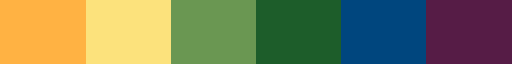

In [342]:
saez_hex_cmap

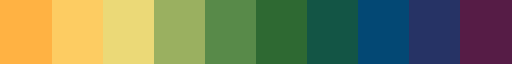

In [343]:
saez_full_cmap

In [344]:
expanded_cmap

['#ffb243',
 '#fdcd63',
 '#ecda77',
 '#9bb060',
 '#598a49',
 '#2e6a33',
 '#135546',
 '#034975',
 '#263365',
 '#561c46']

In [345]:
saez_colors

['#ffb243', '#FCE27C', '#6a9752', '#1d5d2a', '#00467e', '#561C46']

## Fig1 - CPEt x RTt 

In [350]:

# plt_hex = '#1d5d2a'
plt_hex = '#06470c'
# plt_hex = '#1d5d2a'

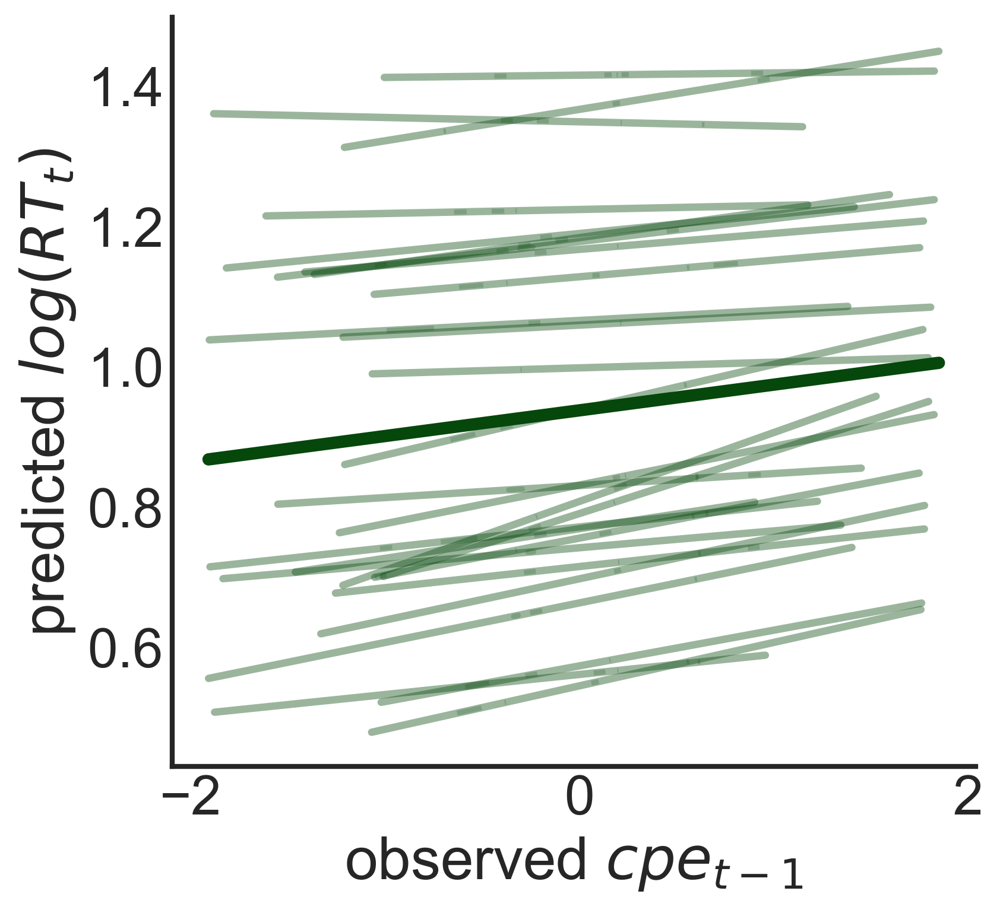

In [367]:
plt.figure(figsize=(5.5,5),dpi=300,constrained_layout=True)

sns.lineplot(data=line_plot_df, x='decisionCPE',y='fe_regline_yPred',alpha=1,linewidth=5,color=plt_hex)
sns.lineplot(data=line_plot_df, x='decisionCPE',y='subj_regline_yPred',linewidth=3,alpha=0.4,  #color=plt_hex,
             style='subj_id',legend=False,color=plt_hex,dashes=False)
plt.tick_params(length=0)#,grid_linewidth=1)

# plt.xlabel(r'observed $cpe_{{{t-1}}}(z)$')
plt.xlabel(r'observed $cpe_{{{t-1}}}$')

plt.ylabel(r'predicted $log(RT_t)$')
# plt.ylim([0.25,1.75])

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.1f}')) 

sns.despine()

plt.savefig(f'{proj_fig_dir}RT_CPE_rand_reglines{date}.pdf',dpi=300,metadata=None,
            format='pdf',bbox_inches='tight',pad_inches=0.1,
            facecolor='auto', edgecolor='auto',backend=None)



In [352]:
line_plot_df.groupby('subj_id').agg('mean')

,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
subj_id,,,,,,,,,,,,,
DA023,14.0,74.205479,75.205479,0.898497,-1.520853e-18,-1.383977e-16,1.901067e-18,3.041707e-18,0.663058,0.056394,0.019779,0.663058,0.937684
DA026,19.0,78.834586,79.834586,1.315804,6.051968e-18,2.704603e-16,1.106049e-17,2.921640e-18,1.224178,0.005674,-0.030941,1.224178,0.937684
DA037,4.0,76.713235,77.713235,0.921571,6.938894e-18,-5.551115e-17,7.704213e-18,1.632681e-17,0.697401,0.058872,0.022257,0.697401,0.937684
DA039,22.0,73.041667,74.041667,1.293881,5.551115e-18,4.625929e-18,0.000000e+00,-1.063964e-17,1.189888,0.027037,-0.009579,1.189888,0.937684
DA8,13.0,74.993243,75.993243,0.871931,-2.351254e-17,9.751959e-17,1.275256e-17,3.375678e-18,0.830446,0.017117,-0.019499,0.830446,0.937684
MS002,14.0,75.767123,76.767123,0.727029,1.863045e-17,1.672939e-17,1.368768e-17,9.315227e-18,0.561050,0.028657,-0.007959,0.561050,0.937684
MS003,8.0,74.929577,75.929577,1.168549,-1.075040e-17,3.831051e-17,-5.863854e-18,-8.209396e-18,1.059243,0.014146,-0.022469,1.059243,0.937684
MS009,16.0,74.993243,75.993243,0.895632,-4.875980e-18,-1.756290e-16,-9.001808e-18,-7.313969e-18,0.771427,0.029896,-0.006720,0.771427,0.937684
MS011,13.0,75.942029,76.942029,1.227465,3.016910e-17,-1.279170e-16,-1.609019e-18,7.642840e-18,1.065900,0.014539,-0.022077,1.065900,0.937684


## BDI-II CPE slope correlation plot!

In [353]:
line_plot_df

,subj_id,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,GambleChoice,TrialType,TrialType_t1,GambleChoice_t1,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
0,MS002,14,1,2,0.670167,-0.395746,-1.028523,safe,mix,loss,gamble,-0.277154,-0.437011,0.561050,0.028657,-0.007959,0.549709,0.923193
1,MS002,14,2,3,0.459614,-0.444540,-1.343507,gamble,loss,gain,gamble,0.804125,-0.278164,0.561050,0.028657,-0.007959,0.548311,0.921406
2,MS002,14,3,4,0.912929,0.732629,-0.786483,gamble,gain,mix,safe,0.382163,0.807292,0.561050,0.028657,-0.007959,0.582044,0.964509
3,MS002,14,4,5,0.570378,0.439861,-0.786483,safe,mix,gain,gamble,0.241509,0.383699,0.561050,0.028657,-0.007959,0.573655,0.953789
4,MS002,14,5,6,0.631657,0.403265,-0.375346,gamble,gain,mix,safe,-0.294736,0.242502,0.561050,0.028657,-0.007959,0.572606,0.952449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3710,DA039,22,145,146,0.076684,-0.320285,0.655965,gamble,gain,gain,gamble,0.817155,0.320836,1.189888,0.027037,-0.009579,1.181228,0.925956
3711,DA039,22,146,147,0.608282,0.745335,0.993053,gamble,gain,mix,safe,-0.773371,0.739507,1.189888,0.027037,-0.009579,1.210039,0.964974
3712,DA039,22,147,148,1.393768,0.877041,0.993053,safe,mix,mix,safe,-0.049592,-0.813065,1.189888,0.027037,-0.009579,1.213600,0.969797
3713,DA039,22,148,149,1.152830,-0.266405,0.993053,safe,mix,mix,safe,-0.308723,-0.106558,1.189888,0.027037,-0.009579,1.182685,0.927929


In [354]:
line_plot_df.groupby('subj_id').agg('mean')

,bdi,Round,Round_t1,logRT_t1,decisionCPE,TotalProfit,TrialEV_t1,TrialEV,subj_plot_b0,subj_plot_bCPE,subj_raw_bCPE,subj_regline_yPred,fe_regline_yPred
subj_id,,,,,,,,,,,,,
DA023,14.0,74.205479,75.205479,0.898497,-1.520853e-18,-1.383977e-16,1.901067e-18,3.041707e-18,0.663058,0.056394,0.019779,0.663058,0.937684
DA026,19.0,78.834586,79.834586,1.315804,6.051968e-18,2.704603e-16,1.106049e-17,2.921640e-18,1.224178,0.005674,-0.030941,1.224178,0.937684
DA037,4.0,76.713235,77.713235,0.921571,6.938894e-18,-5.551115e-17,7.704213e-18,1.632681e-17,0.697401,0.058872,0.022257,0.697401,0.937684
DA039,22.0,73.041667,74.041667,1.293881,5.551115e-18,4.625929e-18,0.000000e+00,-1.063964e-17,1.189888,0.027037,-0.009579,1.189888,0.937684
DA8,13.0,74.993243,75.993243,0.871931,-2.351254e-17,9.751959e-17,1.275256e-17,3.375678e-18,0.830446,0.017117,-0.019499,0.830446,0.937684
MS002,14.0,75.767123,76.767123,0.727029,1.863045e-17,1.672939e-17,1.368768e-17,9.315227e-18,0.561050,0.028657,-0.007959,0.561050,0.937684
MS003,8.0,74.929577,75.929577,1.168549,-1.075040e-17,3.831051e-17,-5.863854e-18,-8.209396e-18,1.059243,0.014146,-0.022469,1.059243,0.937684
MS009,16.0,74.993243,75.993243,0.895632,-4.875980e-18,-1.756290e-16,-9.001808e-18,-7.313969e-18,0.771427,0.029896,-0.006720,0.771427,0.937684
MS011,13.0,75.942029,76.942029,1.227465,3.016910e-17,-1.279170e-16,-1.609019e-18,7.642840e-18,1.065900,0.014539,-0.022077,1.065900,0.937684


In [355]:
line_plot_df.groupby('subj_id').agg('mean').bdi

subj_id
DA023    14.0
DA026    19.0
DA037     4.0
DA039    22.0
DA8      13.0
MS002    14.0
MS003     8.0
MS009    16.0
MS011    13.0
MS015    26.0
MS016    10.0
MS017    26.0
MS019    12.0
MS022    10.0
MS024    16.0
MS025    10.0
MS026     9.0
MS027    22.0
MS028    13.0
MS029    32.0
MS030    19.0
MS033    39.0
MS035    15.0
MS041    10.0
MS043    23.0
MS048    19.0
MS050     9.0
Name: bdi, dtype: float64

In [356]:
line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE

subj_id
DA023    0.056394
DA026    0.005674
DA037    0.058872
DA039    0.027037
DA8      0.017117
MS002    0.028657
MS003    0.014146
MS009    0.029896
MS011    0.014539
MS015    0.038443
MS016    0.044784
MS017    0.064665
MS019    0.055000
MS022    0.003192
MS024    0.042144
MS025    0.024018
MS026   -0.006140
MS027    0.032693
MS028    0.050872
MS029    0.098161
MS030    0.008030
MS033    0.088900
MS035    0.022810
MS041    0.030161
MS043    0.061848
MS048    0.053008
MS050    0.023700
Name: subj_plot_bCPE, dtype: float64

In [357]:
spearmanr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


SpearmanrResult(correlation=0.43467875778386544, pvalue=0.023465839643836976)

In [358]:
# stats_summary_df.rho[stats_summary_df.model_id == final_model_id].values[0]

pearsonr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

PearsonRResult(statistic=0.5801692172376026, pvalue=0.0015126098578951985)

In [359]:
stats_summary_df.rho_pval[stats_summary_df.model_id == final_model_id].values[0]

0.0015126098578951985

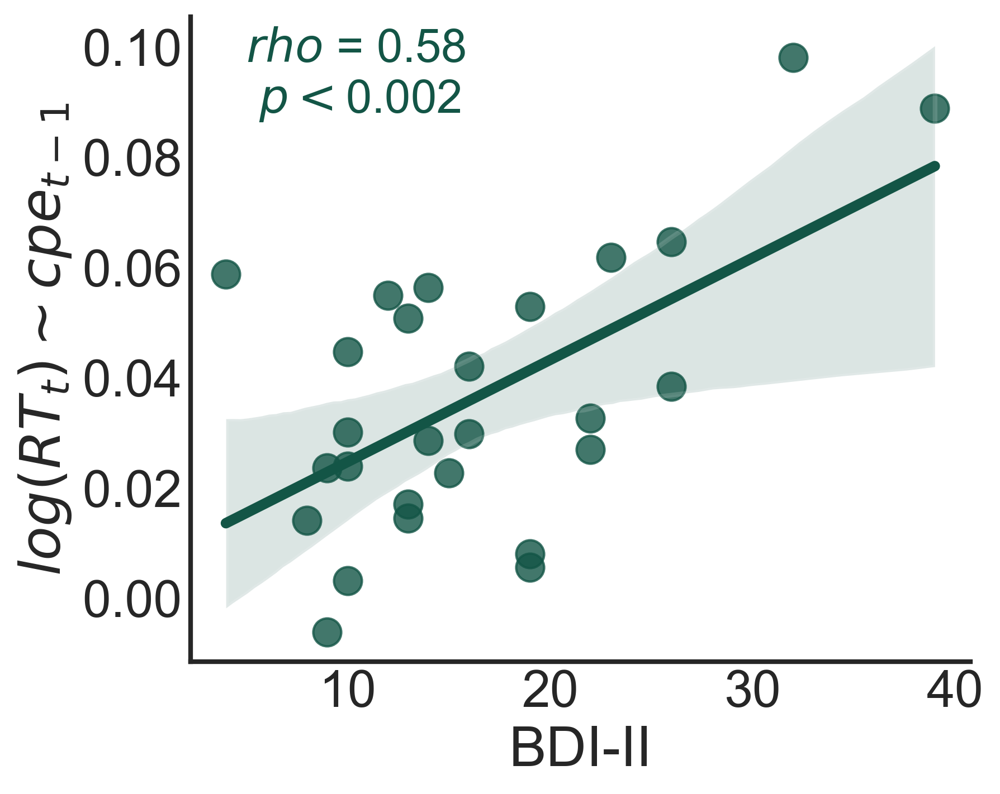

In [363]:
fig,ax = plt.subplots(figsize=(6,5),dpi=300)
sns.set_context("poster",rc={'axes.linewidth': 2})

 
# sns.regplot(ax=ax,data=line_plot_df.groupby('subj_id').agg('mean'),x='bdi',y='subj_plot_bCPE',fit_reg=True,color = '#135546',ci=95) #ffb243  1d5d2a
sns.regplot(ax=ax,data=line_plot_df.groupby('subj_id').agg('mean'),x='bdi',y='subj_plot_bCPE',fit_reg=True,color = '#135546',ci=95) #ffb243  1d5d2a 135546 125549
plt.tick_params(length=0)#,grid_linewidth=1)

# plt.ylabel('cpe sensitivity')
plt.ylabel(r'$log(RT_t) \sim cpe_{{{t-1}}}$')
plt.xlabel('BDI-II')

plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:,.2f}')) 

rho, rho_p = pearsonr(line_plot_df.groupby('subj_id').agg('mean').bdi,line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)

# plt.text(30,0.012,r"$\rho$"+f'{np.round(r,3)} \n p: {np.round(p_r,4)}',fontsize=12)

plt.text(np.min(line_plot_df.groupby('subj_id').agg('mean').bdi)+1,
         np.max(line_plot_df.groupby('subj_id').agg('mean').subj_plot_bCPE)-0.01,
         r'$rho$ = '+ f'{np.round(rho,2)} ' + '\n ' + r'$p < $'+ f'{np.round(rho_p,3)}',color='#135546',fontsize=20)

sns.despine()

plt.savefig(f'{proj_fig_dir}BDI_RT_Cpe_slope{date}.pdf',dpi=300,metadata=None,
            format='pdf',bbox_inches='tight',pad_inches=0.1,
            facecolor='auto', edgecolor='auto',backend=None)




In [25]:
# alternate_vars = ['Profit']

# for alt_var in alternate_vars:

#     alt_combos = [[v,alt_var] for v in test_vars]

#     for i in range(1,len(test_vars)-1):
#         iter_list = [list(tup)+[alt_var] for tup in list(itertools.combinations(test_vars,i+1))]
#             # remove var combos that contain Choice + Trial Type for the *same trial* only bc they are collinear
#         iter_list = [combo for combo in iter_list if ('GambleChoice_t1' in combo and 'TrialType_t1' not in combo)|
#                     ('GambleChoice_t1' not in combo and 'TrialType_t1' in combo)|('GambleChoice_t1'not in combo and 
#                                                                                         'TrialType_t1' not in combo)]
#         iter_list = [combo for combo in iter_list if ('GambleChoice' in combo and 'TrialType' not in combo)|
#                     ('GambleChoice' not in combo and 'TrialType' in combo)|('GambleChoice'not in combo and 'TrialType' not in combo)]
        
#         iter_list = [combo for combo in iter_list if ('Outcome' in combo and 'Profit' not in combo)|
#                 ('Outcome' not in combo and 'Profit' in combo)|('Outcome'not in combo and 'Profit' not in combo)]

#         iter_list = [combo for combo in iter_list if ('GambleEV_t1' in combo and 'TrialEV_t1' not in combo)|
#             ('GambleEV_t1' not in combo and 'TrialEV_t1' in combo)|('GambleEV_t1'not in combo and 'TrialEV_t1' not in combo)]
        
#         iter_list = [combo for combo in iter_list if ('rpe' in combo and 'Profit' not in combo)|
#             ('rpe' not in combo and 'Profit' in combo)|('rpe'not in combo and 'Profit' not in combo)]
    
#         var_combos.extend(iter_list)

# var_combos

In [ ]:
def mixed_effects_ftest_ttest(model_fit,stattest = 'both'):
    
    '''
    input to t_test is hypothesis = string of concatenated tuples of hypotheses to test (sig diff from zero?)
    # this only works for ols i think! - hypothesis = (',').join(['('+var+'=0)' for var in ttest_vars])

    '''
    # create identity matrix from fit.k_fe num fixed effects params
    if stattest == 'both':
        # run one sample t tests for all fixed effects regressors 
        R_ttest = np.identity(model_fit.k_fe)[1:,:]
        ttest = model_fit.t_test(R_ttest,use_t=True)
        ftest = model_fit.f_test(np.identity(len(model_fit.params))[1:,:])

    return (ttest.summary_frame(),ftest)
# https://www.statsmodels.org/dev/generated/statsmodels.discrete.discrete_model.LogitResults.f_test.html#statsmodels.discrete.discrete_model.LogitResults.f_test
